### <font color='darkcyan'>Dervla Scully 18329511</font>

In [1]:
import networkx as nx
import pandas as pd
import seaborn as sns
import json
import itertools
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
import matplotlib.colors as mcolors
import operator
from datetime import datetime
from email.utils import parsedate
from matplotlib.lines import Line2D
from networkx import NetworkXError
import matplotlib.lines as mlines
from networkx.algorithms import bipartite

pd.options.display.max_rows = None
pd.options.display.max_columns = None

# <font color='teal'>COMP30850 Assignment 2 - Social Media Network Analysis</font>

Chosen Twitter List: __Education__

Task: 

(i) construct and (ii) characterise the following five different Twitter network representations from the chosen list:

1. Follower network
2. Reply network
3. Mention network
4. User-hashtag network
5. Hashtag co-occurrence network

## <font color='darkcyan'>Task 1: Follower Network</font>

For the follower network I will construct an unweighted directed network, where an edge from node A to node B indicates that A follows B.

friendships.csv is a tab-separated text file, indicating the friend/follower relations between pairs of list members. The two columns contain a pair of ordered screen names X and Y, indicating that user X follows user Y. 

__Construct Follower network__

In [2]:
# construct unweighted directed follower network from the friendships csv file, in which each line is an edge
gFollowers = nx.read_edgelist("education/friendships.csv" , delimiter = "\t", create_using=nx.DiGraph)
print("Follower network constructed.")

Follower network constructed.


__Number of nodes and edges__

In [3]:
print("Number of nodes:\t", gFollowers.number_of_nodes(), "\nNumber of edges:\t", gFollowers.number_of_edges())

Number of nodes:	 33 
Number of edges:	 454


__Visualising the Network__

In [4]:
nodeLabels=dict(zip(gFollowers.nodes(), gFollowers.nodes()))

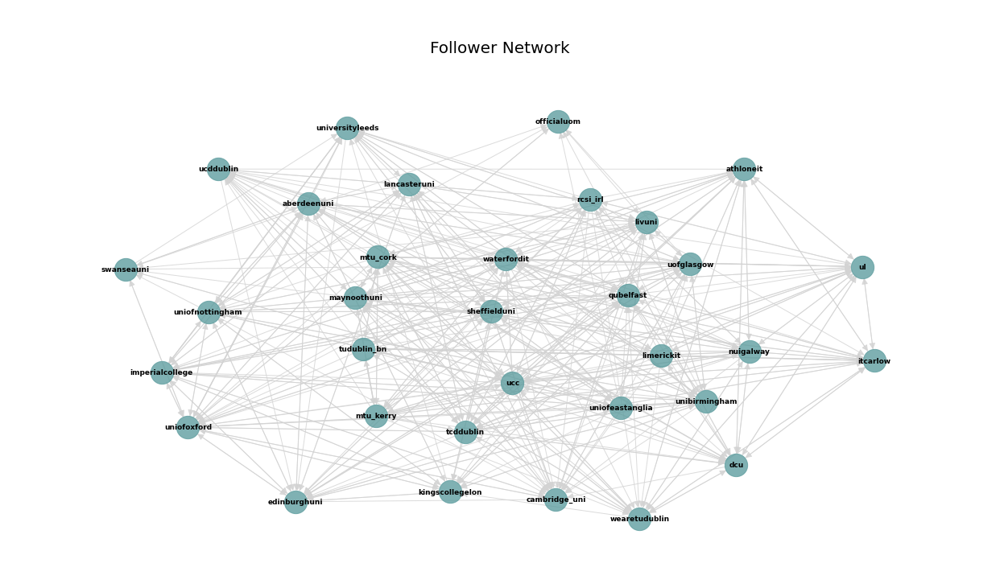

In [5]:
plt.figure(figsize=(22, 12))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(gFollowers, k = 2.4)

nx.draw(gFollowers, pos,  node_size=800,  node_color="cadetblue", edge_color="lightgray", alpha=0.8, arrowsize=16)
nx.draw_networkx_labels(gFollowers, pos, nodeLabels, font_size=9, font_color='black', font_weight="bold")

label="\n\nFollower Network"
plt.title(label = label, fontsize = 20)
plt.show()

__Strongly Connected__

A directed network such as this is said to be strongly connected if every node is reachable from every other node.

In [6]:
print(nx.is_strongly_connected(gFollowers))

True


We can see that our network is strognly connected, so there is a path from every node to every other node.

__Network Density__

To characterise the network structure we can look at the network density. Network density refers to the portion of potential edges between nodes in a network that exist as actual edges.

Density is calculated numerically as the ratio of existing edges over the total number of potential edges between all pairs of nodes.

In [7]:
print("Density %.2f" % nx.density(gFollowers))

Density 0.43


The density of the network is 0.43, which means that of all possible edges in the network, 43% of these are actual edges. Of a possible 1056 edges there are 454. So, our follower network is quite dense.

__Diameter__

A network’s diameter is the maximum distance between all pairs of its nodes - i.e. the longest shortest path in the entire network. The diameter tells us how quickly information can be transmitted across the entire network. The higher the diameter, the less linked a network tends to be.

In [8]:
print("Follower Network Diameter: ", nx.diameter(gFollowers))

Follower Network Diameter:  4


The diameter, or the longest shortest path in the network is 4, i.e. it takes a maximum of 4 hops to get from any user to another in the follower network.

We can plot one such shortest path:

In [9]:
def longestShortestPath(g):

    pathLengths = {}
    
    # get the shortest path between all pairs of nodes
    # this is a dictionary where the keys are nodes (call these sources) and the value are dictionaries with key 
        # nodes (targets) and values distances from the source node to each of the target nodes.
    shortestPaths = dict(nx.all_pairs_shortest_path_length(g))
    
    # for each source node (keys of the dictionary)
    for node in shortestPaths:

        # for each of their target nodes
        # (keys of the dictionary which is the value in the outter dictionary for the current source node)
        for path in shortestPaths[node]:

            # source and target id as a string is key
            key = "%s, %s" % (node, path)
            
            # set value in pathLengths dictionary at this key to the shortest path between them
            pathLengths[key] = shortestPaths[node][path]

    # get the longest path in the pathLengths dictionary
    # this is the longest shortest path in the network
    # we now have a distance and source, target node for the longest shortest path
        # (one such pair of source,target nodes with longest shortest path as distance if there are multiple)
        
    # get key (source, target) of longest path
    longest = max(pathLengths.keys(), key=(lambda key: pathLengths[key]))
    
    # get the shortest path between these two nodes 
    # (all nodes that you must go through in order to get from one of these nodes to the other)
    
    path = nx.shortest_path(g, longest.split(", ")[0], longest.split(", ")[1])
    
    print("Longest Shortest Path = ", path)
    print("\nPath Length == Diameter:",nx.diameter(g) == len(path)-1)
    
    return path

In [10]:
# source and target are the nodes with the longest shortest path between them

def drawDiameter(G, pos, node_list, source, target):
    
    plt.figure(3, figsize=(18,8)) 
    
    # get the shortest path between the two nodes
    path = nx.shortest_path(G,source,target)
    path_edges = zip(path,path[1:])
    path_edges = set(path_edges)
    
    # draw the simple graph
    nx.draw(G,pos,node_color='cadetblue', edge_color="lightgray", node_size=800)
    
    # add the nodes along the longest shortest path on top of this in red
    nodes = nx.draw_networkx_nodes(G,pos,nodelist=path,node_color='r', node_size=800)

    # add the edges along the longest shortest path on top of this in red
    nx.draw_networkx_edges(G,pos,edgelist=path_edges,edge_color='r',width=2, arrowsize=22)

    # label the nodes along the longest shortest path
    labels = {}    
    for node in node_list:labels[node] = node
                
    labelNodes = nx.draw_networkx_labels(G,pos,labels,font_size=10,font_color='black', font_weight="bold")

    title = "\n\nGraph of Follower Network Showing Longest Shortest-Path (Diameter)\n"
    plt.title(label = title, fontsize = 20)

    
    plt.show()

Longest Shortest Path =  ['cambridge_uni', 'lancasteruni', 'tcddublin', 'itcarlow', 'tudublin_bn']

Path Length == Diameter: True


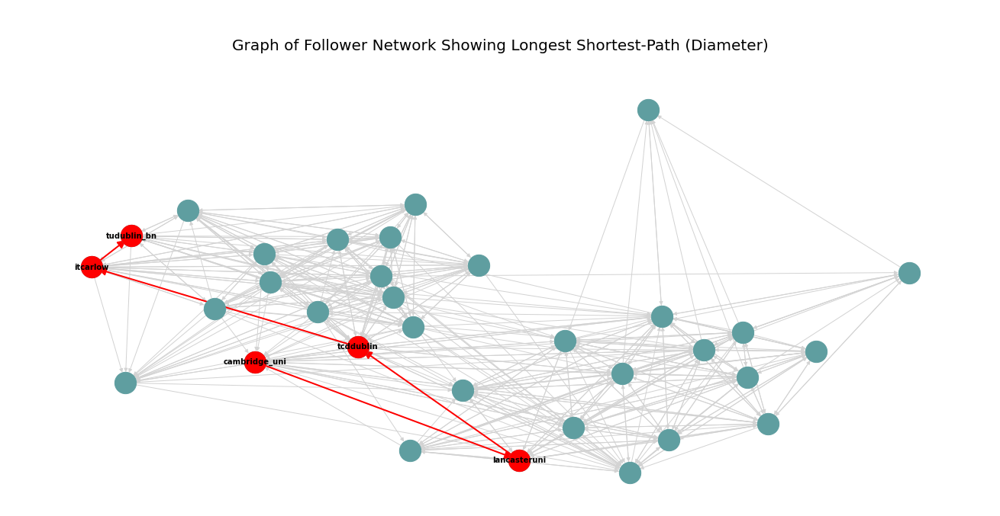

In [11]:
path=longestShortestPath(gFollowers)
pos = nx.spring_layout(gFollowers, seed=675, k=1)
drawDiameter(gFollowers, pos, path, path[0], path[len(path)-1])

As we can see, one path in the network which has a distance equal to the diameter, 4, is from cambridge_uni to limerickit. cambridge_uni follows lancasteruni, which follows tcddublin, which follows athloneit, which follows limerickit.

__Reciprocity__

Reciprocity is a measure of the fraction of reciprocated edges in a directed network - i.e. the ratio of the number of edges pointing in both directions to the total number of edges in the network.

In [12]:
print("Reciprocity %.2f" % nx.reciprocity(gFollowers) )

Reciprocity 0.78


The reciprocity is 0.78, meaning that 78% of the edges in the network are reciprocated. 

We can visualise this by drawing a plot of the network again and colouring the reciproacted and non-reciprocated edges in different colours. 

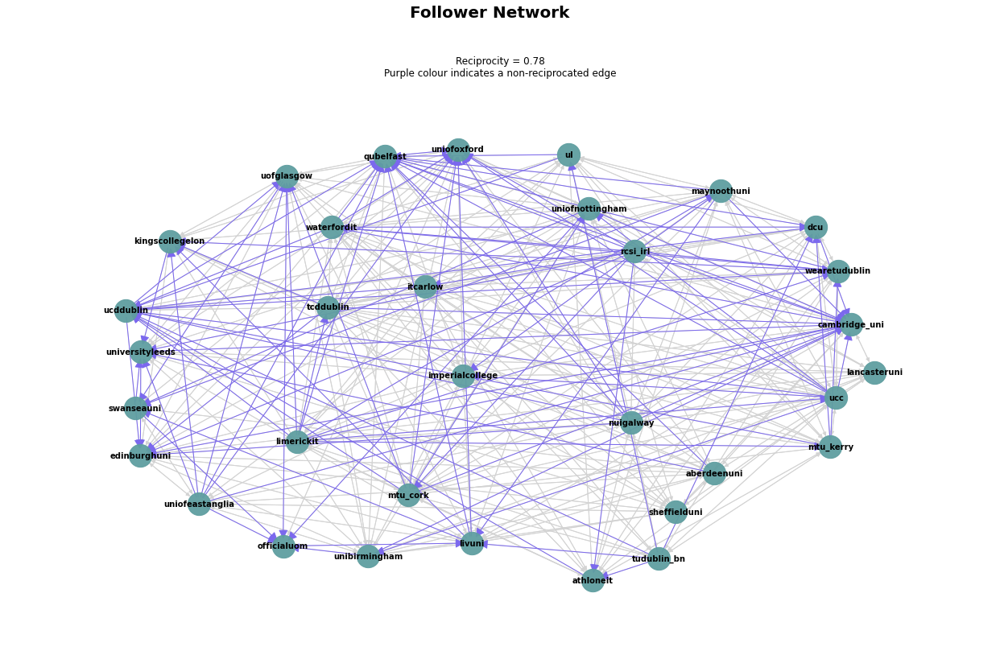

In [13]:
plt.figure(figsize=(22, 13))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(gFollowers, k = 2.8)

nx.draw(gFollowers, pos, with_labels = False, node_size=800, node_color="cadetblue", edge_color="lightgray", alpha=0.95)
nx.draw_networkx_labels(gFollowers, pos, nodeLabels, font_size=10, font_color='black', font_weight="bold")

edgelist=[]
for follower, followee in gFollowers.edges():
    if(not gFollowers.has_edge(followee, follower)):
        edgelist.append([follower, followee])
        
nx.draw_networkx_edges(gFollowers, pos, edgelist=edgelist, edge_color="mediumslateblue", arrowsize=24)

print("\n\n")
label="  Follower Network"
plt.suptitle(t=label, fontsize=20, fontweight="bold")

label="\nReciprocity = " + str(round(nx.reciprocity(gFollowers), 2)) + "\nPurple colour indicates a non-reciprocated edge"
plt.title(label = label, fontsize = 12)

plt.show()

This plot shows the non-reciprocated edges in red. There are 100 non-reciprocated edges and 354 reciprocated edges (which is shown on the graph as 354/2=177 edges with an arrow on both ends).

__Clustering Coefficient__

Clustering coefficient indicates the level of concentration of edges in the neighbourhood of a node. It is the fraction of pairs of its neighbours (where a neighbour of a node is a node that the node has an edge to) that have edges between one another - i.e. how many closed triads around this node. For directed graphs such as this, the direction of the edges aere ignored.

(Closed triad = if a node A is connected to nodes B and C, and B and C are also connected (B->C or C->B or both), then A, B and C form a closed triad.)

We can calculate the average clustering coefficient of all of the nodes in the network.

In [14]:
print("Follower Network Average Clustering Coefficient: ", round(nx.average_clustering(gFollowers), 3))

Follower Network Average Clustering Coefficient:  0.727


As we can see the average clustering coefficient is quite high, at 0.727. On average, about 73% of a node's neighbours are also connected.

__Add Country Attribute to each Node__

We can add a country attribute to each node to see how the users in the different countries interact, and see how the various centrality measures are distributed for each country.

In [15]:
def countryAttribute(g):

    # list of each country and the colleges/universities in that country from the dataset
    england = ['cambridge_uni', 'imperialcollege', 'kingscollegelon', 'lancasteruni', 'livuni', 'sheffielduni', 'unibirmingham', 'uniofeastanglia', 'uniofnottingham', 'uniofoxford', 'universityleeds', 'officialuom']
    scotland = ['aberdeenuni', 'edinburghuni', 'uofglasgow']
    wales = ['swanseauni']
    ireland = ['qubelfast', 'dcu', 'athloneit', 'itcarlow', 'limerickit', 'maynoothuni', 'mtu_cork', 'mtu_kerry', 'nuigalway', 'rcsi_irl', 'tcddublin', 'tudublin_bn', 'ucc', 'ucddublin', 'ul', 'waterfordit', 'wearetudublin'] 

    # add country attribute to each node
    for node in g.nodes():
        if node in england:
            g.nodes[node]["Country"]="England"
        elif node in scotland:
            g.nodes[node]["Country"] = "Scotland"
        elif node in wales:
            g.nodes[node]["Country"] = "Wales"
        else:
            g.nodes[node]["Country"]="Ireland"
countryAttribute(gFollowers)

In [16]:
# construct a colour map with a different colour for each country
countryColours={"England":"red", "Scotland":"royalblue", "Wales":"darkorange", "Ireland":"forestgreen"}
color_map = []
for node in gFollowers.nodes():
    color_map.append(countryColours[gFollowers.nodes[node]["Country"]])

In [17]:
# construct legend lines for each country / colour
legendLines=[]
for c in countryColours:
    legendLines.append(Line2D([0], [0], color=countryColours[c], lw=4))

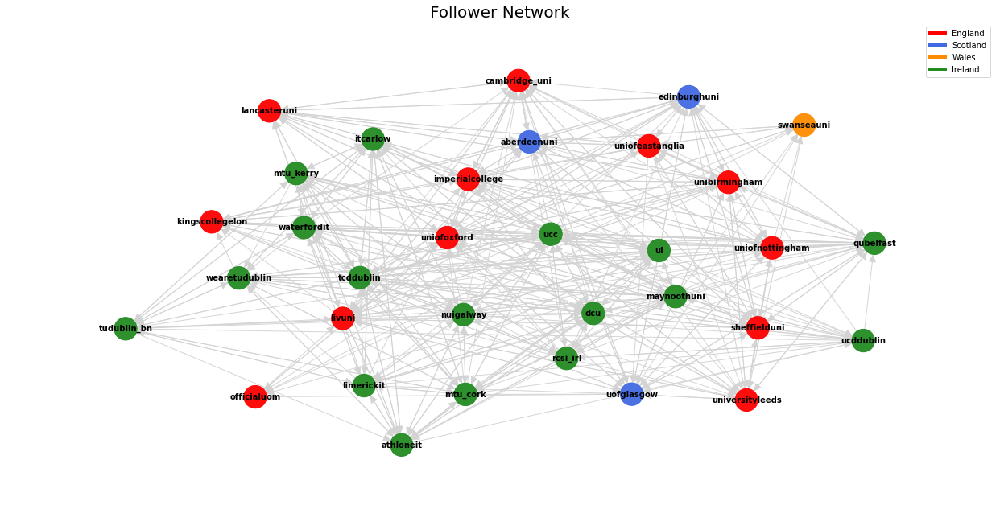

In [18]:
plt.figure(figsize=(22, 11))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(gFollowers, k = 2.4)

nx.draw(gFollowers, pos, node_color=color_map, node_size=800, edge_color="lightgray", alpha=0.95, arrowsize=20)
nx.draw_networkx_labels(gFollowers, pos, nodeLabels, font_size=10, font_color='black', font_weight="bold")

label="Follower Network"
plt.title(label = label, fontsize = 20)
plt.legend(legendLines, countryColours.keys())

plt.show()

There are 12 college/uni accounts from England, 17 from Ireland, 3 from Scotland and 1 from Wales.

In [19]:
# G = the graph
# pos = e.g. nx.spring_layout(g1, seed=675, k=1.6)
# measure = the centrality measure, as a dictionary of node ID : value of centrality measure
# measure name = name of centrality measure
# size = value for determining node size

def draw(G, pos, measures, measure_name, title, size, font=9, width=18, height=8):
    
    plt.figure(3, figsize=(width,height)) 
    
    # draw nodes - size and colour determined by value of centrality measure
    nodes = nx.draw_networkx_nodes(G, 
                                   pos,
                                   node_size=[v * size for v in measures.values()], # node size
                                   cmap=plt.cm.Greens, 
                                   node_color=list(measures.values()), # node colour
                                   nodelist=measures.keys())
    
#     nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1, base=10))
    nx.draw_networkx_labels(G, pos, dict(zip(G.nodes(), G.nodes())), font_size=10, font_color='grey', font_weight="bold")
    
    # draw edges
    edges = nx.draw_networkx_edges(G, pos, edge_color="whitesmoke")
        
    # remove axis
    plt.axis('off')
            
    # add title
    label = "\nNode size and colour indicates " + measure_name + "\n"
    plt.title(label = label, fontsize = 10)
    
    plt.suptitle(t = title,  fontsize = 20, y=0.99, x=0.505)

    plt.show()

In [20]:
# print min, max, mean, median for a given centrality measure
def measureStats(measure, measure_name, r=0):
    
    df=pd.Series(measure, index=measure.keys())
    
    print(measure_name, "Summary Statistics:")
    print("\tMin: ", round(df.min(), r))
    print("\tMax: ", round(df.max(), r))
    print("\tMean: ", round(df.mean(), r))
    print("\tMedian: ", round(df.median(), r))

In [21]:
# plot histpgoram / density plot
# measure = the centrality measure, as a dictionary of nodes ID : value of centrality measure
# measure name = name of centrality measure
# kde = print kernel density estimation

def densityPlot(measure, measure_name, height=10, width=6, bins=15,adjust=True, max=1, min=0, step=1, kde=True):
    
    plt.figure(figsize=(width, height))
    
    sns.histplot(list(measure.values()), 
                 kde=kde, bins=bins, color = 'cadetblue', stat= 'probability')    
    
    plt.title("Distribution of " + measure_name, fontsize=14)
    plt.xlabel("\n"+measure_name, fontsize=11)
    plt.ylabel("Probability (k)\n", fontsize=11)
    
    if adjust: plt.xticks(np.arange(min, max, step))
        
    plt.grid(axis='y', alpha=0.2)
    mpl.rcParams['axes.spines.right'] = False
    mpl.rcParams['axes.spines.top'] = False


    plt.show()

### Degree Centrality

For directed networks we distinguish between:

    In-degree: count of number of incoming edges for each node.
    Out-degree: count of number of outgoing edges for each node.

In the case of this twitter follower network, the in-degree of a node is the number of other users in the network that the user follows. The out-degree is the number of users in the network that follow the user.

Intuitively, a node with more edges coming in (in-degree), in this case indicating more followers within the network, is more important than a node with less followers, as more users can see its content and so it has more influence in the network. Degree centralities (both in and out) are local and depend only on the node neighbourhood. A node with a high in-degree or out-degree centrality may be capable of affecting a lot of neighbours in its neighbourhood at once.

__In-Degree Centrality Distribution__

We can begin by looking at the distributions of the in-degree centralities - the normalised in-degrees. We can do so by looking at the probability distribution, where Probability(k) = fraction of all nodes in the network with in-degree k

In-Degree Centrality Summary Statistics:
	Min:  0.188
	Max:  0.688
	Mean:  0.43
	Median:  0.438


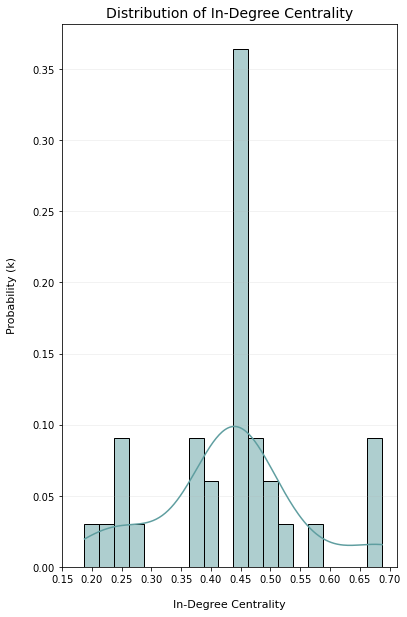

In [22]:
measureStats(nx.in_degree_centrality(gFollowers), "In-Degree Centrality", r=3)
densityPlot(nx.in_degree_centrality(gFollowers), "In-Degree Centrality", bins=20, min=0.15,max=0.75, step=0.05)

The range of in-degree centrality scores for the follower network is 0.188-0.688, i.e. each of the university/college twitter accounts in the network are folllowed by between 18% and 69% of the other university/college accounts in the network.

The distribution looks approximately normal with very long left and right tails. 18% of nodes in the network have an in-degree centrality below 30%. 15% have in-degree centrality between 0.36-0.41%. The highest peak can be seen at about 0.44-0.46% in-degree centrality. 36% of the nodes have in-degree centrality score within this range. So 36% of nodes in the network are followed by about 45% of the other nodes in the network. 21% have a score between 0.46 and 0.59. Finaly, 9% of nodes in the network have an in-degree centrality score between 0.66-0.68. 

The mean in-degree centrality score is 0.43, so on average the nodes in the network are followed by 43% of the other nodes in the network. The median is 0.44.

As we can see, few nodes in the network are followed by very few other nodes (<30%), and few nodes are followed by a very large fraction of the nodes in the network (>70%), while the majority of nodes in the network (approx 72%) are followed by between 36-59% of the other nodes in the network.

We can plot the network again and let the node size and colour indicate the in-degree: 

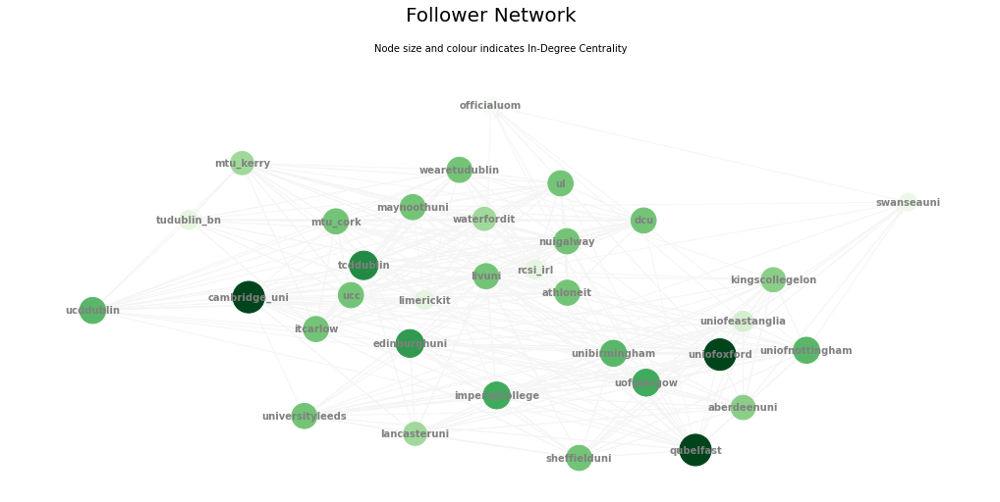

In [23]:
pos = nx.spring_layout(gFollowers, seed=675, k=1.6)
draw(gFollowers, pos, nx.in_degree_centrality(gFollowers), "In-Degree Centrality", title="Follower Network", size=1500, font=8, width=18, height=8)

We can see that the University of Cambridge, the University of Oxford and Queens University Belfast have the highest in-degree centrality scores. The Universities of Manchaster and Swansea have very low in-degree centrality scores.

__Out-Degree Centrality Distribution__

Next we can look at the distribution of the out-degree centralities.

Out-Degree Centrality Summary Statistics:
	Min:  0.062
	Max:  0.625
	Mean:  0.43
	Median:  0.438


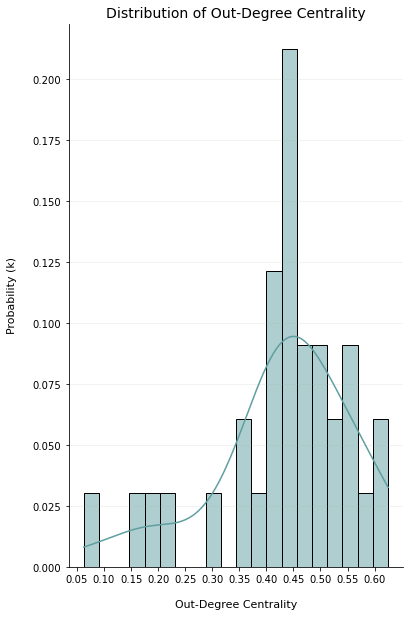

In [24]:
measureStats(nx.out_degree_centrality(gFollowers), "Out-Degree Centrality", r=3)
densityPlot(nx.out_degree_centrality(gFollowers), "Out-Degree Centrality", min=0.05, max=0.65, step=0.05, bins=20)

The out degree of a node in the network is equal to the number of users in the network that the nodes follows, and we can normalise this to get the out-degree centrality.

The range of out-degree centrality scores for the follower network is 0.062-0.625, i.e. each of the university/college twitter accounts in the network is following between 6% and 63% of the other university/college accounts in the network. 

The distribution looks approximately bell shaped with a strong skew to the left. About 3% of the college accounts in the network are following 6-8% of the other accounts in the network. 9% are following between about 15%-23%. About 24% are following between 29%-43%. The mean is 43%, so about 36% of the nodes have out-degree centrality score below the mean.

The highest peak can be seen between 43-46%, with around 21% of nodes having out-degree centrality scores within this range. 42% have an out-degree centrality score between 45.5% and the max of 62%. 

So there are a very small number of nodes (about 12%) which are following a very small number of users in the network (<23%). On average the users are following 43% of the other users in the network. Approximately 42% have a high out-degree centrality score above this mean, with a max of 62%.

We can plot the network and let the node colour and size indicate out-degree:

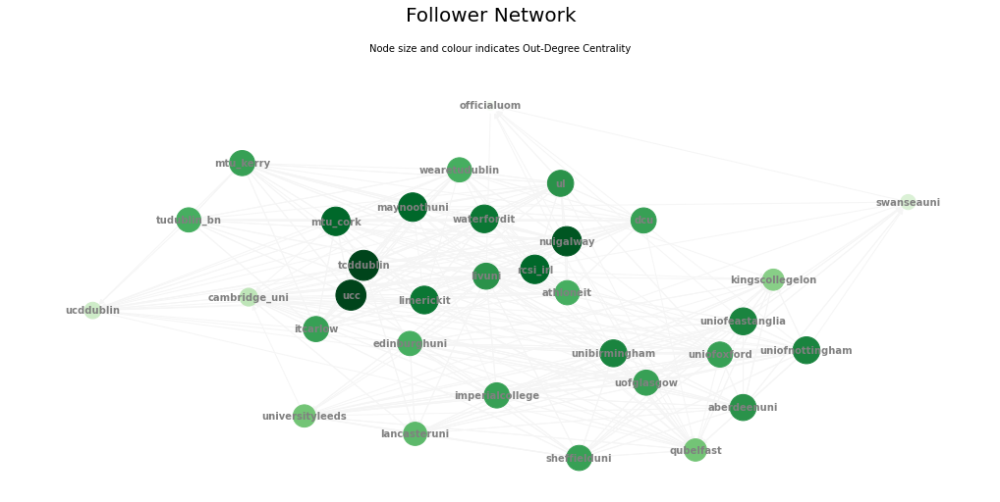

In [25]:
pos = nx.spring_layout(gFollowers, seed=675, k=1.6)
draw(gFollowers, pos, nx.out_degree_centrality(gFollowers), "Out-Degree Centrality", title="Follower Network", size=1500, font=8, width=18, height=8)

Here we can see that UCC, TCD, MTU Cork, NUIG and RCSI have very high in-degree centrality scores. The University of Manchester has the lowest score, followed by Swansea and UCD and Cambridge.

__In-Degree Centralities by Country__

Next we can look at a bar chart of the in-degree centrality scores and encode the country in the colour of the bars. We can order the bars in descending order so that the universities/colleges with the highest and lowest in-degree centrality scores will be immediately visible, as will the countries they are located in.

In [26]:
# measure is a dictionary of the values for a centrality measure
def horizontalBarChart(graph, measure, measureName, color=True, network="Follower"):
    
    # measure dict -> series
    measure = pd.Series(measure).sort_values()

    if color:
        
        # colour map of the colours for each country
        cm = []
        for index in measure.index:
            cm.append(countryColours[graph.nodes[index]["Country"]])
            
        # plot bar chart with color = colour map cm
        ax = measure.plot(kind="barh", color=cm, figsize=(10,8), width=0.7, fontsize=9, zorder=3, alpha=0.8)
        
        # add legend lines constructed previously
        ax.legend(legendLines, countryColours.keys(), fontsize=9)
        
    # plot without country colors
    else:
        ax = measure.plot(kind="barh", color="cadetblue", figsize=(10,8), width=0.7, fontsize=9, zorder=3, alpha=0.8)

    ax.set_xlabel(measureName, fontsize=10)
    ax.set_ylabel(None)
    ax.set_xlim(0)

    ax.set_title(label="\n" + measureName + " of " + network + " Network\n", fontsize=15)

    ax.xaxis.grid(alpha=0.3);

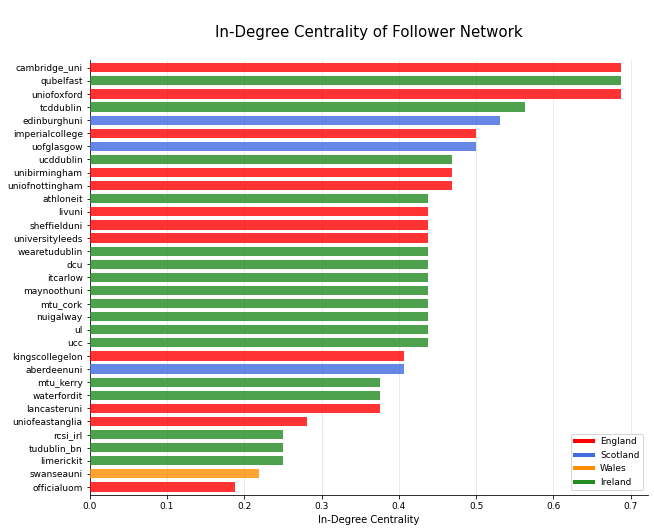

In [27]:
horizontalBarChart(gFollowers, nx.in_degree_centrality(gFollowers), "In-Degree Centrality")

We can see that Cambridge University, Queen's University Belfast and the University of Oxford all have the highest in-degree centrality scores of about 69%. Almost 70% of the nodes in the network follow these universities.

The is followed by Trinity College Dublin with 56%, the University of Edinburgh with 52% and Imperial College and the Univeristy of Glasgow with 50%. University College Dublin, the University of Birmingham and the University of Nottingham all have a score of about 46%. 

At a score of 42% we have the University of Liverpool, the University of Sheffield, the University of Leeds, Technological University Dublin, Dublin City University, IT Carlow, NUI Maynooth, MTU Cork, NUI Galway, The Uniersity of Limerick and University College Cork.

Kings College London and the University of Aberdeen have an in-degree centrality score of about 40.5%. MTU Kerry, Waterforf IT and the University of Lancaster have a score of 38%, the University of East Anglia has 38%, the Royal College of Surgeons, TU Dublin Blanchardstown and Limerick IT have scores of 25%, The University of Swansea has a score of 21%, and finally the University of Manchaster has a score of 19%.

The English colleges/universities seem to have the highest in-degree centrality scores on average, with 67% having in-degree centrality scores in the top 50%. There are 3 Scottish colleges in the dataset and 2 out of 3 of these are in the top 7 in-degree centrality scores. Ireland has 3 colleges in the top 10, with almost half of the Irish collegs having a score of 42%, and a further 5 colleges with a score below this. There is 1 college in the dataset which is located in Wales, the University of Swansea, and it has quite a low score of 21%.  

__Out-Degree Centralities by Country__

Next we can look at a similar bar chart showing the out-degree centrality scores by country.

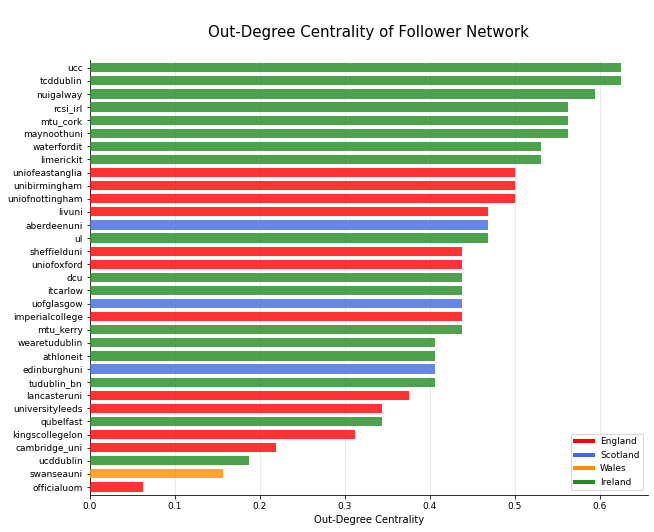

In [28]:
horizontalBarChart(gFollowers, nx.out_degree_centrality(gFollowers), "Out-Degree Centrality")

Here we can immediately see a very large number of Irish colleges with the highest out-degree centrality scores. These are accounts that follow a large portion of the other accounts in the network. We can see UCC and TCD with scores of 62%, followed by NUIG with 59%, RCSI, MTU Cork and NUI Maynooth with 56%, and Waterford IT, and Limerick IT with 52%.

Following this we have the University of East Anglia, the University of Birmingham and the University of Nottingham with 50%, and the University of Liverpool, the University of Aberdeen and the University of Limerick with 46%.

Next we have the University of Sheffield, the University of Oxford, Dublin City University, IT Carlow, the University of Glasgow, Imperial College with 43%, and MTU Cork, TUD, Athlone IT, the University of Edinburgh, and TUB Blanchardstown with 40.5%. Next we have the University of Lancaster with 37%, the University of Leeds and Queens University Belfast with 35%, Kings College with 31%, Cambridge University with 21%, UCD with 19%, the University of Swansea with 15% and the University of Manchaster with 5%.

On average the Irish colleges seem to be following the largest number of other accounts in the network. About 58% of the English colleges/universities are following about 40% of the other universities/colleges in the dataset. The 3 Scottish Universities are all following between 40-50% of the other colleges. The University of Swansea and the University of Manchaster had the lowest in and out degree centrality scores, so it is possible that these accounts are not as active as the other accounts. 

__Comparing In and Out Degree Centrality - Bar Chart__

Next we can plot a grouped bar chart showing in and out degree centrality scores.

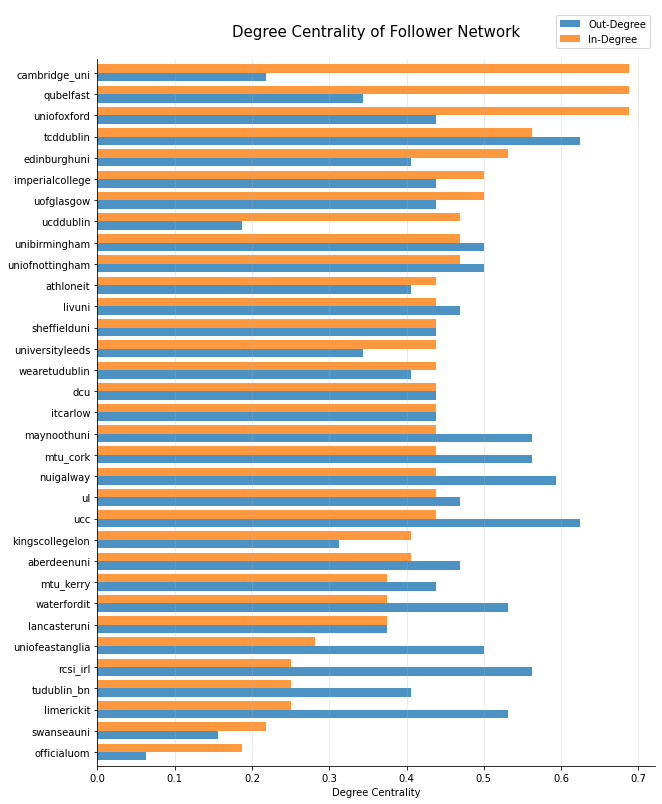

In [29]:
indegree  = pd.Series(nx.in_degree_centrality(gFollowers))
outdegree = pd.Series(nx.out_degree_centrality(gFollowers))
degree=pd.concat([outdegree, indegree], axis=1).rename(columns={1:"In-Degree", 0:"Out-Degree"}).sort_values(by="In-Degree", ascending=True)

ax = degree.plot.barh(width=0.8, figsize=(10,13), fontsize=10, alpha=0.8)

ax.set_xlabel("Degree Centrality", fontsize=10)
ax.set_ylabel(None)

ax.set_title(label="\nDegree Centrality of Follower Network\n", fontsize=15)

ax.legend(bbox_to_anchor=(1, 1.07))


ax.xaxis.grid(alpha=0.3);
plt.show()

The above grouped bar chart is sorted by descenging in-degree centrality. The 3 universities with the highest in-degree centrality scores all have low-average out-degree centrality scores. The universities with the lower in-degree centrality scores, such as RCSI, TUD Blanchardstown and Limerick IT have high out-degree centrality scores.

__Comparing In and Out Degree Centrality - Scatter Plot__

We can plot a scatter plot of in and out degree centrality to see if there is any linear relationship between these measures.

Correlation Coefficient:  0.094 



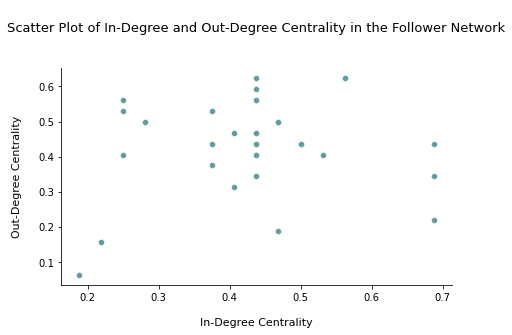

In [30]:
plt.figure(figsize=(7, 4))
sns.scatterplot(data=degree, x="In-Degree", y="Out-Degree", color="cadetblue")
plt.title(label="\nScatter Plot of In-Degree and Out-Degree Centrality in the Follower Network\n\n", fontsize=13)
plt.ylabel("Out-Degree Centrality\n", fontsize=11)
plt.xlabel("\nIn-Degree Centrality", fontsize=11)
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False

print("Correlation Coefficient: ", round(degree["In-Degree"].corr(degree["Out-Degree"]), 3), "\n")


plt.show()

There is no obvious linear relationship visible from the above scatter plot of in and out degree centrality. The correlation coefficient is 0.094 indicating a very weak positive relationship.

__Comparing In Degree Centrality and Follower Count__

We can also compare the number of followers an account has overall to the number of followers within the network, i.e. comparign in-degree and follower count.

In [31]:
# List_members.jsonl is a JSON Lines (JSONL) file, where each line in the file is a separate JSON document. 
# Each JSON document contains the Twitter user profile of a list member.

# list of twitter users
users = []
# read in the JSONL text
fin = open("education/List_members.jsonl","r")
# process each line as a separate JSON document
for line in fin.readlines():
    user = json.loads( line ) # each 'user' is a dictionary
    users.append( user ) # add each user dictionary to the user list
fin.close()

df = pd.DataFrame( users ) # list of user dictionaries -> pandas DF
df["screen_name"] = df["screen_name"].str.lower() # convert screen name to lowercase
df = df.set_index("screen_name") # set screen name as index
df=df[["followers_count", "verified"]] # extrcat just follower count and verified
display(df.head(3))

,followers_count,verified
screen_name,,
officialuom,76911,True
limerickit,8312,False
waterfordit,9687,False


Correlation Coefficient:  0.595 



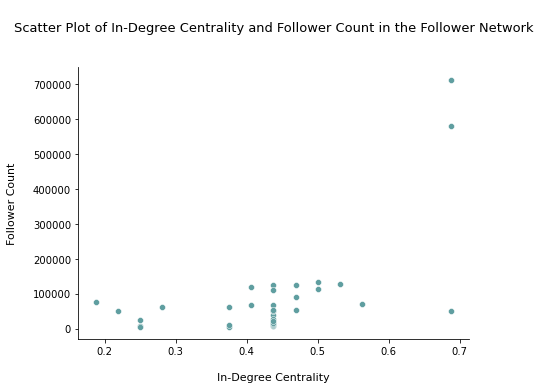

In [32]:
# dataframe containing indegree and follower count for each node
indegreeFollowers=pd.concat([indegree, df["followers_count"]], axis=1).rename(columns={0:"In-Degree"})

plt.figure(figsize=(7, 5))
sns.scatterplot(data=indegreeFollowers, x="In-Degree", y="followers_count", color="cadetblue")
plt.title(label="\nScatter Plot of In-Degree Centrality and Follower Count in the Follower Network\n\n", fontsize=13)
plt.ylabel("Follower Count\n", fontsize=11)
plt.xlabel("\nIn-Degree Centrality", fontsize=11)
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False

print("Correlation Coefficient: ", round(indegreeFollowers["In-Degree"].corr(indegreeFollowers["followers_count"]), 3), "\n")

plt.show()

From the above scatterplot we can see that two accounts have a very high follower count of above 550,000 and these also have the highest in-degree centrality scores. For the other data points however no obvious linear relationship is visible. I expected that possibly the accounts with more followers overall would be followed by more users in the network (i.e. higher in-degree), and the users with less followers overall would be followed by less users in the network.

The correlation coefficient is almost 0.6 indicating a moderate positive relationship. 

We can remove these two datapoints with the very high follower counts and replot the scatter plot to better see the relationship for the other datapoints

Correlation Coefficient:  0.289 



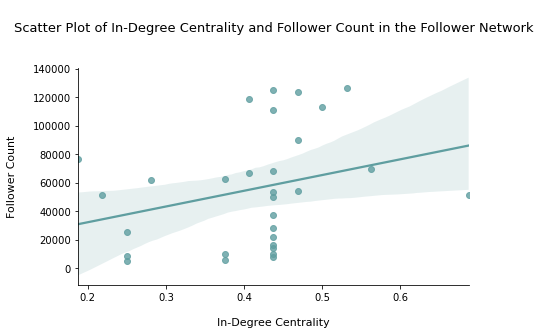

In [33]:
indegreeFollowers = indegreeFollowers.sort_values(by="followers_count", ascending=False).iloc[3:]

plt.figure(figsize=(7, 4))
sns.regplot(data=indegreeFollowers, x="In-Degree", y="followers_count", color="cadetblue")
plt.title(label="\nScatter Plot of In-Degree Centrality and Follower Count in the Follower Network\n\n", fontsize=13)
plt.ylabel("Follower Count\n", fontsize=11)
plt.xlabel("\nIn-Degree Centrality", fontsize=11)
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False

print("Correlation Coefficient: ", round(indegreeFollowers["In-Degree"].corr(indegreeFollowers["followers_count"]), 3), "\n")
plt.show()

The above plot is a regression plot showing the line of regression for Follower Count and In-Degree centrality for all datapoints except the two with very high follower counts. We can see from the slope of the line that there is a weak positive relationship - i.e. higher follower count <=> higher in-degree centrality. The correlation coefficient is almost 0.3, indicating a weak positive linear relationship.

__Comparing In Degree Centrality and Verified__

We can also compare the in-degree to whether the accounts are verified:

In [34]:
indegreeVerified=pd.concat([indegree, df["verified"]], axis=1).rename(columns={0:"In-Degree"})
print(indegreeVerified)

                 In-Degree  verified
cambridge_uni      0.68750      True
aberdeenuni        0.40625      True
edinburghuni       0.53125      True
imperialcollege    0.50000      True
kingscollegelon    0.40625      True
lancasteruni       0.37500      True
livuni             0.43750     False
qubelfast          0.68750      True
sheffielduni       0.43750      True
swanseauni         0.21875     False
unibirmingham      0.46875      True
uniofeastanglia    0.28125      True
uniofnottingham    0.46875      True
uniofoxford        0.68750      True
universityleeds    0.43750      True
uofglasgow         0.50000      True
dcu                0.43750      True
athloneit          0.43750     False
itcarlow           0.43750     False
limerickit         0.25000     False
maynoothuni        0.43750     False
mtu_cork           0.43750     False
mtu_kerry          0.37500     False
nuigalway          0.43750     False
rcsi_irl           0.25000      True
tcddublin          0.56250      True
t

Above is the users sorted by in-degree. Most of the users with the highest in-degrees are verified, with 8 of the top 10 verified. Only 6 of the users with the lowest 15 in-degree scores are verified.

Thus we can see that the users with more followers within the network tend to be verified, while the users with less tend not to be.

__Eigenvector Centrality__

Eigenvector centrality attempts to capture the qualitative aspect of the connections of a vertex. It is a basic extension of degree centrality, which defines centrality of a node as proportional to its neighbors’ importance. When we sum up all connections of a node, not all neighbors are equally important and eigenvector centrality takes this into account. It is a more sophisticated view of centrality where a person with few connections could have a very high eigenvector centrality if those few connections were to very well-connected others. It allows for connections to have a variable value, so that connecting to some vertices has more benefit than connecting to others

For eigenvector centrality, relative scores are assigned to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes. Mathematically, the eigenvector centrality of a node is the sum of the neighbors’ eigenvector centralities divided by λ — the largest eigenvalue of the adjacency matrix of the network. 

High eigenvector centrality identifies nodes that are surrounded by other nodes with high eigenvector centrality. This can be used to locate clusters/groups of interconnected nodes with high prestige.

For directed graphs such as this, using our networkx function nx.eigenvector_centrality() calculates the "left" eigenvector centrality, which corresponds to the in-edges in the graph. We can also calculate the "right" eigenvector centrality for the out-edges using graphName.reverse(), however I will focus on the left eigenvector centrality.

Eigenvector Centrality Summary Statistics:
	Min:  0.046
	Max:  0.299
	Mean:  0.154
	Median:  0.109


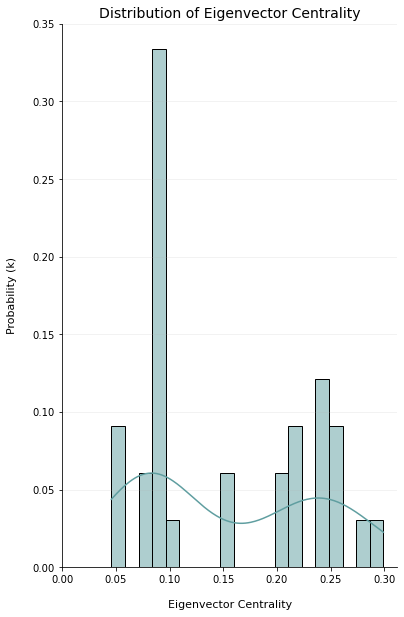

In [35]:
measureStats(nx.eigenvector_centrality(gFollowers), "Eigenvector Centrality", r=3)
densityPlot(nx.eigenvector_centrality(gFollowers), "Eigenvector Centrality", min=0, max=0.35, step=0.05, bins=20)

The distribution of (left) eigenvector centrality is approximately bimodal. There is a peak at 0.08-0.09 and 0.24-0.25.

The range of eigenvector centrality scores is from 0.046 - 0.299 with a mean of 0.154 and median of 0.109. 

15% of nodes have a score between 0.04 - 0.08. There is a peak at 0.08 - 0.09, with about 33% of nodes within this range. From here we can see about 9% between 0.1 and 0.2. Around 27% have a score between 0.2 and 0.25, with 15% having a score above this. Roughly 50% have scores above and below the mean of 0.15. So there are quite a large number of nodes with high eigenvector centrality scores - important nodes who are followed by other important nodes, and there is also a quite a large portion with lower scores - less important nodes who are followed by other less important nodes.

We can plot the network again and let the node size and colour indicate the eigenvector centrality scores:

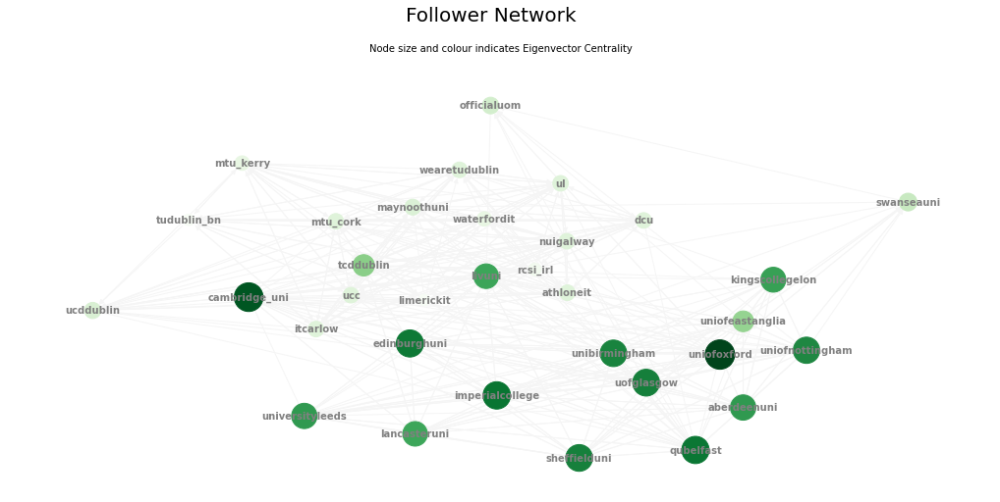

In [36]:
pos = nx.spring_layout(gFollowers, seed=675, k=1.6)
draw(gFollowers, pos, nx.eigenvector_centrality(gFollowers), "Eigenvector Centrality", title="Follower Network", size=3000, font=8, width=18, height=8)

We can immediately see clusters of nodes with low and high eigenvector centrality scores. The smaller colleges and ITs in Ireland, such as  Waterford IT, Limerick IT, MTU Cork, etc, are clustered together and have very low eigenvector centrality scores. These are less known colleges that would likely not be known globally and so may not be followed by many of the UK colleges. It is likely however that a lot of them would follow eachother. Thus, they may be connected to other less important nodes.

The bigger colleges which are very well known internationally, such as Cambridge, Oxford, Edinburgh, etc have higher eigenvector centrality scores. The UK colleges in general seem to have higher eigenvector centrality scores. It is likely that some of the very well known Universities such as Cambridge, Oxford, etc may be following many of the other UK colleges. Being followed by these universities would in turn increase the eigenvector centralities of these nodes. It is less likely for these well known UK universities to be following small colleges in Ireland. Thus, the UK colleges in general have higher eigenvector centrality scores.

__Betweenness Centrality__

This metric captures a different view of the importance of a node. The previous centrality measures do not capture the idea of brokerage. Betweenness centrality identifies strategic linkages, “brokers” or “bridging nodes” in a network. It finds the bottleneck nodes in a network.

Nodes that occur on many shortest paths between other nodes in the network have a high betweenness centrality score.

Betweenness centrality assumes that the nodes which connect most of the other nodes in the shortest possible way are most important.

As mentioned previously, many of the other centrality metrics, such as degree centrality, are local and depend only on the neighbourhood of a node, but we cannot say much about the opportunities for global outreach from these metrics. Betweenness centrality is a global metric. If the betweenness centrality of a node is high, the node is potentially a crucial go-between and has a brokerage capability. The removal of such a node would disrupt communications, lower closeness centralities, and possibly split the network into disconnected components. Thus, it is a very important centrality metric.

Betweenness Centrality Summary Statistics:
	Min:  0.0003
	Max:  0.2872
	Mean:  0.0262
	Median:  0.0092


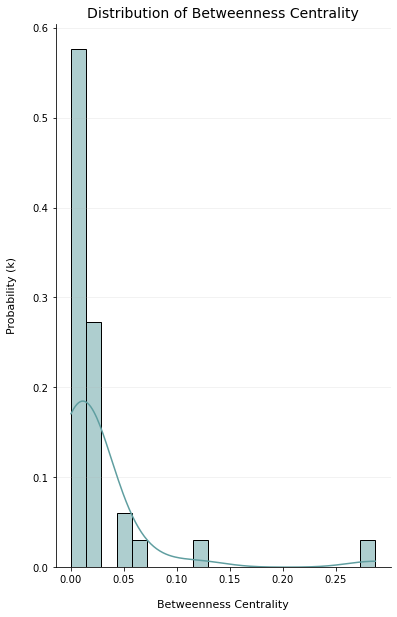

In [37]:
measureStats(nx.betweenness_centrality(gFollowers), "Betweenness Centrality", r=4)
densityPlot(nx.betweenness_centrality(gFollowers), "Betweenness Centrality", min=0, max=0.3, step=0.05, bins=20)

The range of values for betweenness centrality is between 0.0003 and 0.29. The distribution is strongly right skewed. There is a peak at about 0-0.01, with 58% of nodes having a betweenness centrality score within this range. 33% have a score between 0.01 and 0.06, with just 1 node having a score between 0.1 and 0.15, and 1 node with a score of 0.29. The average betweenness centrality score is 0.026 with a median of 0.0092. Overall we can see that the majority of nodes have very small betweenness centrality scores, with a small number of nodes having slightly higher scores and 1 node having a very high score.

We can plot the network again and let the node size and colour indicate the betweenness centrality:

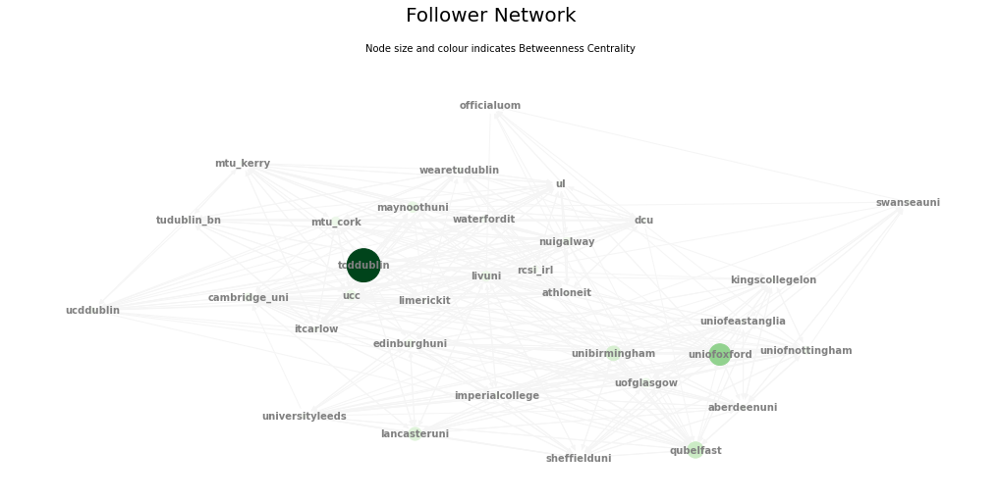

In [38]:
pos = nx.spring_layout(gFollowers, seed=675, k=1.6)
draw(gFollowers, pos, nx.betweenness_centrality(gFollowers), 
     "Betweenness Centrality", title="Follower Network", size=4000, font=8, width=18, height=8)

Trinity College Dublin's account has the highest betweenness centrality score. This node acts as a broker in the network. TCD is a well known college internationally so it is likely that many of the UK universities may follow the TCD account, and may not follow many of the other Irish university/college's accounts. Therefore, by removing the TCD node the graph may be split into more than 1 strongly connected component. We can check this:

__Construct a new graph equivalent to our follower network graph and remove the TCD node:__

In [39]:
H=nx.DiGraph() # construct a new direct graph
H.add_edges_from(gFollowers.edges()) # add edges from follower netowrk
H.remove_node('tcddublin') # remove TCD node

print("Number of Strongly Connected Components")
print("Before removing TCD Account:\t", nx.number_strongly_connected_components(gFollowers))
print("After removing TCD Account:\t", nx.number_strongly_connected_components(H))

Number of Strongly Connected Components
Before removing TCD Account:	 1
After removing TCD Account:	 2


As expected, we can see that by removing the TCD node the graph is now split into 2 strongly connected components. We can visualise this by plotting our graph and colouring the 2 components in different colours:

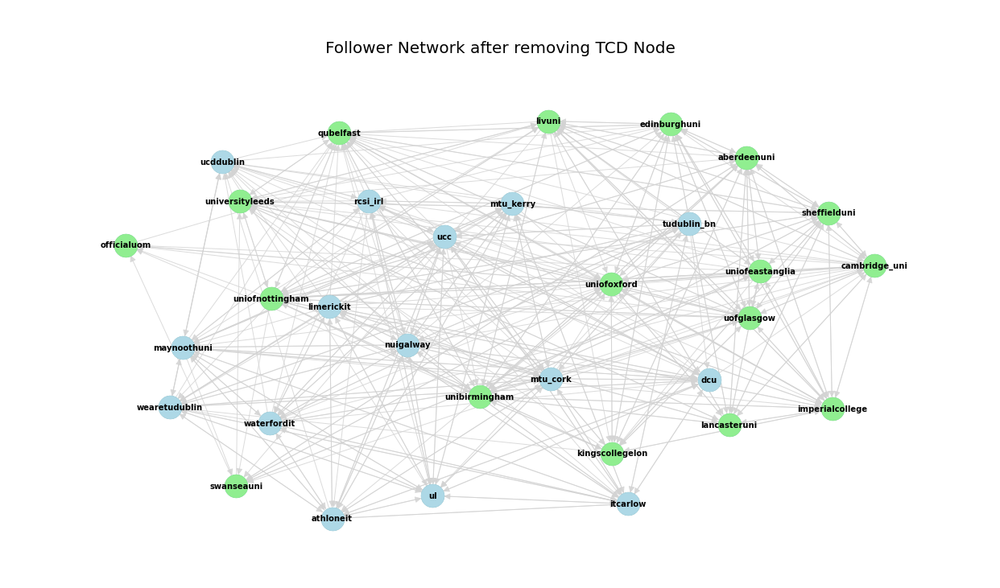

In [40]:
plt.figure(figsize=(22, 12))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(H, k = 2.4)

nx.draw(H, pos,  node_size=800,  node_color="cadetblue", edge_color="lightgray", alpha=0.8, arrowsize=16)


x=["lightgreen", "lightblue"]
i=0
for c in nx.strongly_connected_components(H):
    nx.draw_networkx_nodes(H,pos,nodelist=list(c),node_color=x[i], node_size=800)
    i=i+1

l= {key:val for key, val in nodeLabels.items() if key != 'tcddublin'}
nx.draw_networkx_labels(H, pos, l, font_size=10, font_color='black', font_weight="bold")


label="\n\nFollower Network after removing TCD Node"
plt.title(label = label, fontsize = 20)
plt.show()

By removing the TCD nodes, our graph has been split into two strongly connected components, and we can see from the above graph that these components contain all of the Irish colleges in one and all of the UK colleges in the other. So, TCD's account acts as a very important broker between the UK and Irish college accounts.

__Closeness Centrality__

The closeness centrality of a node is defined as the reciprocal mean distance from the node to all other reachable nodes in the network. It shows how close the node is to the rest of the graph. This is again a global metric as it does not depend only on the nodes neighbourhood.

It is calculated as 1 / the average of the shortest path length from the node to every other node in the network.

Closeness centrality indicates nodes as more central if they are closer to most of the nodes in the graph. It can be regarded as a measure of how fast it will take to spread information to all other nodes. If a node has high closeness centrality, it is in a position to spread information quickly. These nodes can be important influencers of the network. It highlights nodes that may reach any other nodes within a few hops and nodes that may be very distant in the graph.

Closeness Centrality Summary Statistics:
	Min:  0.368
	Max:  0.762
	Mean:  0.57
	Median:  0.516


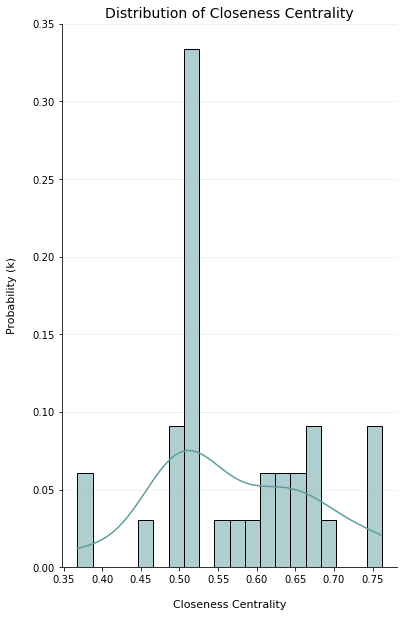

In [41]:
measureStats(nx.closeness_centrality(gFollowers), "Closeness Centrality", r=3)
densityPlot(nx.closeness_centrality(gFollowers), "Closeness Centrality", min=0.35, max=0.8, step=0.05, bins=20)

The range of closeness centrality scores is 0.368-0.762. 18% of nodes have a score below about 0.51. The highest peak is between about 0.51-0.525, with 33% of nodes within this range. 39% of nodes have a closeness centrality score between -.54 - 0.71. 9% have a score between 0.76-0.78. The average closeness centrality score is 0.57 with a median of 0.52.

Overall, there a very few nodes who are a large mean distance from all other nodes in the network. The majority of nodes have a high closeness centrality score indicating a short distance to all other nodes.

We can plot the network again, letting the node size and colour indicate the closeness centrality:

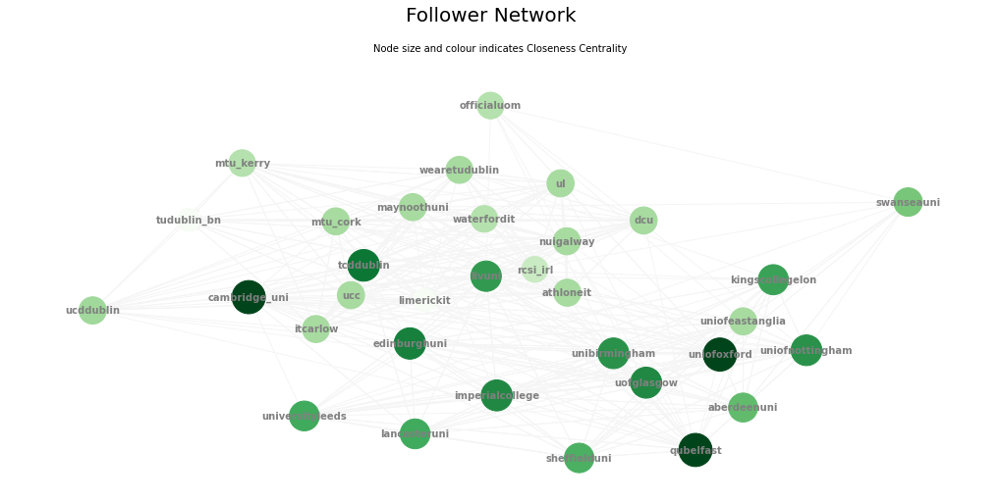

In [42]:
pos = nx.spring_layout(gFollowers, seed=675, k=1.6)
draw(gFollowers, pos, nx.closeness_centrality(gFollowers), 
     "Closeness Centrality", title="Follower Network", size=1500, font=8, width=18, height=8)

We can see that Cambridge, Oxford and Queen's University Belfast have the the highest closeness centrality scores indicating the shortest mean distances to all other nodes. Closeness centrality can be regarded as a measure of how fast it will take to spread information to all other nodes. Tweets from these accounts are likely to reach all other accounts with only a few hops (through direct followers in the network or followers retweeting).

We have characterised the structure and connectivity of the follower network, as well as identifying important nodes using various centrality metrics. Next we can construct a reply network based on the replies from the nodes in the follower network to eachother and other twitter users:

## <font color='darkcyan'>Task 2: Reply Network</font>

The next network that I will construct and categorise is a reply network. In this network, nodes will be users from the node list in task 1 as well as users from the wider Twitter platform. A directed edge from node A to node B indicates that node A replied to a tweet of B's. All edges will be from nodes in the list from task 1. The network is a weighted directed network, where the weight on the edge between node A and node B indicates the number of B's tweets that A has replied to.

I will begin by reading the file tweets.jsonl which contains information about tweets, some of which are replies.

In [43]:
fin = open( "education/tweets.jsonl", "r" ) # open the file
tweets = [] # list of tweets

# process the file line-by-line
for line in fin.readlines():
    line = line.strip()
    # each line contains a JSON document, representing a single tweet
    tweet = json.loads(line)
    tweets.append(tweet) # add to tweet list
fin.close()
print("Read %d tweets" % len(tweets))

Read 16500 tweets


In [44]:
# set index to "id"
dfTweets = pd.DataFrame(tweets).set_index("id")

display(dfTweets.head(3))

,created_at,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status_permalink,quoted_status
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1303649778409111553,Wed Sep 09 11:01:42 +0000 2020,1303649778409111553,This week marks 50 years since the first stude...,False,"[0, 277]","{'hashtags': [{'text': 'WIT50', 'indices': [27...","{'media': [{'id': 1303643268115320832, 'id_str...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,NaN,None,None,"{'id': 245831039, 'id_str': '245831039', 'name...",None,None,None,None,False,20,76,False,False,False,en,NaN,NaN,NaN,NaN,NaN
1323322790792040459,Mon Nov 02 17:55:14 +0000 2020,1323322790792040459,RT @AdaptCentre: Huge congratulations Aidan @I...,False,"[0, 123]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,NaN,None,None,"{'id': 95665759, 'id_str': '95665759', 'name':...",None,None,None,None,True,1,0,False,False,False,en,{'created_at': 'Mon Nov 02 17:06:47 +0000 2020...,1.323274e+18,1323274037758468096,"{'url': 'https://t.co/V7zfoWkdU6', 'expanded':...",NaN
1351839434006814720,Wed Jan 20 10:30:11 +0000 2021,1351839434006814720,Our @HampshireHub has surveyed the mental heal...,False,"[0, 261]","{'hashtags': [{'text': 'COVID19', 'indices': [...",NaN,"<a href=""https://www.hootsuite.com"" rel=""nofol...",NaN,None,NaN,None,None,"{'id': 15353955, 'id_str': '15353955', 'name':...",None,None,None,None,False,2,6,False,False,False,en,NaN,NaN,NaN,NaN,NaN


Drop columns which I am not interested in using in my analysis:

In [45]:
dfTweets = dfTweets.drop( ['possibly_sensitive',
        'display_text_range',
        'truncated',
        'contributors',
        'coordinates', 
        'extended_entities',
        'id_str',
        'in_reply_to_user_id', 
        'in_reply_to_user_id_str', 
        'is_quote_status', 
        'quoted_status_id', 
        'quoted_status_id_str',
        'quoted_status_permalink', 
        'quoted_status',
        'source'], axis=1 )

In [46]:
display(dfTweets.head(3))

,created_at,full_text,entities,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_screen_name,user,geo,place,retweet_count,favorite_count,favorited,retweeted,lang,retweeted_status
id,,,,,,,,,,,,,,,
1303649778409111553,Wed Sep 09 11:01:42 +0000 2020,This week marks 50 years since the first stude...,"{'hashtags': [{'text': 'WIT50', 'indices': [27...",NaN,None,None,"{'id': 245831039, 'id_str': '245831039', 'name...",None,None,20,76,False,False,en,NaN
1323322790792040459,Mon Nov 02 17:55:14 +0000 2020,RT @AdaptCentre: Huge congratulations Aidan @I...,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,None,None,"{'id': 95665759, 'id_str': '95665759', 'name':...",None,None,1,0,False,False,en,{'created_at': 'Mon Nov 02 17:06:47 +0000 2020...
1351839434006814720,Wed Jan 20 10:30:11 +0000 2021,Our @HampshireHub has surveyed the mental heal...,"{'hashtags': [{'text': 'COVID19', 'indices': [...",NaN,None,None,"{'id': 15353955, 'id_str': '15353955', 'name':...",None,None,2,6,False,False,en,NaN


Each entry in the user column is a dictionary with information about the user, extract just the screen name:

In [47]:
for i, d in dfTweets["user"].iteritems():
    dfTweets.loc[i, "user"] = dfTweets.loc[i, "user"]["screen_name"] # set user = screen name for each tweet
    
dfTweets=dfTweets.rename(columns={"user" : "screen_name"}) # rename user -> screen name

print(dfTweets.screen_name.head(3))

id
1303649778409111553        waterfordit
1323322790792040459      WeAreTUDublin
1351839434006814720    imperialcollege
Name: screen_name, dtype: object


Convert screen names for replier and the user they are replying to to lower case:

In [48]:
dfTweets["screen_name"] = dfTweets["screen_name"].str.lower()
dfTweets["in_reply_to_screen_name"] = dfTweets["in_reply_to_screen_name"].str.lower()

__Construct a directed graph from the nodes in the follower network:__

In [49]:
gReply = nx.DiGraph()
gReply.add_nodes_from(gFollowers)

For each tweet which is a reply (in_reply_to_screen_name != None), add an edge corresponding to the reply from the user replying to the tweet to the user who tweeted the original tweet.

In [50]:
# iterate through tweets
for row in dfTweets.iterrows():
    
    # if the tweet is a reply
    if row[1]["in_reply_to_screen_name"] != None:
        
        user=row[1]["screen_name"]
        replyTo=row[1]["in_reply_to_screen_name"]
        
        # if the edge already exists, increment the weight
        if gReply.has_edge(user, replyTo):
            gReply[user][replyTo]["weight"] += 1
            
        # if the edge does not already exist, add the edge with weight of 1
        else:
            gReply.add_edge(user, replyTo, weight=1)

__Number of nodes & edges__

In [51]:
print("Number of nodes:\t", gReply.number_of_nodes(), "\nNumber of edges:\t", gReply.number_of_edges())

Number of nodes:	 1645 
Number of edges:	 1656


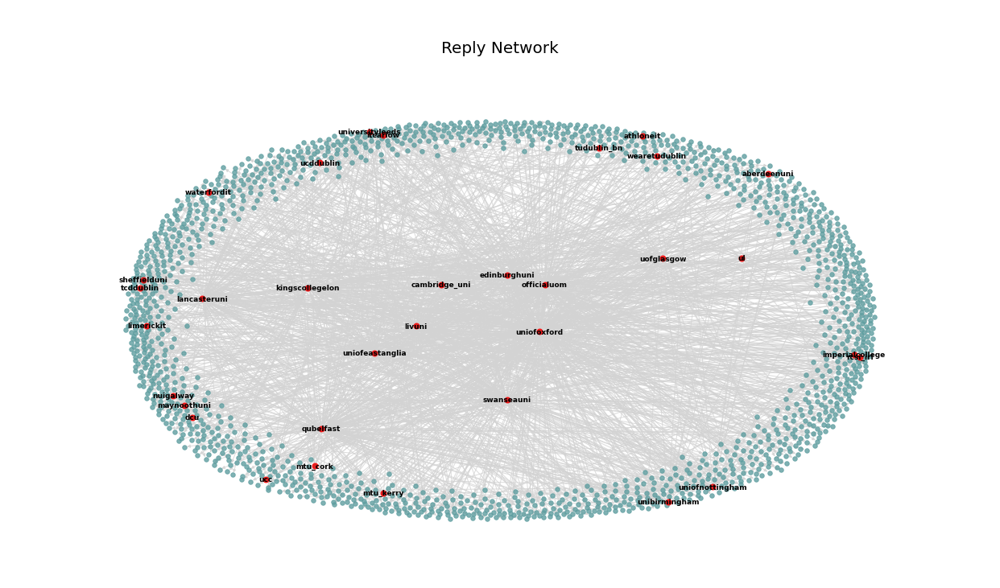

In [52]:
plt.figure(figsize=(22, 12))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(gReply, k = 1.5, scale=2)

nx.draw(gReply, pos,  node_size=30,  node_color="cadetblue", edge_color="lightgray", alpha=0.8, arrowsize=8)
nx.draw_networkx_labels(gReply, pos, nodeLabels, font_size=9, font_color='black', font_weight="bold")
nx.draw_networkx_nodes(gReply, pos, nodelist=list(nodeLabels.keys()), node_size=50, node_color='red', alpha=0.8)


label="\n\nReply Network"
plt.title(label = label, fontsize = 20)
plt.show()

__Isolated Nodes__

I constructed the graph from the nodes of the follower graph first, so that each of the 33 nodes in the original network would be in the reply network. Any of these nodes which have not replied to any other users, or who have not been replied to by one of the other 32 nodes will be isolated. We can check if there are any isolated nodes:

In [53]:
print("Isolated Nodes: ",list(nx.isolates(gReply)))

Isolated Nodes:  ['tudublin_bn']


The account for TUD Blanchardstown has not replied to any accounts or been replied to by any of the other 32 accounts in the original node list, and so is isolated. This might indicate that the TUD Blanchardstown account is not very active. All of the 32 other users have replied to at least 1 account or been replied to be one of the other 31 users, and the remaining 1612 nodes have at least 1 reply from one of these 32 users.

__Connectivity__

A directed network such as this is said to be strongly connected if every node is reachable from every other node.
We know that this will not be the case as all replies are from one of the 33 nodes in our original node list, so there will be no edge going from any other node, and so every node is not reachable from every other node. We can check this:

In [54]:
print("Strongly Connected: ", nx.is_strongly_connected(gReply))

Strongly Connected:  False


In [55]:
print("Number of strongly connected components: ", nx.number_strongly_connected_components(gReply))

Number of strongly connected components:  1645


The number of strongly connected components is equal to the number of nodes.

We can also check if the underlying undirected graph is connected by checking if our graph is weakly connected, i.e. every node is reachable from every other node in the underlying undirected graph. 

In [56]:
print("Weakly Connected: ", nx.is_weakly_connected(gReply))

Weakly Connected:  False


As we can see, our graph is not weakly connected either. This is unsurprising due to the presence of the isolated node. We can calculate the number of weakly connected components:

In [57]:
print("Number of weakly connected components: ", nx.number_weakly_connected_components(gReply))

Number of weakly connected components:  22


__Network Density__

Network density refers to the portion of potential edges between nodes in a network that exist as actual edges.

Density is calculated numerically as the ratio of existing edges over the total number of potential edges between all pairs of nodes.

In [58]:
print("Density %.5f" % nx.density(gReply))

Density 0.00061


The density of the network is very low at 0.00061, which means that of all possible edges in the network, only 0.061% of these are actual edges. This is unurprising, as the network only contains replies from the 33 nodes in the original node list, but contains their replies to all other twitter users that they have replied to. There are 1645 nodes but edges going from only 33 of these. So of a possible (1645)(1643)=2,702,735 edges there are only 1656.

__Diameter__

A network’s diameter is the maximum distance between all pairs of its nodes - i.e. the longest shortest path in the entire network. The diameter will be infinity if the network is not strongly connected, which is the case here. We can check this:

In [59]:
try:
    print("Diameter: ", nx.diameter(gReply))

except NetworkXError:
    print("Diameter = infinity")

Diameter = infinity


Because every node is not reachable from every other node, the longest shortest path, i.e. the density, is infinity.

__Reciprocity__

Reciprocity is a measure of the fraction of reciprocated edges in a directed network - i.e. the ratio of the number of edges pointing in both directions to the total number of edges in the network.

In [60]:
print("Reciprocity %.8f" % nx.reciprocity(gReply) )

Reciprocity 0.00000000


We can see that the reciprocity is 0. We know that the only edges that can be reciprocated are edges between the 33 nodes in the original node list, as all replies in the network are from one of these nodes. We can check this:

In [61]:
def reciprocity(g):
    reciprocated=0
    # check all unique pairs of nodes in the network 
    for pair in itertools.combinations(g.nodes(), r=2):
        # check if an edge exists in both directions between the two
        if g.has_edge( pair[0], pair[1] ) and g.has_edge( pair[1], pair[0] ):
            reciprocated += 1

    print("Number of reciprocated edges: ", reciprocated)
    
reciprocity(gReply)

Number of reciprocated edges:  0


So this confirms that none of the edges from one of the 33 original nodes to another are reciprocated. We can check how many edges in general there are between these 33 nodes:

In [62]:
replies=[]

# get all unique pairs of nodes in the original node list
for pair in itertools.combinations(list(nodeLabels.keys()), r=2):
    
    # check for edge between the pair
    if gReply.has_edge(pair[0], pair[1]):
        replies.append(pair)
        
    if gReply.has_edge(pair[1], pair[0]):
        replies.append((pair[1], pair[0]))
        
print("Number of edges between nodes in the original node list: ", len(replies), "\n")

for reply in replies:
    print(reply[0], "-->", reply[1])

Number of edges between nodes in the original node list:  4 

athloneit --> cambridge_uni
qubelfast --> nuigalway
qubelfast --> ucc
uofglasgow --> uniofoxford


There are 4 edges in total between the 33 nodes in the original node list. Athlone IT has replied to Cambridge University, Queen's University Belfast has replied to NUIGalway and University College Cork, and the University of Glasgow has replied to the University of Oxford.

__Clustering Coefficient__

Clustering coefficient indicates the level of concentration of edges in the neighbourhood of a node. It is the fraction of pairs of its neighbours (where a neighbour of a node is a node that the node has an edge to) that have edges between one another - i.e. how many closed triads around this node. For directed graphs such as this, the direction of the edges are ignored.

(Closed triad = if a node A is connected to nodes B and C, and B and C are also connected (B->C or C->B or both), then A, B and C form a closed triad.)

We can calculate the average clustering coefficient of all of the nodes in the network:

In [63]:
print("Reply Network Average Clustering Coefficient: ", nx.average_clustering(gReply))

Reply Network Average Clustering Coefficient:  0.0


The clustering coefficient is 0. This is again unsurprising. Edges in the network can only go from one of the 33 nodes in the original node list. Thus for a close triad where node A is connected to nodes B and C, and B and C are also connected, A, B and C would all have to be from the original node list. We saw above that the only node with two or more edges to nodes in the original network is Queen's University Belfast (A) which has an edge to NUI Galway (B) and UCC (C). We know that there is no edge from NUI Galway to UCC or vice versa, as we saw all edges between nodes in the original node list above and this was not in the list. Thus, there are no closed triads, i.e. clustering coefficient = 0.

__Distribution of Edge Weights__

In this reply network the weight on an edge between node A and B represents the number of replies from node A to node B's tweets. We can look at the distribution of these edge weights.

First construct a pandas series from the edge weights:

In [64]:
def weightSeriesFunc(g):
    # edge weights -> dictionary with key=node pair, value=weight
    weightDict = dict( (x[:-1], x[-1]["weight"]) for x in g.edges(data=True))

    # dictionary -> series
    weightSeries = pd.Series(weightDict)

    return weightSeries
    
weightSeries=weightSeriesFunc(gReply)
display(weightSeries.head(10))

cambridge_uni  _alexiabis         4
               naseerajumawa      1
               kwemoiisaac        1
               kevin_lvictor3     1
               cambridge_uni      2
               alexisrosinsky     3
               shorthand          1
               iamcozee           1
               zarifkh98922996    1
               saxonstu           1
dtype: int64

In [65]:
display(weightSeries.sort_values(ascending=False).head(10))

aberdeenuni      aberdeenuni        165
universityleeds  universityleeds    143
imperialcollege  imperialcollege    100
lancasteruni     lancasteruni        95
unibirmingham    unibirmingham       86
officialuom      officialuom         79
sheffielduni     sheffielduni        77
ucddublin        ucddublin           66
uniofnottingham  uniofnottingham     61
swanseauni       swanseauni          40
dtype: int64

Above is the weight series sorted in descending order. We can see that many of the highest edge weights are from edges from a node to itself, i.e. college accounts replying to their own tweets/ writing threads contaning many tweets, each of which is a reply to the previous. 

We can plot a histogram to see the distribution of the edge weights.

Edge Weight Summary Statistics:
	Min:  1
	Max:  165
	Mean:  2.0
	Median:  1.0


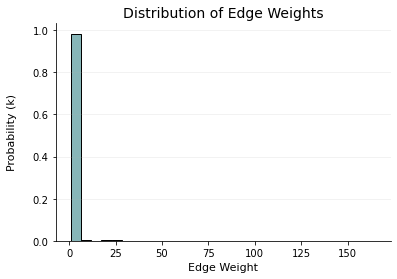

In [66]:
def plotWeightHist(weightSeries, kde=False, height=4, width=6, stat= 'probability', label="Probability (k)\n"):
    plt.figure(figsize=(width, height))

    sns.histplot(weightSeries, kde=kde, bins=30, color = 'cadetblue', stat=stat)    

    plt.title("Distribution of Edge Weights", fontsize=14)
    plt.xlabel("Edge Weight", fontsize=11)
    plt.ylabel(label, fontsize=11)

    # plt.xticks(np.arange(max, min, step))
    plt.grid(axis='y', alpha=0.2)
    mpl.rcParams['axes.spines.right'] = False
    mpl.rcParams['axes.spines.top'] = False

    measureStats(measure=weightSeries, measure_name="Edge Weight")

    plt.show()
plotWeightHist(weightSeries)

The range of edge weights is from 1 to 165, with a mean of 2 and median of 1. We can see that a very high percentage, about 98% have an edge weight below about 10. A very small percentage of edges have a weight between 10 and 165. It is probable that most of these edges are from nodes to themselves, as mentioned above. We can remove any weights corresponding to edges from a node to itself and plot the histogram again.

In [67]:
# get edge weights for weights from node A -> node B where A!=B
w = dict( (x[:-1], x[-1]["weight"]) for x in gReply.edges(data=True)if x[0] != x[1])

weightSeries2 = pd.Series(w)
print("Num edges before: ", weightSeries.shape[0])
print("Num edges after: ", weightSeries2.shape[0], "\n")

print("New series containing edge weights:\n")
print(weightSeries2.head(10))

Num edges before:  1656
Num edges after:  1626 

New series containing edge weights:

cambridge_uni  _alexiabis         4
               naseerajumawa      1
               kwemoiisaac        1
               kevin_lvictor3     1
               alexisrosinsky     3
               shorthand          1
               iamcozee           1
               zarifkh98922996    1
               saxonstu           1
               shweta76106959     1
dtype: int64


30 edges from a node to itself were removed, so 30 of the 33 nodes in the node list from task 1 had replied to their own tweets.

We can plot the histogram again excluding these edge weights.

Edge Weight Summary Statistics:
	Min:  1
	Max:  8
	Mean:  1.0
	Median:  1.0
None


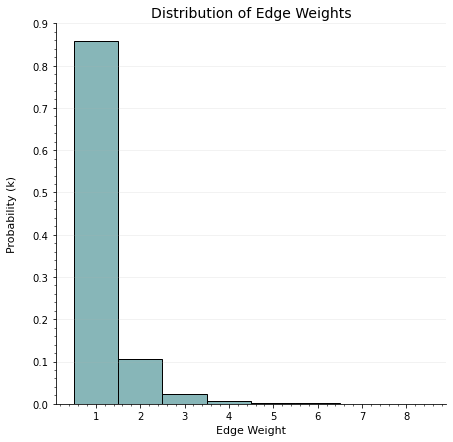

In [68]:
plt.figure(figsize=(7, 7))

# caculate bins
# because the values for weight are discrete I want the bins exactly between each whole number
data = np.array(weightSeries2)
d = np.diff(np.unique(data)).min()
left_of_first_bin = data.min() - float(d)/2
right_of_last_bin = data.max() + float(d)/2

sns.histplot(weightSeries2, kde=False, 
             bins=np.arange(left_of_first_bin, right_of_last_bin + d, d), 
             color = 'cadetblue', stat= 'probability')    
    
plt.title("Distribution of Edge Weights", fontsize=14)
plt.xlabel("Edge Weight", fontsize=11)
plt.ylabel("Probability (k)\n", fontsize=11)
plt.grid(axis='y', alpha=0.2)
plt.yticks(np.arange(0, 0.91, 0.1))
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False
plt.minorticks_on()

print(measureStats(measure=weightSeries2, measure_name="Edge Weight"))

plt.show()

Now the distribution is much easier to see. The range of edge weights is from 1 to 8. The mean is 1, so on average for any account in the dataset and an account it has replied to, it has replied once on average. 86% of edges have a weight of 1. 10% have a weight of 2, 2% a weight of 4, and below 1% a weight of 4, 5, 6 and 8.

We can check which edges have the highest weights:

In [69]:
i=1
w=0
first=True

for nodes, weight in weightSeries2.sort_values(ascending=False).head(10).iteritems():
    if(not first and w!=weight):i+=1
    print(i, nodes[0], "->", nodes[1]) 
    print("\tWeight:", weight)
    
    w=weight
    first=False

1 kingscollegelon -> girlvicar22
	Weight: 8
2 livuni -> halthagafi
	Weight: 6
2 livuni -> metusalafunete
	Weight: 6
2 swanseauni -> mckee_felicity
	Weight: 6
2 kingscollegelon -> leiaamegan
	Weight: 6
2 swanseauni -> lesleytischler
	Weight: 6
3 edinburghuni -> okeyrarr
	Weight: 5
3 edinburghuni -> turtlesandals
	Weight: 5
3 kingscollegelon -> ninastibbe
	Weight: 5
4 swanseauni -> julsroberts71
	Weight: 4


The account for King's College London has the highest edge weight, with 8 replies to the account Girlvicar22. King's College London also has the 2nd, 3rd and 10th highest edge weights, with weights of 6, 5 and 4. Swansea University also has the 2nd highest with 6, and 4th with 4. The University of Liverpool has 2 edges with weight 6, and the University of Edinburgh has an edge of weight 5 and weight 4.

We can construct an __ego network for King's College London__, and plot the graph with edge width and colour indicating edge weight:

In [70]:
# construct ego network
ego_kingscollegelon = nx.ego_graph(gReply, "kingscollegelon")

In [71]:
# function to draw the ego network
def drawEgo(G, k=1, scale=1, seed=675, labels=[], font=9, width=18, height=8, labelAll=False, title="", 
            edgeWeight=False, weightlabels=[], weightFont=6, nodesize=150, edgeLabels=True, edgeWidth=1):
    
    pos = nx.spring_layout(G, seed=seed, k=1, scale=scale)
    
    plt.figure(3, figsize=(width,height)) 

    # edge width and colour => weight
    if edgeWeight:
    
                # get weights so that colour of edge can indicate weight
        edges,weights = zip(*nx.get_edge_attributes(G,'weight').items())

                # darken Blues colormap so lines are more visible for edges with lower weighting
        cmap = mpl.cm.Blues(np.linspace(0,1,20))
        cmap = mpl.colors.ListedColormap(cmap[2:,:-1])
        
        # some ego networks have a few edges with a very high edge weight so the edges are very thick
        # argument edgeWidth, defualt=1, can be passed and each edge is divided by this amount to 
        # reduce the width of the edges
        width=([w/edgeWidth for w in weights])

        
        nx.draw_networkx(G,pos, node_size=nodesize, node_color="silver", 
                         font_size=7, 
                         edgelist=edges, # add edges from edge list above
                         edge_color=weights, # edge colour => weight
                         width=width, # edge width => weight
                         with_labels=labelAll, # labelAll is a boolean argumeny, true => label all nodes
                         edge_cmap=cmap # edge color map
                        )
        # edgeLabels = true => add edge weight labels
        if edgeLabels:
            nx.draw_networkx_edge_labels(G, pos,edge_labels=weightLabels, font_size=weightFont)
    
    # else, plot without edge width => weight
    else:
        nx.draw_networkx(G,
                         pos,
                         edge_color="lightgray", 
                         node_size=nodesize, 
                         with_labels=labelAll, 
                         node_color="lightseagreen")

    # only label certain nodes, list of nodes to be labelled passed as argument
    if not labelAll and len(labels)>0:
        labels=dict(zip(labels,labels))
        nx.draw_networkx_labels(G,pos,labels,font_size=font,font_color='darkslategrey', font_weight="bold")
        
    plt.axis('off')
            
    # add title
    plt.title(label = title, fontsize = 14)

    plt.show()

In [72]:
# get the highest edge weights of kingscollegelon
w=weightSeries2["kingscollegelon"].sort_values(ascending=False)

# get the indexes for the node labels
labels = list(w.head(10).index)
labels.append("kingscollegelon")

# get the weight values for the edge labels
weightLabels={} # dictionaty with (kingscollegelon, node) : edgeWeight
for node in w.index:
    weightLabels[("kingscollegelon", node)]=w[node]
    
# print("Node Labels: ", labels)
# print("\nEdge Labels: ", weightLabels)

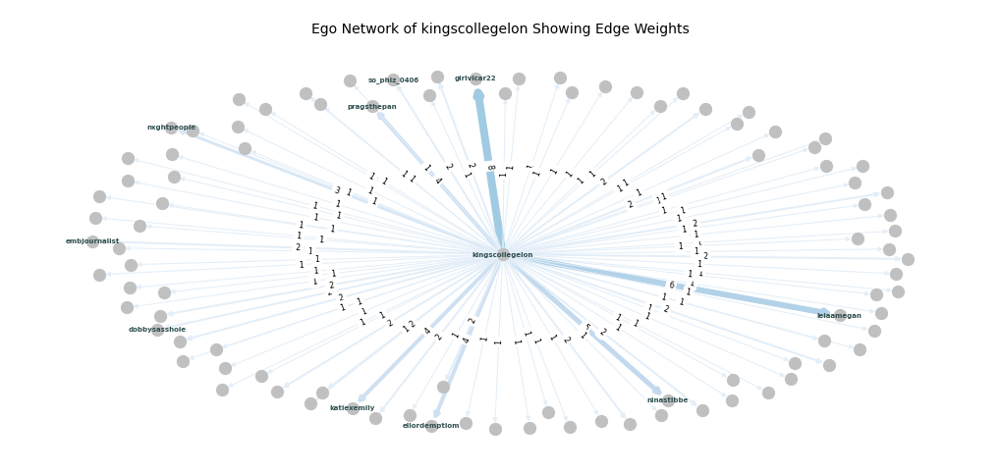

In [73]:
drawEgo(ego_kingscollegelon, k=1, labels=labels, font=7, width=18, height=8, 
        labelAll=False, title="\nEgo Network of kingscollegelon Showing Edge Weights", 
        edgeWeight=True, weightFont=8)

King's College London had some of the highest edge weights. We can see that its highest edge weight is 8, followed by 6 and 5. The nodes which it has the highest edge weights with are labelled. It has a large number of edges with small edge weights of 1 and 2.

#### Degree

As with the directed follower network, here we can distinguish between:

    In-degree: count of number of incoming edges for each node.
    Out-degree: count of number of outgoing edges for each node.

In the case of this twitter reply network, the in-degree of a node is the number of other users in the network that the user has replied to. The out-degree is the number of users in the network that have replied to the user.

Intuitively, a node with a lot of edges going from it (out-degree) is important and influential as it is interacting with a lot of different users by replying to their tweets. A node with a high in-degree would also be important as it has a lot of users replying to its tweets.

We can begin by looking at the distribution of in-degree. I chose in-degree instead of the normalised in-degree centrality as the number of distinct in-degrees is very small (0, 1, 2).

In-Degree Summary Statistics:
	Min:  0
	Max:  2
	Mean:  1.007
	Median:  1.0


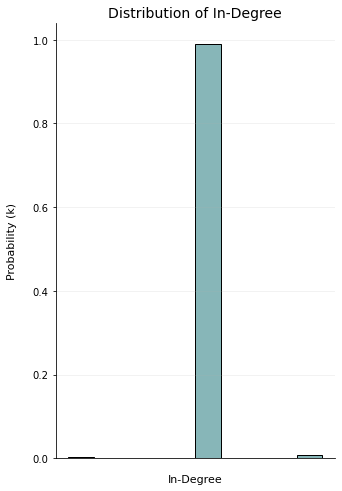

In [74]:
measureStats(dict(gReply.in_degree()), "In-Degree", r=3)

densityPlot(dict(gReply.in_degree()), "In-Degree", width=5, height=8, bins=10, kde=False, adjust=True, min=3, max=0, step=1)

In-degree represents the number of unique users which have replied to a users tweets. The range of in-degree value is from 0 to 2. i.e. each node has a maximum of 2 unique users which have replied to its tweets (recall the dataset only contains replies from the 33 nodes in the original node list form task 1). We can see that a very small percent (<<1%) of nodes have an in-degree of 0, and a very small percent (less than 1%) have an in-degree of 2. Approx 99% have an in-degree of 1. The mean in-degree is 1.007.

We can check the exact number of nodes with in-degree 0 and 2, as it is difficult to see from the histogram:

In [75]:
inDeg=pd.Series(dict(gReply.in_degree()))
print("In-degree Value Counts")
print(inDeg.value_counts().sort_index(ascending=True))

In-degree Value Counts
0       3
1    1628
2      14
dtype: int64


There are 14 nodes with in-degree of 2, and 3 nodes with indegree of 0. The remaining 1628 nodes have in-degree of 1.

As mentioned previously, some nodes in the original node list have edges going to themselves. I don't feel that edge from a node to itself should add to the values for the cenrality of a node, as a user replying to its own tweets doesn't say a lot about the importance and centrality of a node. Thus I will remove these edges:

In [76]:
print("Num edges before: ", gReply.number_of_edges())

e=dict(gReply.edges) # copy edges to dictionary

# remove edges from a node to itself
for edge in e: 
    if edge[0] == edge[1]: 
        gReply.remove_edge(edge[0], edge[1])


print("Num edges after: ", gReply.number_of_edges())

Num edges before:  1656
Num edges after:  1626


30 edges were removed, as 30 of the 33 original nodes had edges to themselves, i.e. replied to their own tweets.

In [77]:
print("In-Degree of nodes from original node list:\n")
l=[]
for node in nodeLabels:
    l.append((node, dict(gReply.in_degree())[node]))
for x in l:print(x)

In-Degree of nodes from original node list:

('cambridge_uni', 1)
('aberdeenuni', 0)
('edinburghuni', 0)
('imperialcollege', 0)
('kingscollegelon', 0)
('lancasteruni', 0)
('livuni', 0)
('qubelfast', 0)
('sheffielduni', 0)
('swanseauni', 0)
('unibirmingham', 0)
('uniofeastanglia', 0)
('uniofnottingham', 0)
('uniofoxford', 1)
('universityleeds', 0)
('uofglasgow', 0)
('dcu', 0)
('athloneit', 0)
('itcarlow', 0)
('limerickit', 0)
('maynoothuni', 0)
('mtu_cork', 0)
('mtu_kerry', 0)
('nuigalway', 1)
('rcsi_irl', 0)
('tcddublin', 0)
('tudublin_bn', 0)
('ucc', 1)
('ucddublin', 0)
('ul', 0)
('waterfordit', 0)
('wearetudublin', 0)
('officialuom', 0)


Now all edges in the orignal node list have a degree of 0, except Cambridge, NUIG, UCC and Oxford which have a degree of 1 as they have edges coming from nodes within this node list, as discussed previously.

In-Degree Summary Statistics:
	Min:  0
	Max:  2
	Mean:  0.988
	Median:  1.0


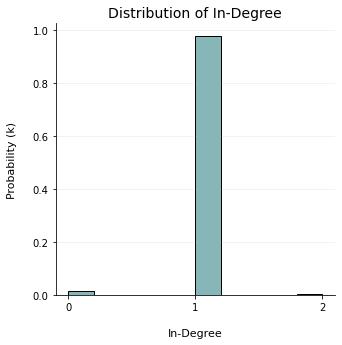

In [78]:
measureStats(dict(gReply.in_degree()), "In-Degree", r=3)
densityPlot(dict(gReply.in_degree()), 
            "In-Degree", height=5, width=5, bins=10, kde=False, adjust=True, min=0, max=3, step=1)

Now we can see that slightly more nodes have a degree of 0, but overall the distribution is very similar to before (when edges from nodes to themselves were included), with about 98% having a degree of 1, and less than 1% with a degree of 2. The mean is slightly lower than before, at 0.988.

__Out-Degree__

Next we can look at the distribution of out degree centrality (normalised out-degree). The out-degree of a node is the number of unique users tweet's that the node has replied to.

Out-Degree Summary Statistics:
	Min:  0.0
	Max:  0.165
	Mean:  0.001
	Median:  0.0


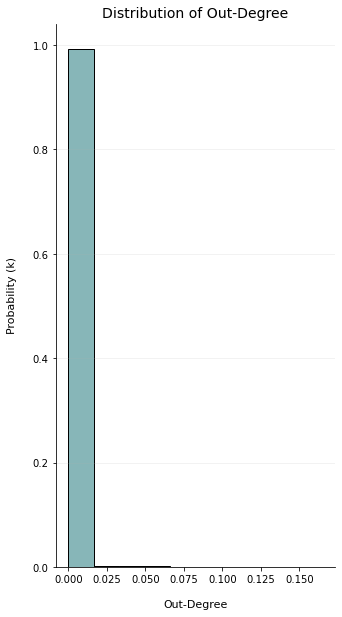

In [79]:
measureStats(nx.out_degree_centrality(gReply), "Out-Degree", r=3)
densityPlot(nx.out_degree_centrality(gReply), 
            "Out-Degree", height=10, width=5, bins=10, kde=False, adjust=False)

Because the data only contains replies from the 33 nodes in the original node list, the other 1612 nodes will automatically have an out-degree of 0. This makes the distribution for the out-degree of the 33 nodes difficult to see. 

We can take the values for just these 33 nodes and plot the out-degree centrality again:

Out-Degree:
Min: 0.00, Max: 0.16, Mean: 0.03


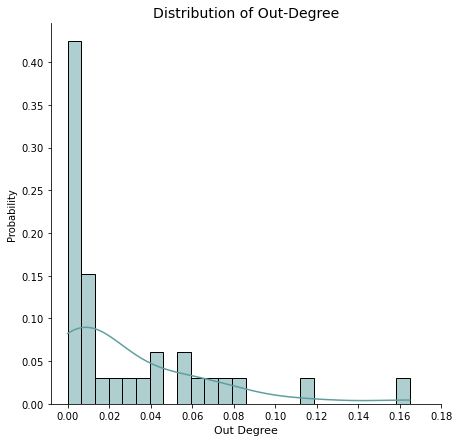

In [80]:
outdegreeDict={}

for key in nodeLabels: # for each of the 33 nodes
    outdegreeDict[key]=nx.out_degree_centrality(gReply)[key] # add (node:degree) to dictionary 
    
outdegree=pd.Series(outdegreeDict) # dict -> series

# plot histogram
plt.figure(figsize=(7, 7))

sns.histplot(outdegree, kde=True, bins=25, color = 'cadetblue', stat= 'probability')

plt.title("Distribution of Out-Degree", fontsize=14)
plt.xlabel("Out Degree", fontsize=11)
plt.xticks(np.arange(0, 0.2, 0.02))

# print min, max, mean
print("Out-Degree:\nMin: %.2f, Max: %.2f, Mean: %.2f" %(outdegree.min(), outdegree.max(), outdegree.mean()))
plt.show()

The range of values for out-degree centrality is 0-0.16. The mean is 0.03. So on average each of the 33 college/uni nodes has an edge to 3% of all nodes in the network. The distribution is strongly skewed to the right, with a high peak at 0-0.007.

Of these 33 college/uni nodes, about 43% have an out-degree centrality of 0-0.007 - edges to between 0 and 0.7% of the nodes. 15% have edges to 0.7-1.3% of nodes. About 12% have edges to 1.3 - 4% of nodes. 12% have out-degree 4%-6%, and 12% have out-degree of 8% to about 9%. 3% have out-degree between about 11-12%, and 3% have out-degree between about 15.5-17%.

We can check which nodes have the highest out-degree centrality scores:

In [81]:
outD=pd.Series(nx.out_degree_centrality(gReply))
print("Nodes with highest out-degree centrality:\n")
print(outD.sort_values(ascending=False).head(5))
print("\nOut Degree of unioxford:", gReply.out_degree["uniofoxford"])

Nodes with highest out-degree centrality:

uniofoxford     0.164842
officialuom     0.116180
qubelfast       0.085158
lancasteruni    0.073601
swanseauni      0.071776
dtype: float64

Out Degree of unioxford: 271


Oxford has the highest out-degree, i.e. has replied to the most users. It has replied to 16% of users, or 271 users. We can construct an __ego network for uniofoxford__:

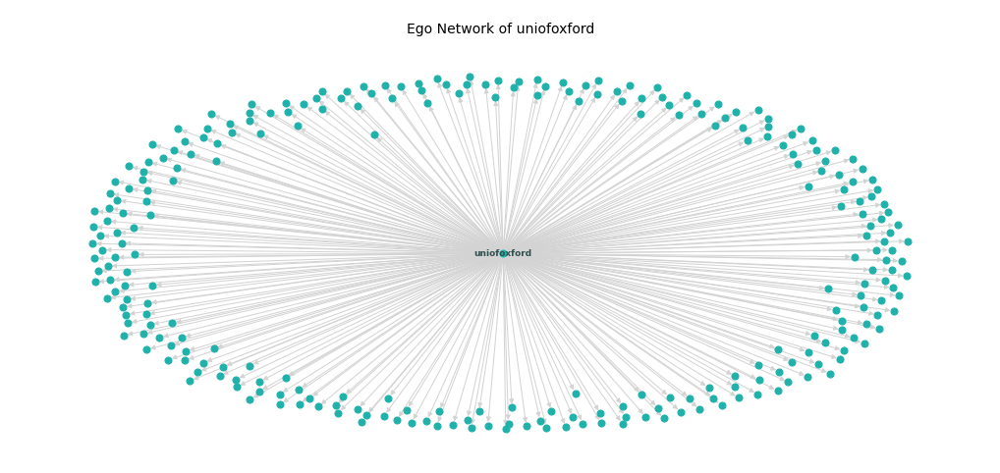

In [82]:
egoOxford=nx.ego_graph(gReply, "uniofoxford")
drawEgo(egoOxford, k=1, labels=["uniofoxford"], font=9, width=18, height=8, nodesize=50, 
        labelAll=False, title="\nEgo Network of uniofoxford", 
        edgeWeight=False)

__Weighted Out-Degree__

Recall that each edge in our network has a weight, where the weight on the edge from A to B is the number of tweets of B that a has replied to.

We can take these edge weights into account when computing centrality values.

The weighted out degree of a node is the sum of the weights on the edges going from that node. This is the total number of replies from a node.

A node with a very high weighted degree may have very few users which they are interacting with, but may interact with them by replying to their tweets very frequently. In some networks, weighted degree can also be helpful for identifying clusters, for example a group of twitter users who interact frequently by replying to eachothers tweets.

We can compare the distribution for degree and weighted degree:

Out-Degree:
Min: 0.00, Max: 271.00, Mean: 49.27

WeightedOut-Degree:
Min: 0.00, Max: 319.00, Mean: 59.27



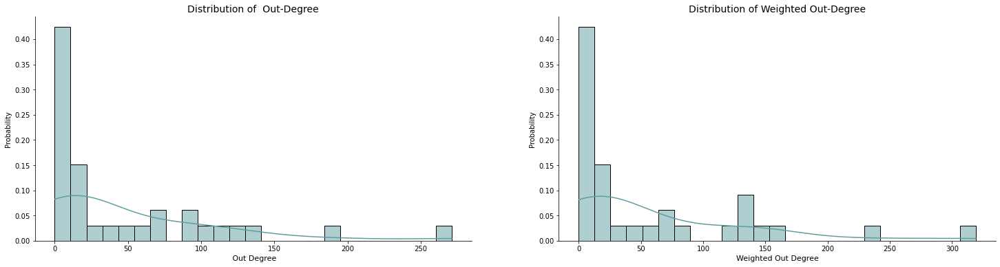

In [83]:
# plots weighted/unweighted out degree depending on arguments
# weight=True => weighted degree
def outdegreeHist(g, weight=False):

    outdegreeDict={}
    # get weighted /unweighted outdegree for the 33 nodes
    for key in nodeLabels:
        #weighted
        if weight:
            outdegreeDict[key]=g.out_degree(weight="weight")[key]
        # unweighted
        else:
            outdegreeDict[key]=g.out_degree[key] # add (node:degree) to dictionary 

    outdegree=pd.Series(outdegreeDict) # dict -> series

    sns.histplot(outdegree, kde=True, bins=25, color = 'cadetblue', stat= 'probability')
    
    label=""
    if weight: label="Weighted"
    plt.title("Distribution of " + label + " Out-Degree", fontsize=14)
    plt.xlabel(label+" Out Degree", fontsize=11)
    print(label+"Out-Degree:\nMin: %.2f, Max: %.2f, Mean: %.2f\n" %(outdegree.min(), outdegree.max(), outdegree.mean()))

# plot unweighed and weighted side by side
fig = plt.figure(figsize=(25,6))
plt.subplot(1, 2, 1)
outdegreeHist(gReply)
plt.subplot(1, 2, 2)
outdegreeHist(gReply, weight=True)
plt.show()

We can immediately see that the shape of the distributions for weighted and unweighted out degree are extremely similar, both with a peak at 0 and strong skew to the right. Both have a min of 0, and the max for out degree is 271 and weighted out degree is 319. The mean is 49.27 for out degree and 59.27 for weighted out degree. The distribution looks very similar for degrees between about 0-50. So the accounts which have replied to between 0 and 50 other accounts in the network have typically only replied to these once, making the value for weighted out-degree = out degree. The accounts with very high out degree - have replied to a large number of accounts - seem to have more variation between weighted and unweighted out-degree. There is an out degree just below 200, and an out degree above 250 which seem to have increased to just below 250 and above 300 for the weighted out degree (we will check this below). So the accounts that have replied to more unique users also seem to have replied to some of these more frequently. 

To see which accounts have the highest/lowest out degree and weighted out degree, and to compare the difference in out degree vs weighted outdegree for each node we can plot a bar chart for each:

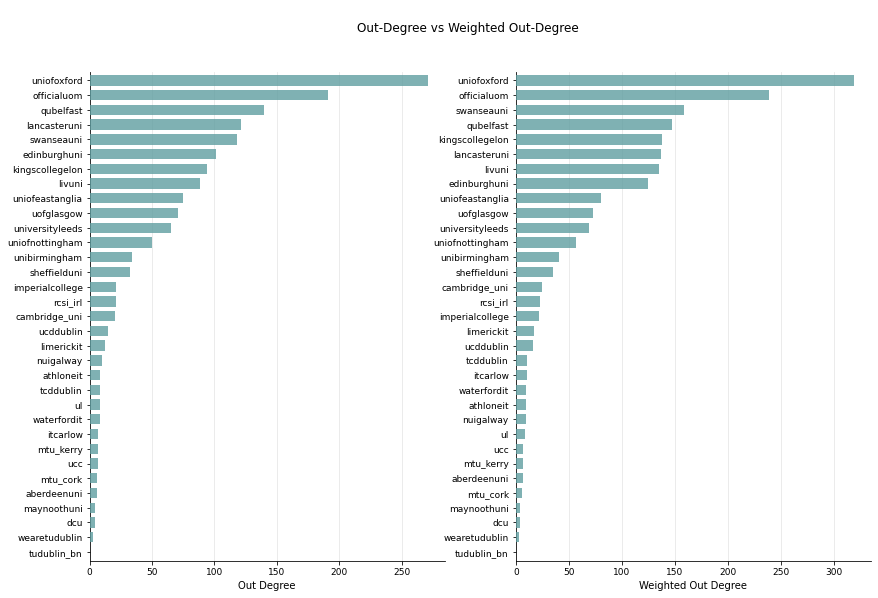

In [84]:
def outDegreeBar(weight=False):
    OutDegree={}

    for key in nodeLabels: # for each of the 33 nodes
        if weight:
            OutDegree[key]=gReply.out_degree(weight="weight")[key]  
        else:
            OutDegree[key]=gReply.out_degree()[key] 

    OutDegree=pd.Series(OutDegree)
    OutDegree=OutDegree.sort_values()
    ax = OutDegree.plot(kind="barh", color="cadetblue", figsize=(14,9), width=0.7, fontsize=9, zorder=3, alpha=0.8)
    ax.xaxis.grid(alpha=0.3);
    if weight: ax.set_xlabel("Weighted Out Degree", fontsize=10)
    else: ax.set_xlabel("Out Degree", fontsize=10)

fig = plt.figure(figsize=(25,15))
fig.suptitle("\nOut-Degree vs Weighted Out-Degree", fontdict={'size':13})
plt.subplot(1, 2, 1)
outDegreeBar()
plt.subplot(1, 2, 2)
outDegreeBar(weight=True)
plt.show()

Oxford has the highest unweighted and weighted out-degree, followed by the University of Manchaster. Queens University has the next highest unweighted out-degree followed by Lancaster and Swansea, whereas Swansea has the next highest weighted out-degree followed by Queens University and Lancaster. The ordering of the lowest out-degrees are the same for weighted and unweighted, with TUD Blanchardstown having the lowest, followed by TUD, DCU, Maynooth, Aberdeen.

For the nodes with the lower out-degrees, as seen in the histogram and again here there is very little difference between the corresponding weighted out-degree. There seems to be a lot more change for the nodes with the higher out degrees. It is difficult to see the change here, so to better visualise this we can plot a __slope chart__:

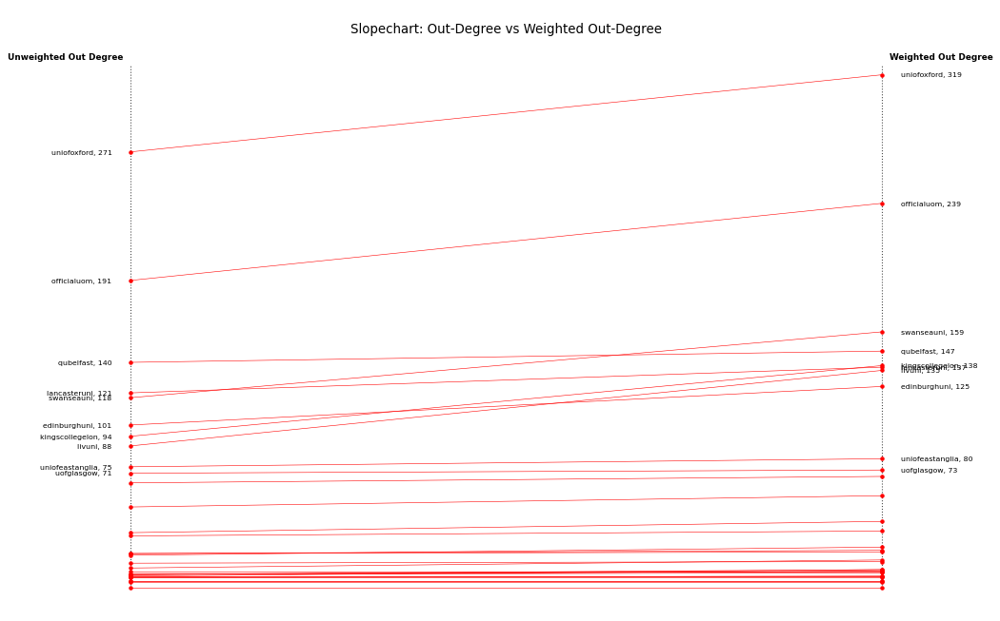

In [85]:
def weightedVsUnweightedSlopeChart(g, max, textPos, n=10, font=7):
    
    # get out degree series
    OutDegree={}
    for key in nodeLabels:
        OutDegree[key]=g.out_degree()[key] 
    OutDegree=pd.Series(OutDegree)

    # get weighted out degree series
    WeightedOutDegree={}
    for key in nodeLabels:
        WeightedOutDegree[key]=g.out_degree(weight="weight")[key]  
    WeightedOutDegree=pd.Series(WeightedOutDegree)

    # concat into a dataframe
    DF=pd.concat([OutDegree, WeightedOutDegree], axis=1).rename(columns={0:"Out-Degree", 1:"Weighted Out-Degree"}).sort_values(by="Out-Degree", ascending=False)

    # list of top n nodes to label (as labels overlap and are difficult to read for the lower values)
    labels=list(DF.index)[:n]

    # function to draw slope line
    def newline(p1, p2, color='black'):
        ax = plt.gca() 
        l = mlines.Line2D([p1[0],p2[0]], [p1[1],p2[1]], color='red', marker='o', markersize=3, linewidth=0.5)
        ax.add_line(l)
        return l

    fig, ax = plt.subplots(1,1,figsize=(14,10), dpi= 80)

    # Vertical Lines
    ax.vlines(x=1, ymin=0, ymax=max, color='black', alpha=0.7, linewidth=1, linestyles='dotted')
    ax.vlines(x=3, ymin=0, ymax=max, color='black', alpha=0.7, linewidth=1, linestyles='dotted')

    # Line Segmentsand Annotation
    for p1, p2, c in zip(OutDegree, WeightedOutDegree, OutDegree.index):

        # add line
        newline([1,p1], [3,p2])

        # add label for highest 10 nodes
        if c in labels:
            ax.text(1-0.05, p1, c + ', ' + str(round(p1)), horizontalalignment='right', verticalalignment='center', fontdict={'size':font})
            ax.text(3+0.05, p2, c + ', ' + str(round(p2)), horizontalalignment='left', verticalalignment='center', fontdict={'size':font})

    # 'Weighted' and 'Unweighted' Annotations
    ax.text(1-0.02, textPos, 'Unweighted Out Degree', horizontalalignment='right', verticalalignment='center', fontdict={'size':8, 'weight':700})
    ax.text(3+0.02, textPos, 'Weighted Out Degree', horizontalalignment='left', verticalalignment='center', fontdict={'size':8, 'weight':700})

    # remove axis
    ax.axes.yaxis.set_visible(False)
    ax.axes.xaxis.set_visible(False)
    ax.set_frame_on(False)

    # add title
    ax.set_title("\nSlopechart: Out-Degree vs Weighted Out-Degree", fontdict={'size':12})

    plt.show()
weightedVsUnweightedSlopeChart(gReply, max=325, textPos=330)


From this slope chart we can very clearly see the change from unweighted -> weighted outdegree for each node. It is very clear that there is little change for the nodes with lower out degree, and significant change for the nodes with higher out degree. So, the users which reply to the most amount of users also tend to reply to these multiple times, whereas the nodes users who do not reply to a large amount only tend to reply once. 

uniofoxford has the hughest weighted and unweighted out-degree. We can take these __edge weights into account when plotting the ego network constructed previously for uniofoxford__:

uniofoxford Edge Weight Counts:
1    231
2     32
3      8
dtype: int64


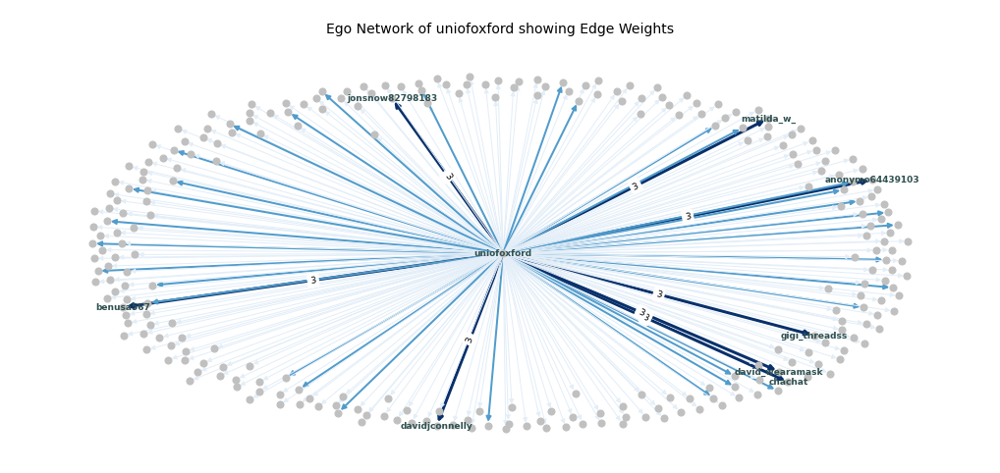

In [86]:
print("uniofoxford Edge Weight Counts:")
print(weightSeries2["uniofoxford"].sort_values(ascending=False).value_counts())

# get the edges with highest weight from the series constructed previously of the edges and weights
w=weightSeries2["uniofoxford"].sort_values(ascending=False).head(8)

# get the indexes for the node labels
labels = list(w.index)
labels.append("uniofoxford")

# get the weight values for the edge labels
weightLabels={} # dictionaty with (uniofoxford, node) : edgeWeight
for node in w.index:
    weightLabels[("uniofoxford", node)]=w[node]

drawEgo(egoOxford, k=1, labels=labels, font=9, width=18, height=8, nodesize=50, 
        labelAll=False, title="\nEgo Network of uniofoxford showing Edge Weights", 
        edgeWeight=True, edgeLabels=True, weightFont=9)

The university of oxford has the highest weighted and unweighted out degree, however we can see from above that none of the edges have a very high weight, however there are a very large number of edges. 8 edges have a weight of 3, 32 a weight of 2, and 231 a weight of 1.

__Betweenness Centrality__

Betweenness centrality identifies strategic linkages, “brokers” or “bridging nodes” in a network. It finds the bottleneck nodes in a network.

Nodes that occur on many shortest paths between other nodes in the network have a high betweenness centrality score.

Betweenness centrality assumes that the nodes which connect most of the other nodes in the shortest possible way are most important.

All of the nodes that are not in the original node list, and so have no edge going from them will have betweenness centrality 0 as by definition they cannot lie on any shortest paths. Of the 33 nodes which do have edges going from them, only 4 of these (cambridge_uni, nuigalway, ucc, uniofoxford) have edges going to them from another of these nodes. 

Recall:

athloneit --> cambridge_uni

qubelfast --> nuigalway

qubelfast --> ucc

uofglasgow --> uniofoxford

These 4 nodes are the only nodes which could have a betweenness centrality score greater than 0.

For example, if node B is one of these 4 nodes and has an edge to it from node A. If B has an edge to some node C, and node A does not have an edge to node C, then node B will lie on the shortest path between A and C. Thus, these 4 nodes have the potential to have an betweennness centrality score above 0, however all other nodes in the network will have a score of 0 by definition.

This is shown below:

In [87]:
betweenness = pd.Series(nx.betweenness_centrality(gReply)).sort_values(ascending=False)
print("Reply Network Betweeness Centrality:\n")
print(betweenness.head(6))

Reply Network Betweeness Centrality:

uniofoxford       0.000100
cambridge_uni     0.000007
nuigalway         0.000004
ucc               0.000003
lwkidmankidman    0.000000
garnetldesigns    0.000000
dtype: float64


Above we can see the betweenness centrality scores sorted in descending order. As expected, there are 4 nodes which have a non-zero score, and all other nodes have a score of 0. These 4 nodes are the 4 nodes mentioned above which have an edge going from one of the other nodes in the network, and edges going to other nodes. These are the only nodes in the network which lie on shortest paths other than the paths from themselves to the nodes they are directly connected to.

Oxford had the highest betweenness centrality score which is unsurprising as it also has the highest out-degree, so for each of these nodes that oxford has an edge to, if the University of Glasgow (which has an edge to oxford) does not already have an edge to these nodes, then oxford will lie on the shortest path from glasgow to each of these nodes.

As mentioned previously, Queen's University has an edge to UCC and NUI Galway. We can plot a __subgraph__ of just these nodes and the nodes they are connected to:

In [88]:
nodeList=["qubelfast", "nuigalway", "ucc"]

l=["qubelfast", "nuigalway", "ucc"]

# get a list of all nodes that the 3 colleges have edges to
for node1, node2 in gReply.edges(data=False):
    if node1 in l: nodeList.append(node2)
    elif node2 in l: nodeList.append(node1)

In [89]:
# construct a subgraph from the list of nodes
subG = gReply.subgraph(nodeList)
print("Number of nodes: %d, Number of edges: %d" %(subG.number_of_nodes(), subG.number_of_edges()))

Number of nodes: 158, Number of edges: 157


Number of edges from
	UCC:   7
	NUI Galway:   10
	Queen's University:   140


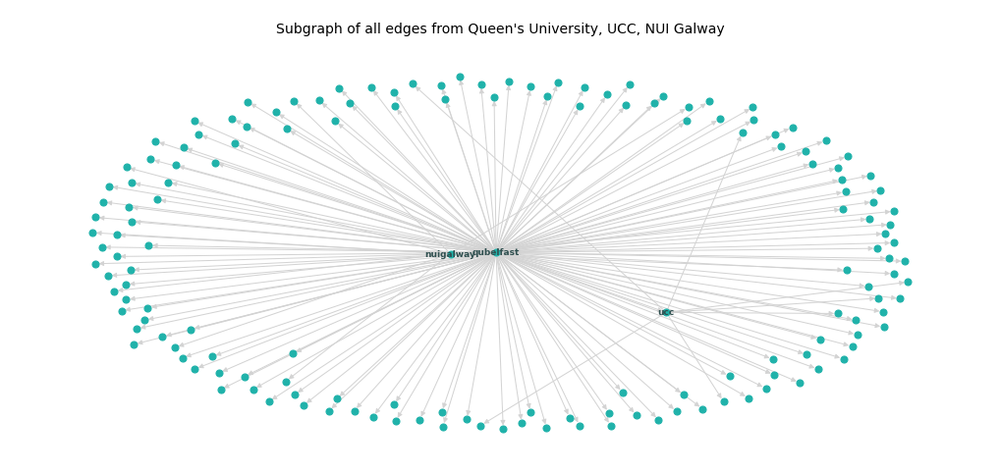

In [90]:
print("Number of edges from\n\tUCC:   %d\n\tNUI Galway:   %d\n\tQueen's University:   %d" 
      % (gReply.out_degree["ucc"], 
         gReply.out_degree["nuigalway"], 
         gReply.out_degree["qubelfast"]))

drawEgo(subG, k=1, labels=l, font=9, width=18, height=8, nodesize=50, 
        labelAll=False, title="\nSubgraph of all edges from Queen's University, UCC, NUI Galway", 
        edgeWeight=False, edgeLabels=False)

In [91]:
print("Weakly Connected:", nx.is_weakly_connected(subG))

Weakly Connected: True


From the subgraph above we can see all edges of the nodes for Queen's University, UCC, NUI Galway. Because there is an edge from Queen's University to UCC and NUI Galway the subgraph is weakly connected. Queen's University has a path to each node which UCC and NUIGalway are connected to.

__Closeness Centrality__

The closeness centrality of a node is defined as the reciprocal mean distance from the node to all other reachable nodes in the network. It shows how close the node is to the rest of the graph. This is again a global metric as it does not depend only on the nodes neighbourhood.

It is calculated as 1 / the average of the shortest path length from the node to every other node in the network.

Closeness centrality indicates nodes as more central if they are closer to most of the nodes in the graph. 

By default, for directed graphs networkx calculates the inward distances for the closeness centrality. Thus we know that of the 33 nodes from the original node list, the closeness centrality score will be 0 for all but the 4 that have an edge going to them. For all other nodes in the network, the distance will be non-zero as they have at least one edge going to them.

Closeness Centrality Summary Statistics:
	Min:  0.0
	Max:  0.0016
	Mean:  0.0006
	Median:  0.0006


Closeness Centrality Sorted:
 _alexiabis         0.001622
matthewpfirth      0.001622
dannyreeves11      0.001217
sophie_howaard     0.001217
arkisaacnewton     0.001217
silvasbuddy        0.001217
valebonilla1105    0.001217
findauniversity    0.001217
bantshireuni       0.001217
arkbolingbroke     0.001217
hac1989            0.000811
corinneoxford      0.000811
dtype: float64 




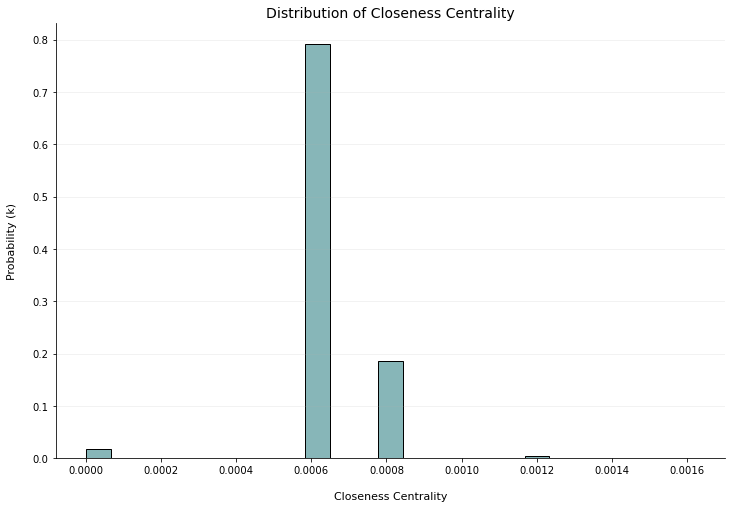

In [92]:
measureStats(nx.closeness_centrality(gReply), "Closeness Centrality", r=4)
print("\n\nCloseness Centrality Sorted:\n",
      pd.Series(nx.closeness_centrality(gReply)).sort_values(ascending=False).head(12), "\n\n")
densityPlot(nx.closeness_centrality(gReply), 
            "Closeness Centrality", height=8, width=12, bins=25, adjust=False, kde=False)

The values for closeness centrality range from 0-0.0016, with a mean of 0.0006.

A very small percentage of nodes, about 2%, have a closeness centrality of 0-0.0001. These are likely to be the 29 nodes from the original node list which do not have an edge to them, as discussed above. Almost 80% have a closeness centraltiy score of about 0.0058 - 0.00065. Around 18% have score of about 0.0078-0.0085. Less than 1%, about 8 nodes, have a score between 0.00118-0.00125, with just 2 nodes having a score above 0.0016. 

We can also calculate the __closeness centrality for outward edges__ instead of inward edges using .reverse(). The values will be 0 for all nodes other than the 33 nodes with edges going from them, so we can look at the distribution for the values of these 33 nodes only:

In [93]:
def valuesForOriginalNodes(measure, series=False, values=False):
    measureDict={}

    for key in nodeLabels: # for each of the 33 nodes
        measureDict[key]=measure[key] # add (node:measure) to dictionary 

    if series:
        return pd.Series(measureDict) # dict -> series
    
    elif values:
        return list(measureDict.values()) # dict values
    
    else:
        return measureDict # dict

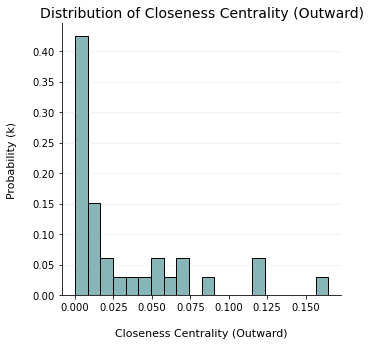

In [94]:
values=valuesForOriginalNodes(nx.closeness_centrality(gReply.reverse()))
densityPlot(values, "Closeness Centrality (Outward)", height=5, width=5, bins=20, adjust=False, kde=False)  

The distribution looks very similar to that of out-degree centrality. We can plot both and compare:

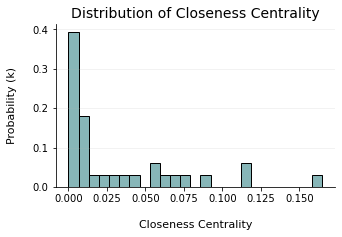

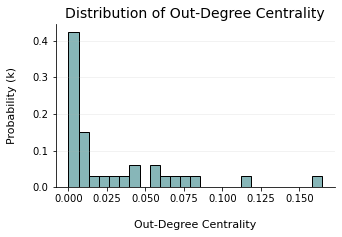

In [95]:
densityPlot(values, 
            "Closeness Centrality", height=3, width=5, bins=25, adjust=False, kde=False)

values2=valuesForOriginalNodes(nx.out_degree_centrality(gReply))
densityPlot(values2, 
            "Out-Degree Centrality", height=3, width=5, bins=25, adjust=False, kde=False)

The distributions for the 33 nodes for closeness centrality (outward) and out-degree centrality are almost identical.

For all nodes excluding the 4 nodes which have an edge to another of the nodes in the original node list as discussed previously, they are all a distance of 1 from the nodes they are directly connected to and a distance of 0 from all other nodes. Thus the closeness centrality and out-degree centrality will be the same for these nodes.

For the 3 nodes athloneit, qubelfast and uofglasgow that have an edge to another node in the original node list 
(Recall: athloneit -> cambridge_uni, qubelfast -> nuigalway, qubelfast -> ucc, uofglasgow -> uniofoxford), they have a non-zero length path to each of the users that the node they are connected to is connected to. Thus the closeness centrality score will be slightly lower than the out-degree centrality score for these nodes.

So for 30 of the values for closeness centrality, the values are the same as for out-degree centrality, with a change for just 3 nodes.

We can check that the values are the same for all but these 3 nodes:

In [96]:
print("Nodes with closeness != out-degree centrality:\n\n")
for node in nodeLabels:
    if round(nx.closeness_centrality(gReply.reverse())[node], 6) !=round(nx.out_degree_centrality(gReply)[node], 6):
        print(node)
        print("\tCloseness Centrality:\t",nx.out_degree_centrality(gReply)[node])
        print("\tOut Degree Centrality:\t", nx.closeness_centrality(gReply.reverse())[node])

Nodes with closeness != out-degree centrality:


qubelfast
	Closeness Centrality:	 0.08515815085158152
	Out Degree Centrality:	 0.0861684425427189
uofglasgow
	Closeness Centrality:	 0.04318734793187348
	Out Degree Centrality:	 0.11606196639716126
athloneit
	Closeness Centrality:	 0.004866180048661801
	Out Degree Centrality:	 0.009935117599351177


As expected, the values for closeness centrality and out degree centrality are the same for all nodes except the 3 which have an edge to a node in the original node list. For these nodes the closeness centraltiy is lower than the out-degree centrality.

We have now characterised the structure and connectivity of the reply network, as well as identified important nodes using various centrality measures, namely uniofoxfor which had the highest out degree, weighted out degree and betweenness. Next we can construct a similar mention network based on the mentions of users in tweets by the original 33 users:

## <font color='darkcyan'>Task 3: Mention Network</font>

The next network that I will construct and categorise is a mention network. In this network, nodes will be users from the node list in task 1 as well as users from the wider Twitter platform. A directed edge from node A to node B indicates that node A mentioned node B in a tweet. All edges will be from nodes in the list from task 1. The network is a weighted directed network, where the weight on the edge between node A and node B indicates the number of times A has mentioned B.

The "entities" column of the tweets dataframe contains a dictionary for each row, which contains the key, value pair "user_mentions". This contains details about all users mentioned in the tweet as shown below:

In [97]:
for x in dfTweets.entities.iloc[1]:
    print(x, ":", dfTweets.entities.iloc[1][x], "\n")

hashtags : [] 

symbols : [] 

user_mentions : [{'screen_name': 'AdaptCentre', 'name': 'The ADAPT Centre', 'id': 2838217211, 'id_str': '2838217211', 'indices': [3, 15]}, {'screen_name': 'InfinityCurv', 'name': 'Dr. Aidan Meade', 'id': 1446369636, 'id_str': '1446369636', 'indices': [44, 57]}, {'screen_name': 'WeAreTUDublin', 'name': 'Technological University Dublin', 'id': 95665759, 'id_str': '95665759', 'indices': [59, 73]}, {'screen_name': 'IBMResearch', 'name': 'IBM Research', 'id': 16319797, 'id_str': '16319797', 'indices': [74, 86]}, {'screen_name': 'scienceirel', 'name': 'SFI', 'id': 125619668, 'id_str': '125619668', 'indices': [87, 99]}] 

urls : [{'url': 'https://t.co/V7zfoWkdU6', 'expanded_url': 'https://twitter.com/InfinityCurv/status/1323274037758468096', 'display_url': 'twitter.com/InfinityCurv/s…', 'indices': [100, 123]}] 



Firstly we can construct a directed network and add nodes from the follower network from task 1.

In [98]:
# construct directed network
gMention=nx.DiGraph()

# add nodes from the follower network
gMention.add_nodes_from(gFollowers)

Next, for each tweet we can extract the screen names of all users mentioned in the tweet, and add an edge from the user who tweeted the tweet to all users who are mentioned. Each mention has a weight of 1. 

In [99]:
# iterate through tweets
for index, row in dfTweets.iterrows():
    
    # get screen name of user who tweeted the tweet
    mentionedBy=row["screen_name"]
    
    # for each user that is mentioned
    for user in row["entities"]["user_mentions"]:
        
        # extract their screen name
        mentioned=user["screen_name"].lower()
        
        # add edge from mentionedBy -> mentioned
        
        # if the edge already exists, increment the weight
        if gMention.has_edge(mentionedBy, mentioned):
            gMention[mentionedBy][mentioned]["weight"] += 1
            
        # if the edge does not already exist, add the edge with weight of 1
        else:
            gMention.add_edge(mentionedBy, mentioned, weight=1)

print("\nEdges and edge weightsd successfully added to the mention network")


Edges and edge weightsd successfully added to the mention network


__Number of nodes & edges__

In [100]:
print("Number of nodes:\t", gMention.number_of_nodes(), "\nNumber of edges:\t", gMention.number_of_edges())

Number of nodes:	 7888 
Number of edges:	 9111


__Isolated Nodes__

I constructed the graph from the nodes of the follower graph first, so that each of the 33 nodes in the original network would be in the mention network. Any of these nodes which have not mentioned any other users, or who have not been mentioned by one of the other 32 nodes will be isolated. We can check if there are any isolated nodes:

In [101]:
print("Isolated Nodes: ",list(nx.isolates(gMention)))

Isolated Nodes:  []


There are no isolated nodes, so each of the 33 original users has mentioned a user in a tweet, or been mentioned by one of the other 32 original user.

__Connectivity__

A directed network such as this is said to be strongly connected if every node is reachable from every other node.
We know that this will not be the case as all mentions are from one of the 33 nodes in our original node list, so there will be no edge going from any other node, and so every node is not reachable from every other node. We can check this:

In [102]:
print("Strongly Connected: ", nx.is_strongly_connected(gMention))

print("Number of strongly connected components: ", nx.number_strongly_connected_components(gMention))

Strongly Connected:  False
Number of strongly connected components:  7862


The network is not strongly connected, and there are 7862 strongly connected components.

We can also check if the underlying undirected graph is connected by checking if our graph is weakly connected, i.e. every node is reachable from every other node in the underlying undirected graph. 

In [103]:
print("Weakly Connected: ", nx.is_weakly_connected(gMention))

Weakly Connected:  True


The network is weakly connected, so every node is reachable from every other node in the underlying undirected network. This is unlike the reply network which was not weakly connected, and had 22 weakly connected components.

__Network Density__

Network density refers to the portion of potential edges between nodes in a network that exist as actual edges.

Density is calculated numerically as the ratio of existing edges over the total number of potential edges between all pairs of nodes.

In [104]:
print("Density %.5f" % nx.density(gMention))

Density 0.00015


The density of the network is very low at 0.00015, which means that of all possible edges in the network, only 0.015% of these are actual edges. This is unurprising, as the network only contains mentions from the 33 nodes in the original node list, but contains their mention of all other twitter users that they have mentioned. There are 7888 nodes but edges going from only 33 of these. So of a possible (7888)(7887)=62,212,656 edges there are only 9111. The reply network was very sparse with a density of 0.00061, however this mention network is even more sparse.

__Diameter__

A network’s diameter is the maximum distance between all pairs of its nodes - i.e. the longest shortest path in the entire network. The diameter will be infinity if the network is not strongly connected, which is the case here. We can once again check this:

In [105]:
try:
    print("Diameter: ", nx.diameter(gMention))

except NetworkXError:
    print("Diameter = infinity")

Diameter = infinity


As with the reply network, because every node is not reachable from every other node, the longest shortest path, i.e. the density, is infinity.

__Reciprocity__

In [106]:
print("Reciprocity %.8f" % nx.reciprocity(gMention) )
reciprocity(gMention) # function from task 2

Reciprocity 0.00439030
Number of reciprocated edges:  20


Unlike the reply network which had a reciprocity of 0, 0.44% of edges in the mention network are reciprocated, i.e. 20 edges. This means that of the 33 nodes in the original network, 20 pairs of these have both mentioned eachother in tweets.

We can check how many edges there are in total between the nodes in the original nodes list:

In [107]:
mentions=[]

# get all unique pairs of nodes in the original node list
for pair in itertools.combinations(list(nodeLabels.keys()), r=2):
    
    # check for edge between the pair
    if gMention.has_edge(pair[0], pair[1]):
        mentions.append(pair)
        
    if gMention.has_edge(pair[1], pair[0]):
        mentions.append((pair[1], pair[0]))
        
print("Number of edges between nodes in the original node list: ", len(mentions), "\n")

Number of edges between nodes in the original node list:  131 



There are 131, so 91 (131-2x20) of these are not reciprocated. 

__Clustering Coefficient__

Clustering coefficient indicates the level of concentration of edges in the neighbourhood of a node. It is the fraction of pairs of its neighbours (where a neighbour of a node is a node that the node has an edge to) that have edges between one another - i.e. how many closed triads around this node. For directed graphs such as this, the direction of the edges are ignored.

(Closed triad = if a node A is connected to nodes B and C, and B and C are also connected (B->C or C->B or both), then A, B and C form a closed triad.)

We can calculate the average clustering coefficient of all of the nodes in the network.

In [108]:
print("Mention Network Average Clustering Coefficient: ", nx.average_clustering(gMention))

Mention Network Average Clustering Coefficient:  0.02830767152711825


The clustering coefficient is 0.28, so for each node in the network 2% of the pairs of nodes which it is connected to are too connected (with an edge in either direction). In comparison, the clustering coefficient for the reply network was 0, as there were zero undirected closed triads in the network.

__Distribution of Edge Weights__

In this mention network the weight on an edge between node A and B represents the number of times node A mentioned node B in a tweet. We can look at the distribution of these edge weights.

First construct a pandas series from the edge weights:

In [109]:
weightSeries=weightSeriesFunc(gMention)
display(weightSeries.head(10))

cambridge_uni  theul              22
               fitzmuseum_uk       3
               englishunicam       1
               cambridge_ice       2
               simoneschnall       1
               sander_vdlinden     4
               roozenbot           2
               cambpsych           8
               csdmlab             5
               unicamcareers       5
dtype: int64

In [110]:
# sort descending, display highest 10 weights
display(weightSeries.sort_values(ascending=False).head(10))

tudublin_bn    wearetudublin    162
ul             ul               130
mtu_cork       cit_ie           124
mtu_kerry      ittralee         102
tcddublin      tcddublin         98
maynoothuni    maynoothuni       95
ucc            ucc               93
ucddublin      ucddublin         91
wearetudublin  wearetudublin     91
rcsi_irl       rcsi_irl          85
dtype: int64

Above is the weight series sorted in descending order. We can see that many of the highest edge weights are from edges from a node to itself, i.e. college accounts mentioning themselves in tweets. As with the reply network, we can remove these edges, as a node mentioning their own account doesn’t tell us much about the influence or centrality of the node and may skew the results.

In [111]:
print("Num edges before: ", gMention.number_of_edges())

e=dict(gMention.edges) # copy edges to dictionary

# remove edges from a node to itself
for edge in e: 
    if edge[0] == edge[1]: 
        gMention.remove_edge(edge[0], edge[1])


print("Num edges after: ", gMention.number_of_edges())

Num edges before:  9111
Num edges after:  9079


32 edges were removed, so of the 33 nodes in the original node list, 32 of them had mentioned themselves in tweets. We can calculate the 10 highest weights again with these edges removed:

In [112]:
weightSeries=weightSeriesFunc(gMention)
display(weightSeries.sort_values(ascending=False).head(10))

tudublin_bn      wearetudublin     162
mtu_cork         cit_ie            124
mtu_kerry        ittralee          102
tudublin_bn      tudublin_bnlib     69
sheffielduni     shefuninews        56
mtu_cork         citlibrary         51
itcarlow         simonharristd      51
uniofnottingham  uonsu              49
ucc              rtebrainstorm      46
mtu_kerry        mtu_ie             41
dtype: int64

Now we can see that the highest edge weight is a weight of 162, and is from tudublin_bn mentioning wearetudublin 162 times. This is followed by a weight of 124 from mtu_cork to cit_ie. 

We can plot a histogram of the edge weights:

Edge Weight Summary Statistics:
	Min:  1
	Max:  162
	Mean:  2.0
	Median:  1.0


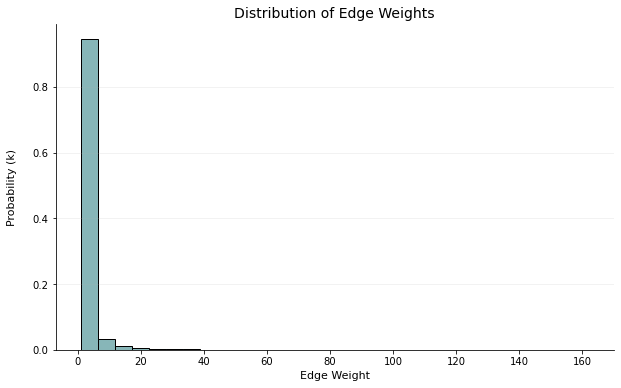

In [113]:
plotWeightHist(weightSeries, width=10, height=6)

With the edges from nodes to themselves removed, the range of edge weights is from 1 to 162 with a mean of 2, so on average for each user that is mentioned by another user they are mentioned twice. 95% of edges have a weight between 1 and 6. 3% have a weight between 6 and 12, 1% between 12 and 18, and 1% between 18 and the max of 162. 

It is difficult to see the distribution of the higher edge weights, due to the large percentage of low weights.To more clearly see the distribution of the higher edge weights we can plot a histogram of edge weights above 18:

Edge Weight Summary Statistics:
	Min:  19
	Max:  162
	Mean:  32.0
	Median:  26.0


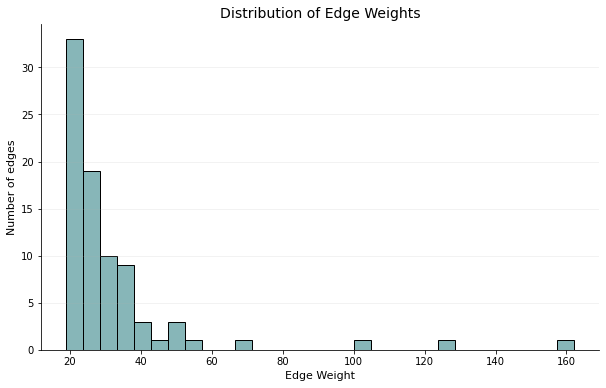

In [114]:
plotWeightHist(weightSeries.loc[weightSeries > 18], width=10, height=6, stat='count', label="Number of edges")

Around 74 edges, or 0.00815% (74/9079) of nodes, have a weight between 20 and 40. 9 edges have a weight between 40 and 80. 1 node has an edge between 100-105, 1 has an edge between 120-130, and 1 has an edge of 162.

The distribution of the edge weights for the reply network before removing the edges from nodes to themselves was very similar to that of the above weight distribution, with mean, median and min the same as above, and a max of 162, just 3 below the mean for the mention network. After removing the edges from nodes to themselves, however, the distribution was very different for the reply network, with a much smaller range, and a max of 8 and mean of 1.

As mentioned previously, the edge with the highest weight is between tudublin_bn and wearetudublin, we can see this below:

In [115]:
display(weightSeries.sort_values(ascending=False).head(10))

tudublin_bn      wearetudublin     162
mtu_cork         cit_ie            124
mtu_kerry        ittralee          102
tudublin_bn      tudublin_bnlib     69
sheffielduni     shefuninews        56
mtu_cork         citlibrary         51
itcarlow         simonharristd      51
uniofnottingham  uonsu              49
ucc              rtebrainstorm      46
mtu_kerry        mtu_ie             41
dtype: int64

The edge with the highest weight is between tudublin_bn and wearetudblin, with a weight of 162. tudublin_bn also has another edge with weight in the top 10, a weight of 69. We can plot a graph of the __ego network for tudublin_bn__, and let the edge width and colour indicate edge weight:

In [116]:
# construct ego network
ego_tudublin_bn = nx.ego_graph(gMention, "tudublin_bn")

# get the highest weight edges of kingscollegelon
w=weightSeries["tudublin_bn"].sort_values(ascending=False).head(15)

# get the indexes for the node labels
labels = list(w.index)
labels.append("tudublin_bn")

# get the values for the edge labels
weightLabels={} # dictionaty with (kingscollegelon, node) : edgeWeight
for node in w.index:
    weightLabels[("tudublin_bn", node)]=w[node]

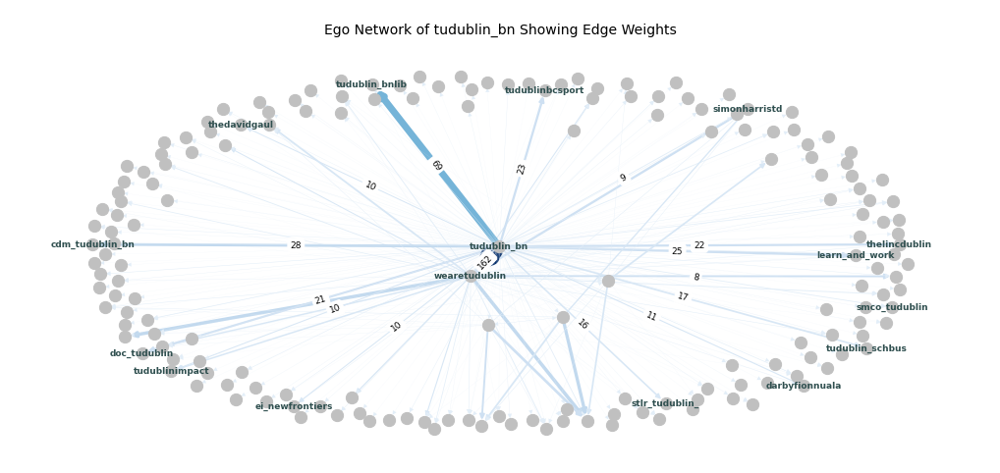

In [117]:
drawEgo(ego_tudublin_bn, k=2.5, labels=labels, font=9, width=18, height=8, scale=5, seed=900, 
        labelAll=False, title="\nEgo Network of tudublin_bn Showing Edge Weights", 
        edgeWeight=True, weightFont=9, edgeWidth=10)

tudublin_bn has a quite large number of edges with high weights. It also has a very large number of edges with smaller weights. 

In comparison to the reply network, when we looked at the ego network for kings college london which also had multiple edges in the top 10 edge weights, upon plotting the ego network we saw that it had very few edges with a high degree. Here however, the 15 highest edge weights are labelled and these are all quite high, between 8 and 162.

#### Degree

As with the directed follower and reply networks, here we can distinguish between:

    In-degree: count of number of incoming edges for each node.
    Out-degree: count of number of outgoing edges for each node.

In the case of this twitter mention network, the in-degree of a node is the number of other users in the network that have mentioned the node. The out-degree is the number of users in the network that the node has mentioned.

Intuitively, a node with a lot of edges going from it (out-degree) is important and influential as it is interacting with a lot of different users by mentioning them in tweets. A node with a high in-degree would also be important as it has a lot of users mentioning it.

__In-Degree__

First we can look at the distribution of in degree.

In-degree represents the number of unique users who have mentioned a user.

In-Degree Summary Statistics:
	Min:  0
	Max:  15
	Mean:  1.151
	Median:  1.0


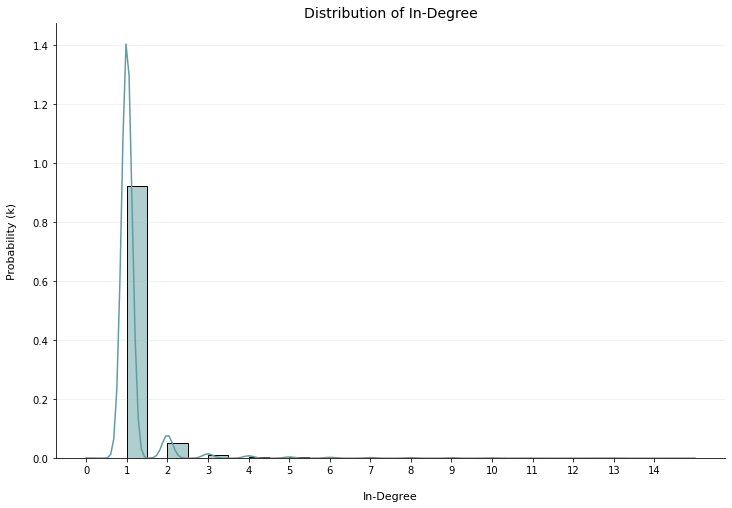

In [118]:
measureStats(dict(gMention.in_degree()), "In-Degree", r=3)
densityPlot(dict(gMention.in_degree()), "In-Degree", width=12, height=8, bins=30, kde=True, adjust=True, min=0, max=15, step=1)

The values for degree range from 0-15 with a mean of 1.15. The distribution is strongly skewed to the right with the highest peak at degree 1. About 95% of nodes have an in-degree of 1, i.e. they have been mentioned by 1 unique user. 5% have a degree of 2, and about 1% a degree of 3. We can see below that 0.001%, or 110 nodes have an in-degree between 3 and 10, and 10 nodes or 0.001% have a degree above 10.

Exact degree counts:

In [119]:
d=pd.Series(dict(gMention.in_degree()))
print("In-degree 0:\t %d nodes, %.5f %%" % (d.loc[d==0].shape[0], d.loc[d==0].shape[0]/gMention.number_of_nodes()))
print("In-degree 3-10:\t %d nodes, %.3f %%" % (d.loc[d>3][d<=10].shape[0], d.loc[d==0].shape[0]/gMention.number_of_nodes()))
print("In-degree >10:\t %d nodes, %.3f %%" % (d.loc[d>10].shape[0], d.loc[d==0].shape[0]/gMention.number_of_nodes()))

In-degree 0:	 4 nodes, 0.00051 %
In-degree 3-10:	 110 nodes, 0.001 %
In-degree >10:	 10 nodes, 0.001 %


Above shows the distribution of the in degrees for all nodes in the network. We can also look at the distribution of __in-degrees for just the 33 nodes in the original network__:

In-Degree Summary Statistics:
	Min:  0
	Max:  10
	Mean:  3.97
	Median:  3.0


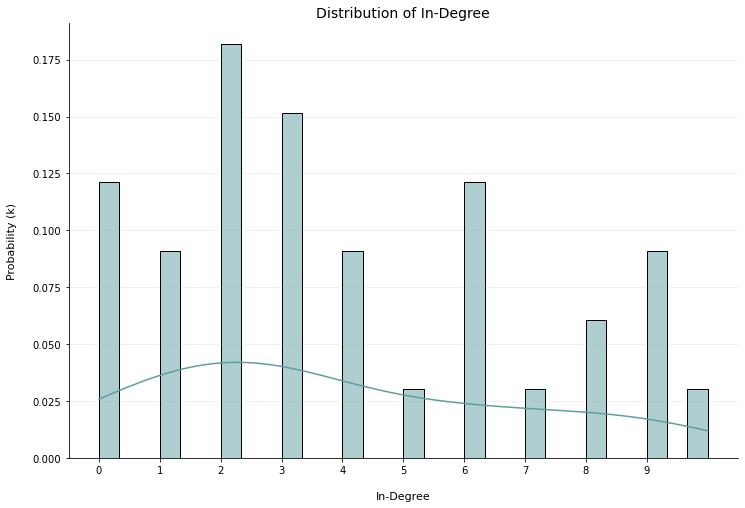

In [120]:
# get values for just the 33 original nodes
val=valuesForOriginalNodes(dict(gMention.in_degree()))
measureStats(val, "In-Degree", r=3)
densityPlot(val, "In-Degree", width=12, height=8, bins=30, kde=True, adjust=True, min=0, max=10, step=1)

Of the 33 nodes, about 12% have not been mentioned by any of the other 32 nodes (in-degree 0). Around 8.5% have been mentioned by 1. The highest peak is at in-degree 2 and contains 18% of the 33 nodes. 15% have been mentioned by 3, and 8.5% by 4. Only about 3% have been mentioned by 5, and 12% have been mentioned by 6. 3% have been mentioned by 7, 6% by 8, 9% by 9 and 3% by 10.

We can plot a bar chart to see which have been mentioned the most/least:

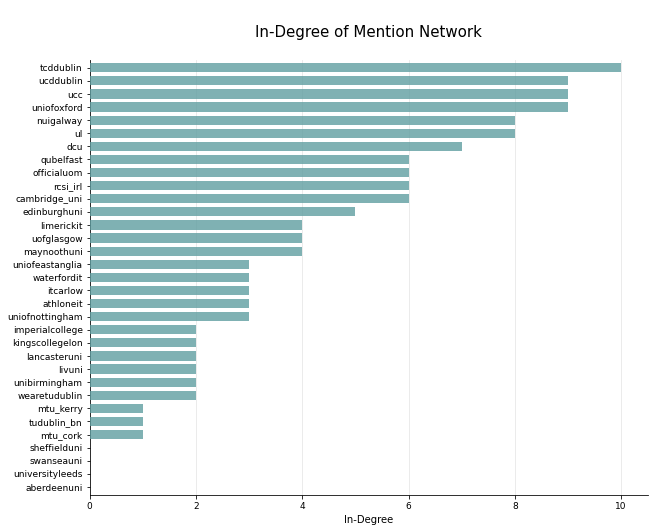

In [121]:
horizontalBarChart(gMention, val, "In-Degree", color=False, network="Mention")

Trinity College Dublin has the most mentions, 10, followed by UCD, UCC and Oxford with 9. UL and DCU have 10. Aberdeen, Leeds and Swansea have the least with 0 mentions, followed by MTU Kerry, TUC Blanch and MTU Cork with 1. It seems that the Irish colleges have the most mentions by the other users. 

We can check this by __colouring the bars according to the country__:

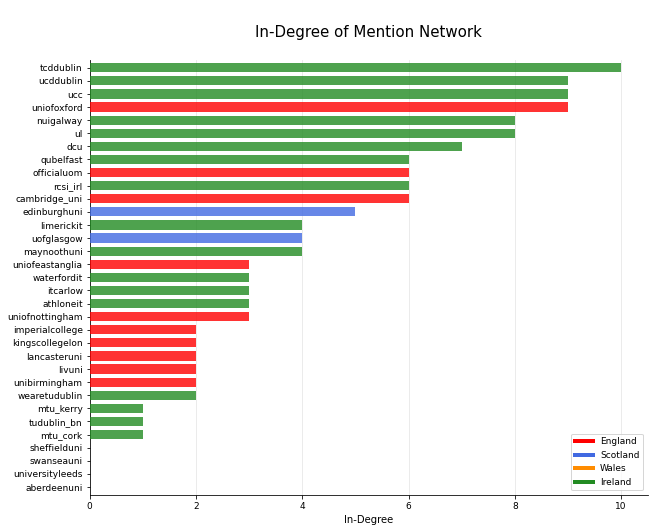

In [122]:
countryAttribute(gMention)
horizontalBarChart(gMention, val, "In-Degree", color=True, network="Mention")

Its clear that the Irish colleges typically have the highest in-degrees, i.e. mentioned by the most users (from the other 32 users)

__Out-Degree__

Next we can look at the distribution of out degree centrality (normalised out-degree). The out-degree of a node is the number of unique users that the node has mentioned. The out degree will be 0 for all nodes other than the 33 from the original node list:

Out-Degree Centrality Summary Statistics:
	Min:  0.0
	Max:  0.059
	Mean:  0.0
	Median:  0.0


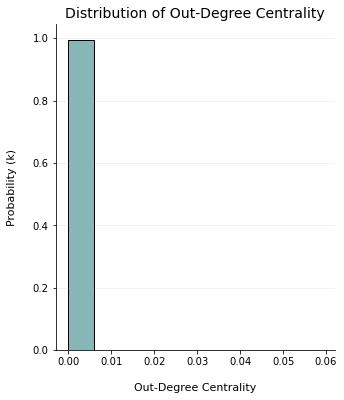

In [123]:
measureStats(nx.out_degree_centrality(gMention), "Out-Degree Centrality", r=3)
densityPlot(nx.out_degree_centrality(gMention), 
            "Out-Degree Centrality", height=6, width=5, bins=10, kde=False, adjust=False)

We can __plot the values for just the nodes from the original node list__ so the distribution is more visible, as we know that all other nodes will have out-degree 0.

Out-Degree Centrality Summary Statistics:
	Min:  0.006
	Max:  0.059
	Mean:  0.035
	Median:  0.036


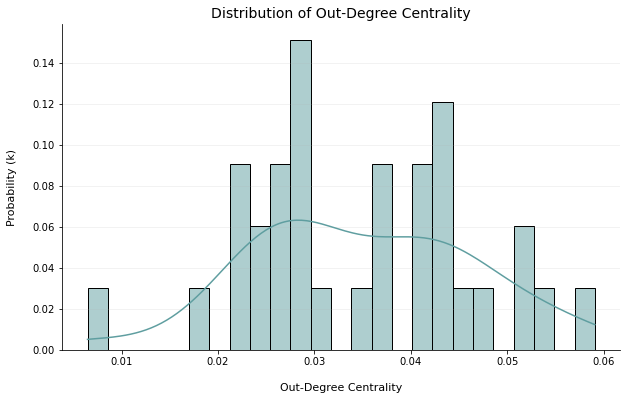

In [124]:
# get values for the 33 nodes
val=valuesForOriginalNodes(nx.out_degree_centrality(gMention))
measureStats(val, "Out-Degree Centrality", r=3)
densityPlot(val, "Out-Degree Centrality", height=6, width=10, bins=25, kde=True, adjust=False)

For the 33 nodes from the original network, the range of values for in-degree centrality are from 0.6% to 5.9%, with a mean of 3.5%, so on average each of the nodes has mentioned 3.5% of all other nodes in the network, or 275 nodes. The distribution looks approximately bimodal with a peak at around 2.75% and 4.5%.

3% of the 33 nodes have an out-degree centrality score below 1%, and 3% have a score between 1 and 2%. 39% have a value between 2 and 3%, 15% between 3 and 4%, 27% between 4 and 5%, and 12% between 5 and 6%. 

We can plot a bar chart to see the ordering of the out-degree centrality scores:

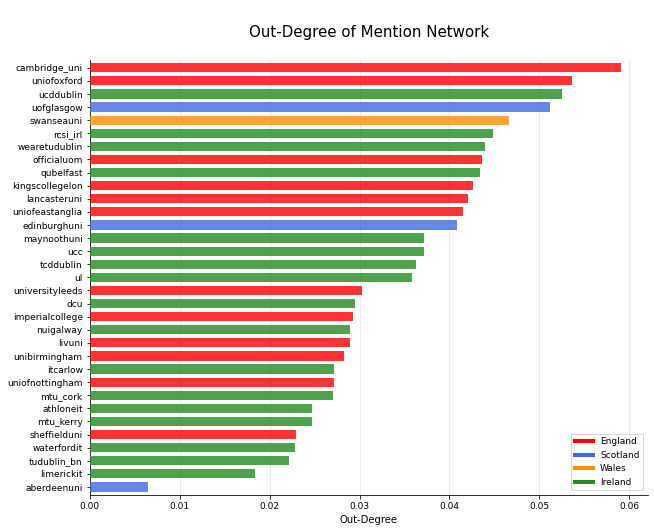

In [125]:
horizontalBarChart(gMention, val, "Out-Degree", color=True, network="Mention")

Cambridge has the highest out-degree, i.e. has mentioned the largest number of users in the whole network, with a value of almost 6%. This is followed by Oxford with 5.5%, UCD with 5.25% and Glasgow with just over 5%. Following this we have Swansea. This is interesting, as Swansea had the 2nd lowest number of followers, following and was not mentioned in any tweets from the other 32 colleges, but has mentioned 5th highest number of users in its tweets. Aberdeen has the lowest out-degree centrality with a score of just over 0.5%, followed by Limerick IT with just under 2% and TUD Blanch with 2.25%. For in-degree the Irish colleges seemed to have the highest values on average, however here the values are a lot more evenly distributed between the countries.

We can plot the __ego network of Cambridge University__ which had the highest out-degree, i.e. mentioned the most users:

Number of nodes: 467


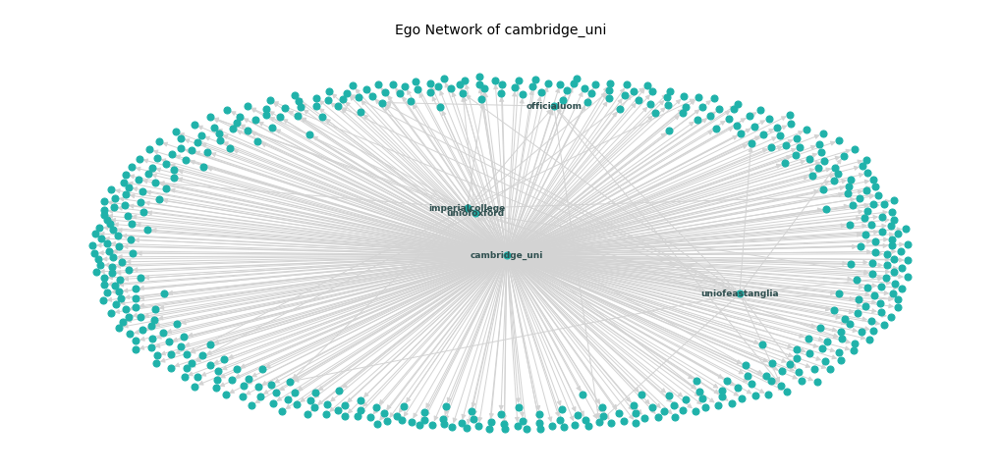

In [126]:
# construct ego network
ego_cambridge_uni=nx.ego_graph(gMention, "cambridge_uni")

print("Number of nodes: %d" % nx.number_of_nodes(ego_cambridge_uni))

# label nodes from original follower network which cambridge has an edge to
l=["cambridge_uni"]
for n in nodeLabels:
    if n in ego_cambridge_uni.nodes():
        l.append(str(n))

drawEgo(ego_cambridge_uni, k=1, labels=l, font=9, width=18, height=8, nodesize=50, 
        labelAll=False, title="\nEgo Network of cambridge_uni", 
        edgeWeight=False)

cambridge_uni has an edge to 466 nodes. We can see that it has an edge to Oxford, East Anglia, Imperial College, and Uni of Manchester, so it has mentioned these colleges in at least 1 tweet. We can also see that these have mentioned a number of the same users as cambridge_uni.

__Weighted Out Degree__

Recall that the weight of an edge is the number of times the source node has mentioned the target node in a tweet.

Next we can look at the weighted out degree, which is the sum of the weights on the edges going from that node, i.e. the sum of the number of mentions of each user. 

As with unweighted out-degree we can plot the values just for the 33 nodes from the original network, as we know that the values will be 0 for the other nodes as there are no edges going from them.

We can begin by comparing the overall distribution between the unweighted and weighted out-degree.



Unweighted vs Weighted Out Degree:


Out-Degree:
Min: 51.00, Max: 466.00, Mean: 275.12

WeightedOut-Degree:
Min: 66.00, Max: 929.00, Mean: 611.55



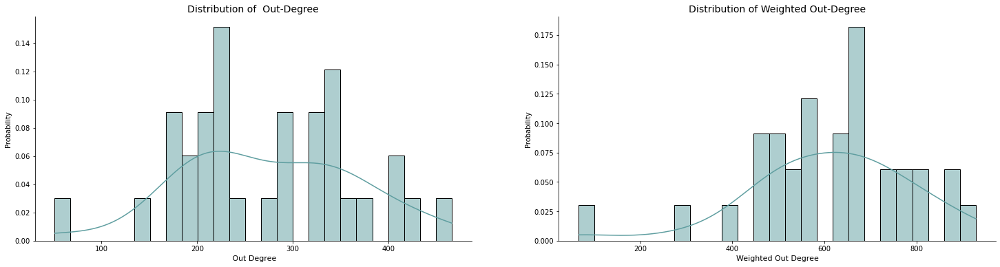

In [127]:
print("\n\nUnweighted vs Weighted Out Degree:\n\n")
fig = plt.figure(figsize=(25,6))

plt.subplot(1, 2, 1)
outdegreeHist(gMention)
plt.subplot(1, 2, 2)
outdegreeHist(gMention, weight=True)
plt.show()

The minimum weighted out degree is 66, while the unweighted is 51. The max unweighted is 466 while the weighted is 929, almost double the unweighted. The average unweighted is 275 while the weighted is 611, more than double. The distribution for unweighted is bimodal with peaks at arounf 250 anf 350, while the distribution for unweighted is approximately normal with a slight skew to the left. 

3% of the nodes (of the 33 nodes from the original network) have an weighted out degree below 200. About 6% have a value between 200-450, with about 35% between 450 and 600. About 27% have a score beyween 600 and 700, and around 27% have a score above 700.

We can plot a bar chart of the user out-degrees:

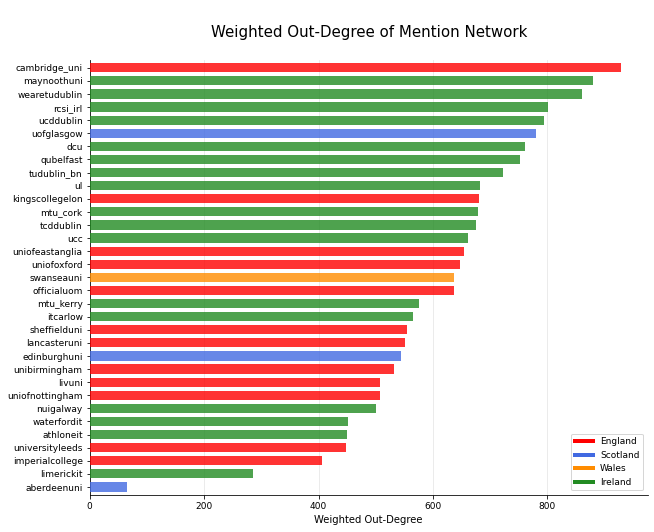

In [128]:
val=valuesForOriginalNodes(gMention.out_degree(weight="weight"))
horizontalBarChart(gMention, val, "Weighted Out-Degree", color=True, network="Mention")

Cambridge has the highest weighted out degree of 929, so Cambridge has mentioned users in tweets the most amount of times. This is followed by Maynooth, TUD, RCSI, UCD, Glasgow, DCU, Queens University and TUD Blanch, all of which have weighted out-degree values of above 700. Oxford had the second highest unweighted out-degree, but has dropped to the 16th highest weighted. So Oxford's account had mentioned a very large number of unique users, but has not mentioned them very frequently. TUC Blanchardstown had the 3rd lowest unweighted out degree, but has the 9th highest weighted, so although the account has not mentioned a very large number of different accounts, from the accounts it has mentioned it has mentioned them a very large number of times. Aberdeen and Limerick IT have the lowest unweighted and weighted out degrees.

Cambridge has the highest weighted and unweighted outdegree. We can __plot the ego network again and let the edge width and colour indicate edge weight__:

In [129]:
# get the highest weight edges of cambridge
w=weightSeriesFunc(gMention)["cambridge_uni"].sort_values(ascending=False).head(12)

# get the indexes for the node labels
labels = list(w.index)
labels.append("cambridge_uni")

# get the values for thr edge labels
weightLabels={} # dictionaty with (kingscollegelon, node) : edgeWeight
for node in w.index:
    weightLabels[("cambridge_uni", node)]=w[node]

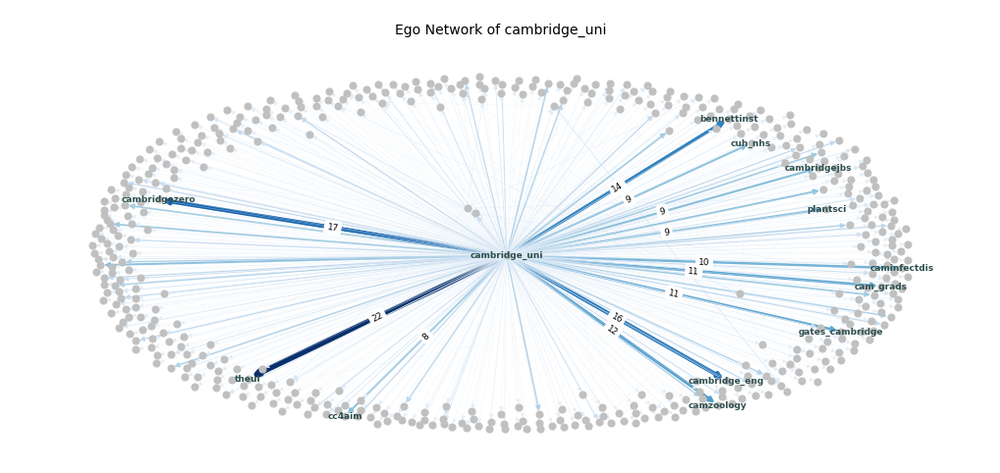

In [130]:
drawEgo(ego_cambridge_uni, k=1, labels=labels, font=9, width=18, height=8, nodesize=50, 
        labelAll=False, title="\nEgo Network of cambridge_uni", 
        edgeWeight=True, edgeLabels=True, edgeWidth=4, weightFont=9)

We can see that Cambridge has a very large number of edges, but most of the edges have a low weight. The edges with the highest weights are labelled. It has mentioned theul 22 times, followed by cambridgezero 17 times.

__Eigenvector Centrality__

Eigenvector centrality attempts to capture the qualitative aspect of the connections of a vertex. It is a basic extension of degree centrality, which defines centrality of a node as proportional to its neighbors’ importance. 

For eigenvector centrality, relative scores are assigned to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes. Mathematically, the eigenvector centrality of a node is the sum of the neighbors’ eigenvector centralities divided by λ — the largest eigenvalue of the adjacency matrix of the network. 

For directed graphs such as this, using our networkx function nx.eigenvector_centrality() calculates the "left" eigenvector centrality, which corresponds to the in-edges in the graph. 

Eigenvector Centrality Summary Statistics:
	Min:  0.0
	Max:  0.134
	Mean:  0.007
	Median:  0.003


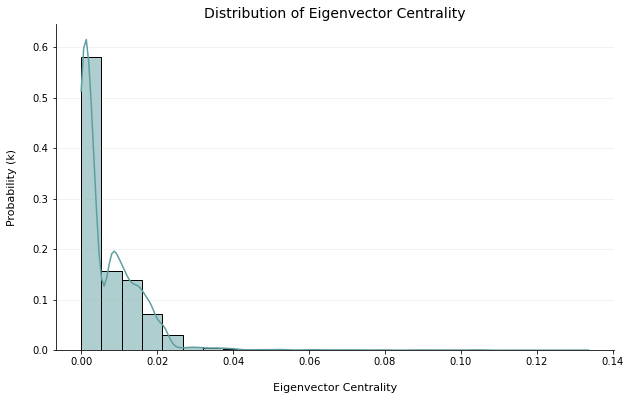

In [131]:
measureStats(nx.eigenvector_centrality(gMention), "Eigenvector Centrality", r=3)
densityPlot(nx.eigenvector_centrality(gMention), "Eigenvector Centrality", height=6, width=10, bins=25, kde=True, adjust=False)

The range of values for eigenvector centrality are from 0 to 0.134, with a mean of 0.007. There is a peak at 0 followed by a strong skew to the right. 58% of nodes have a score between 0-0.005. Around 38% have a value between 0.005-0.02. The remaining 4% have a score between 0.02-0.134. In general, the majority of values have a very low score, with a very small percentage having a higher score.

There are very few important nodes which are connected to other important nodes, i.e. nodes with high eigenvector centrality. Thus it is likely that the eigenvector centrality for a lot of nodes is based mostly off of the number of in-edges, i.e. the in-degree, so nodes with a lot of edges have a high eigenvector centrality, and nodes with fewer edges have a lower score. We can plot a __scatter plot of eigenvector centrality and in-degree__ to check this.

                 Eigenvector Centrality  In-Degree
cambridge_uni              3.691050e-02   0.000761
aberdeenuni                7.496377e-13   0.000000
edinburghuni               7.729383e-03   0.000634
imperialcollege            1.735519e-02   0.000254
kingscollegelon            2.431639e-03   0.000254
lancasteruni               1.249340e-02   0.000254
livuni                     1.601030e-03   0.000254
qubelfast                  7.364883e-02   0.000761
sheffielduni               7.496377e-13   0.000000
swanseauni                 7.496377e-13   0.000000
Correlation Coefficient:  0.612 



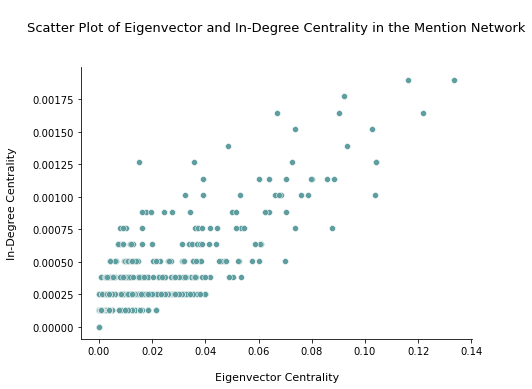

In [132]:
DF=pd.concat([
    pd.Series(nx.eigenvector_centrality(gMention)), 
    pd.Series(nx.in_degree_centrality(gMention))], axis=1).rename(columns={0:"Eigenvector Centrality", 1:"In-Degree"})

print(DF.head(10))

plt.figure(figsize=(7, 5))
sns.scatterplot(data=DF, x="Eigenvector Centrality", y="In-Degree", color="cadetblue")
plt.title(label="\nScatter Plot of Eigenvector and In-Degree Centrality in the Mention Network\n\n", fontsize=13)
plt.ylabel("In-Degree Centrality\n", fontsize=11)
plt.xlabel("\nEigenvector Centrality", fontsize=11)
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False

print("Correlation Coefficient: ", round(DF["Eigenvector Centrality"].corr(DF["In-Degree"]), 3), "\n")

plt.show()

As expected, there is a strong positive linear relationship between eigenvector centraltiy (connections to important nodes) and in-degree centrality (number of connections), with a correlation coefficient of 0.612. In many networks, nodes can have a small in-degree but have a very high eigenvector centrality if the nodes it is connected to are very important, however in this case we can see that all of the nodes with high eigenvector centrality have a high in-degree.

Again, cambridge_uni has the highest eigenvector centrality.

__Betweenness and Closeness Centrality__

Below I tried to plot a histrogram of betweenness centrality and closeness centrality, and hoped to also print the nodes with the highest of these values and construct a meaningful subgraph or ego network from these as before. However, due to the large amount of nodes in the network it takes too long to run and my laptop overheats and freezes when I try to run it so I have commented it out. 

__Betweenness Centrality__

Betweenness centrality identifies strategic linkages, “brokers” or “bridging nodes” in a network. It finds the bottleneck nodes in a network.

Nodes that occur on many shortest paths between other nodes in the network have a high betweenness centrality score.

Betweenness centrality assumes that the nodes which connect most of the other nodes in the shortest possible way are most important.

All of the nodes that are not in the original node list, and so have no edge going from them will have betweenness centrality 0 as by definition they cannot lie on any shortest paths. Of the 33 nodes which do have edges going from them, only the nodes which have an edge to another of these nodes can have a betweenness centrality score greater than 0, and this will only be the case if they are not already connected to all connections of the other node in the original list which they have an edge to.

In [133]:
# bc=valuesForOriginalNodes(nx.betweenness_centrality(gMention)
# measureStats(valuesForOriginalNodes(nx.betweenness_centrality(gMention)), "Betweenness Centrality", r=3)
# densityPlot(valuesForOriginalNodes(nx.betweenness_centrality(gMention)), "Betweenness Centrality", 
#             height=6, width=10, bins=25, kde=False, adjust=False)

__Closeness Centrality__

The closeness centrality of a node is defined as the reciprocal mean distance from the node to all other reachable nodes in the network. It shows how close the node is to the rest of the graph.

It is calculated as 1 / the average of the shortest path length from the node to every other node in the network.

Closeness centrality indicates nodes as more central if they are closer to most of the nodes in the graph. 

By default, for directed graphs networkx calculates the inward distances for the closeness centrality.

In [134]:
# measureStats(nx.closeness_centrality(gMention), "Closeness Centrality", r=3)
# densityPlot(nx.closeness_centrality(gMention), "Closeness Centrality", 
#             height=6, width=10, bins=25, kde=False, adjust=False)

## <font color='darkcyan'>Task 4: User-Hashtag Network</font>

For this user-hashtag network I will construct an undirected, weighted bipartite network. Node set 0 will contain users and node set 1 hashtags. An edge between a user and a hashtag indicates that the user used that hashtag in a tweet. The weight of the edge is the number of times the user has used the hashtag.

All of the user nodes will be nodes from the original list of 33 users, and the hashtags nodes are all of the unique hashtags used by these users in their tweets.

Node set 0 = twitter users,
Node set 1 = hashtags

In [135]:
# undirected graph
gUserHashtag=nx.Graph()

# user and hashtag sets and a counter
userSet = set()
hashtagSet = set()
hashtag_counts = Counter()

For each user:
- add the user as a node specifying set 0
- add the user to the users set
- for each hastag in the users tweets add the hashtag as a node specifying set 1
- add the hashtag to the hashtags set
- incrememnt the count in hashtag_counts counter for the user-hashtag pair.

I am using a frozen set for the pairs in the counter. However, some users use a hashtag that is the same as their username, e.g. nuigalway uses the hashtag "nuigalway", and frozen set doesn't allow duplicates, e.g. print( frozenset(["nuigalway", "nuigalway"]) ) := frozenset({"nuigalway"}). For this reason, I am adding a '#' before each hshtag, so that the screen name and hashtag will never be the same, and to easily distinguish between usernames and hashtags.
 
Hashtags are stored in the "entities" column of the tweets data frame.

In [136]:
# iterate through the tweets 
for index, row in dfTweets.iterrows():
    
    # extarct the user name of the user who tweeted the tweet
    userNode=row["screen_name"]

    # if the user is not already in the user set
    if not userNode in userSet:
        userSet.add(userNode) # add to user set
        gUserHashtag.add_node(userNode, bipartite=0 ) # add node to the graph, specifying set 0

    # for each hashtag in the tweet (stored at hashtag key in the entities column dictionary)
    for hashtag in row["entities"]["hashtags"]:
        
        # each hashtag in the hashtags list is a dictionary, with the hashtag at the "text" key
        # extract the hashtag and add a # before it
        hashtagNode='#'+hashtag["text"].lower()
        

        # if the hashtag is not already in the hashtag set
        if not hashtagNode in hashtagSet:
            hashtagSet.add(hashtagNode) # add to hashtag set
            gUserHashtag.add_node(hashtagNode, bipartite=1) # add node, specifying set 1


        # increment the count for the user and hashtag pair
        # frozen set of user and hashtag
        pair = frozenset([userNode, hashtagNode])
        hashtag_counts[pair] += 1 # incrememnt value of the pair in the hashtag_counts counter

In [137]:
# print a few of the hashtag user pairs and the count
i=0
for userhashtag in hashtag_counts:
    print(*userhashtag, " = ", hashtag_counts[userhashtag])
    
    i+=1
    if i>4: break

waterfordit #wit50  =  5
#covid19 imperialcollege  =  59
dcu #wearedcu  =  73
#lovequb qubelfast  =  265
ucddublin #newpoliticaleconomy  =  1


For each pair in the hashtag_counts counter, add an edge for the pair and set the weight equal to the counter count for the pair:

In [138]:
for pair in hashtag_counts:
    gUserHashtag.add_edge( *pair, weight=hashtag_counts[pair])
print("Edges and edge weights added.")

Edges and edge weights added.


Check that the network is bipartite:

In [139]:
print("Bipartite: ", bipartite.is_bipartite(gUserHashtag))

if bipartite.is_bipartite(gUserHashtag): print("\nBipartite User-Hashtag Successfully Network Constructed.")

Bipartite:  True

Bipartite User-Hashtag Successfully Network Constructed.


__Number of nodes and edges__

In [140]:
print("Total Number of Nodes:\t", gUserHashtag.number_of_nodes())
u, h = bipartite.sets(gUserHashtag)
print("\tNumber of Users: %d\n\tNumber of Hashtags: %d" %(len(u), len(h)))
print("\nNumber of edges:", gUserHashtag.number_of_edges())

Total Number of Nodes:	 2595
	Number of Users: 33
	Number of Hashtags: 2562

Number of edges: 3422


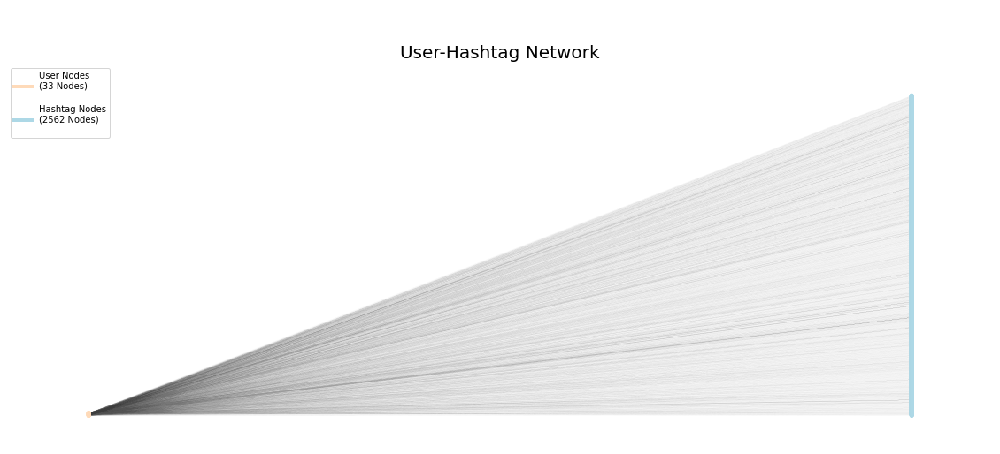

In [141]:
# manually set the node colours and positions
color_map, pos = {}, {}

for i, node in enumerate(userSet):
    pos[node] = (0, i*10)
    color_map[node] = "#fedab9"
    
for i, node in enumerate(hashtagSet):
    pos[node] = (0.5, 15 + i*15)
    color_map[node] = "lightblue"
    
colors = [color_map[node] for node in gUserHashtag.nodes()]
   

plt.figure(figsize=(20,8))

plt.margins(0.1, 0.1)

# plt.text(10, 10, s="User Nodes")

nx.draw_networkx(gUserHashtag, pos=pos, with_labels=False, 
        node_size = 15,
        node_color = colors,
        width=0.01)

# construct legend lines
legendLines=[]
legendLines.append(Line2D([0], [0], color="#fedab9", lw=4))
legendLines.append(Line2D([0], [0], color="lightblue", lw=4))
plt.legend(legendLines, ["User Nodes\n(%d Nodes)\n"%len(userSet), "Hashtag Nodes\n(%d Nodes)\n"%len(hashtagSet)])

plt.title(label="\n\nUser-Hashtag Network", fontdict={'fontsize':20})

plt.axis("off");

Above is a visualisation of the user-hashtag network. We can see that there are vastly more hashtag nodes than user nodes. It is difficult to extract any useful information out of this due to the large number of nodes, so I will plot smaller more meaningful subgraphs throughout my exploration of the network.

__Connected__

We can check if the network is connected. It is connected if there is a path between every pair of nodes in the network.

In [142]:
print("Number of connected components: ", nx.number_connected_components(gUserHashtag))
print("Connected:", nx.is_connected(gUserHashtag))

Number of connected components:  1
Connected: True


The network is connected, so every node is reachable from every other node.

__Network Density__

To characterise the network structure we can look at the network density. Network density refers to the portion of potential edges between nodes in a network that exist as actual edges.

Density is calculated numerically as the ratio of existing edges over the total number of potential edges between all pairs of nodes.


Density 

= Number of Edges / Number of Potential Edges 

= Numberber of Edges / Number of Users * Number of Hashtags

In [143]:
density=gUserHashtag.number_of_edges() / (len(u) * len(h))
print("Density\n= Number of Edges / Number of Potential Edges \n= Number of Edges / Number of Users * Number of Hashtags")
print("= %d / (%d * %d)" %(gUserHashtag.number_of_edges(), len(u), len(h)))
print("= %.4f, %.2f%%" %(density, density*100))

Density
= Number of Edges / Number of Potential Edges 
= Number of Edges / Number of Users * Number of Hashtags
= 3422 / (33 * 2562)
= 0.0405, 4.05%


Only 4.05% of potential edges in the network are actual edges, so the network is quite sparse. The density is much lower than that of the follower network which was 43%, but is significantly higher than the reply and mention networks which had densities of 0.061% and 0.015% respectively.

__Network Diameter__

A network’s diameter is the maximum distance between all pairs of its nodes - i.e. the longest shortest path in the entire network. The diameter tells us how quickly information can be transmitted across the entire network. The higher the diameter, the less linked a network tends to be.

The diameter of the network will be infinite if the network is not fully connected. We know from above that our network is connected.

In [144]:
print("User-hashtag Network Diameter: ", nx.diameter(gUserHashtag))

User-hashtag Network Diameter:  6


The diameter is 6, so each node is a maximum of 6 hops from every other node in the network. 

In comparison, the diameter was 4 for the follower network, and infinite for the mention and reply networks as they were not strongly connected. We can print one such path:

In [145]:
path=longestShortestPath(gUserHashtag)

Longest Shortest Path =  ['#wit50', 'waterfordit', '#innovation', 'wearetudublin', '#covid19', 'swanseauni', '#proud']

Path Length == Diameter: True


__Clustering Coefficient__

Clustering coefficient indicates the level of concentration of edges in the neighbourhood of a node.
It is the fraction of pairs of its neighbours that have edges between one another - i.e. how many closed triads around this node.

For this bipartite network we know that the clustering coefficient will be 0, because each node in one node set will only be connected to nodes in the other node set, so the nodes that a given node is connected to can never be connected to eachother. Thus there are no closed triads in the network.

In [146]:
print("Average Clustering Coefficient: %.4f " % nx.average_clustering(gUserHashtag))

Average Clustering Coefficient: 0.0000 


__Degree__


Degree and degree centrality can help to identify influential nodes as nodes with a high degree are directly connected to a large number of other nodes.

First we can calculate the degree centrality for the user nodes, which for each node is the number of edges (the degree) divided by the total number of hashtag nodes. This tells us the fraction of hashtags in the network that the user has tweeted.

We can plot a histogram to investigate the distribution of the __degrees for the user nodes__:

In [147]:
# returns the values for a given centrality measure for just the user or hashtag set
# setName = userSet or hashtagSet
# returns as a dictionary, series, or list of values depending on arguments

def valuesForSet(setName, measure, series=False, values=False):
    measureDict={}

    for key in setName: # for each of the 33 nodes
        measureDict[key]=measure[key] # add (node:measure) to dictionary  
        
    if series:
        return pd.Series(measureDict) # dict -> series
    
    elif values:
        return list(measureDict.values()) # dict values
    
    else:
        return measureDict # dict

Degree Centrality Summary Statistics:
	Min:  0.007
	Max:  0.146
	Mean:  0.04
	Median:  0.036


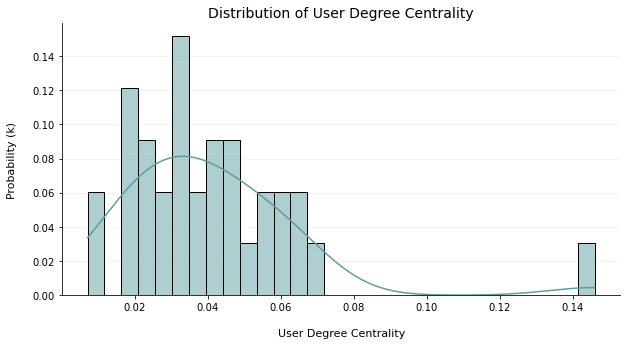

In [148]:
# get the degree centrality values for the user set using the above function and specifyinf userSet
userDegreeC=valuesForSet(userSet, bipartite.degree_centrality(gUserHashtag, userSet))

# plot 
measureStats(userDegreeC, "Degree Centrality", r=3)
densityPlot(userDegreeC, "User Degree Centrality", bins=30, height=5, width=10, adjust=False, kde=True)

The distribution of degrees for the user nodes is skewed to the right. The range of degree centrality scores is 0.006-0.146, i.e. each node has used between 0.6% and 14.6% of the hashtags in their tweets. The mean degree centrality is 3.6%.

18% of users have a degree centrality score of less than 2%. 37% have a value between 2% and 4%. About 33% have a value between 4% and 6.2%. 9% have a value between 6.2%-7%, with the remaning 3% having a score above 14%.

We can check the degrees of the individual user nodes by plotting a bar chart:

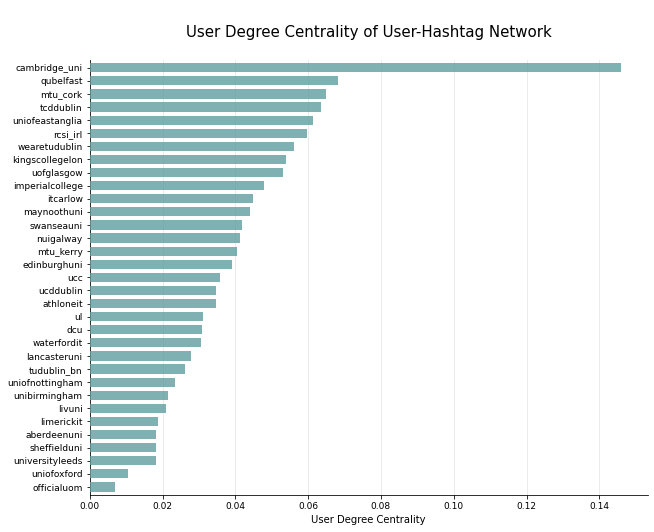

In [149]:
horizontalBarChart(gUserHashtag, userDegreeC, "User Degree Centrality", color=False, network="User-Hashtag")

Cambridge has used the most unique hashtags in the network, with a score of 14.6%. This is folowed by Queen's University, MTU Cork and TCD with just over 6%. 

Manchester Univeristy has used the least number of unique hashtags, with less than 1% followed by Oxford with about 1.8%. Although Manchester has the lowest degree for hashtags, it had a high out-degree for mentions and replies, so it is clearly quite an active account, but does not tend to use very many different hashtags.


We can also look at the __weighted degree for the users__, which tells us the total number of hashtags used:



Unweighted vs Weighted Degree for the User Nodes:


Unweighted Degree Summary Statistics:
	Min:  18
	Max:  374
	Mean:  103.697
	Median:  92.0
Weighted Degree Summary Statistics:
	Min:  27
	Max:  773
	Mean:  264.939
	Median:  218.0


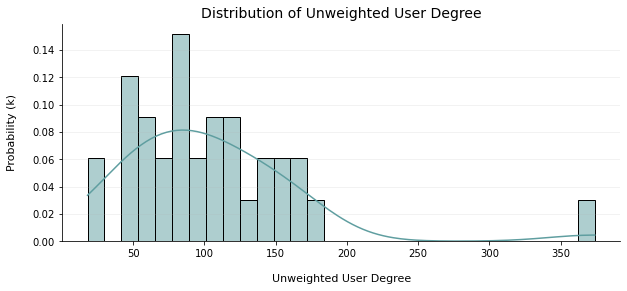

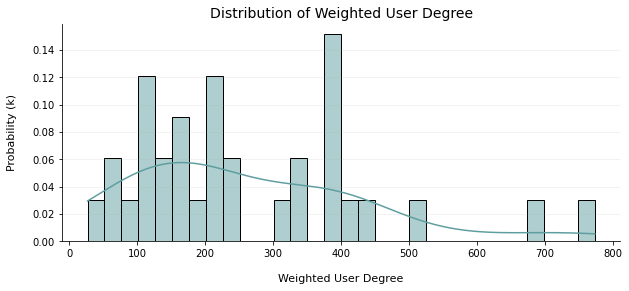

In [150]:
print("\n\nUnweighted vs Weighted Degree for the User Nodes:\n\n")
measureStats(dict(gUserHashtag.degree(userSet)), "Unweighted Degree", r=3)
measureStats(dict(gUserHashtag.degree(userSet, weight="weight")), "Weighted Degree", r=3)

densityPlot(dict(gUserHashtag.degree(userSet)), "Unweighted User Degree", bins=30, height=4, width=10, adjust=False, kde=True)
densityPlot(dict(gUserHashtag.degree(userSet, weight="weight")), "Weighted User Degree", bins=30, height=4, width=10, adjust=False, kde=True)

plt.show()

The distribution for the weighted degree is also skewed to the right, but has a sligtly flatter curve. The range of weighted degrees is from 27 to 773, with a mean 265, so on average each user has used 265 hashtags in total, with an average of 104 unique hashtags (unweighted degree). 60% of users have a weighted degree below 300. 24% have a value between 300 and 400, 9% between 400 and 600, and 3% between 600 and 700, and 700 and 800.

Again we can plot a bar chart of the user's weighted degrees:

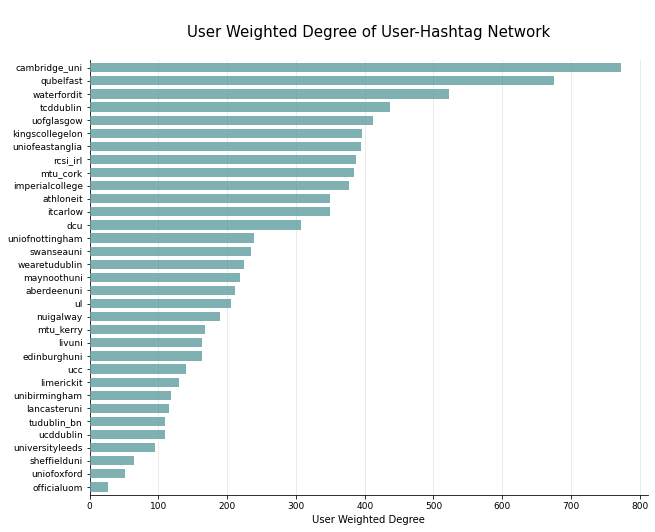

In [151]:
horizontalBarChart(gUserHashtag, dict(gUserHashtag.degree(userSet, weight="weight")), "User Weighted Degree", color=False, network="User-Hashtag")

Cambridge had the highest weighted and unweighted degree, followed by Queen's University for both. Waterford IT has the next highest weighted degree, but had the 13th lowest unweighted, so the account uses hashtags fequently but does not use a very large amount of different hashtags. Manchester University followed by Oxford had the lowest weighted and unweighted degrees, so these accounts do not use hashtags very frequently.

We can construct an ego network for Cambridge, the node with the highest weighted and unweighted degree, i.e. the account that uses both the most hashtags in total and the most unique hashtags.

In [152]:
# ego network for cambridge_uni
ego_CambridgeUserHashtag = nx.ego_graph(gUserHashtag, "cambridge_uni")

In [153]:
# series of edge weights for the ego network, sort descending, get the 8 highest weights

w=weightSeriesFunc(gUserHashtag)["cambridge_uni"].sort_values(ascending=False).head(8)

# get the indexes for the node labels
labels = list(w.index)
labels.append("cambridge_uni")

# get the weight values for the edge labels
weightLabels={} # dictionaty with (kingscollegelon, node) : edgeWeight
for node in w.index:
    weightLabels[("cambridge_uni", node)]=w[node]

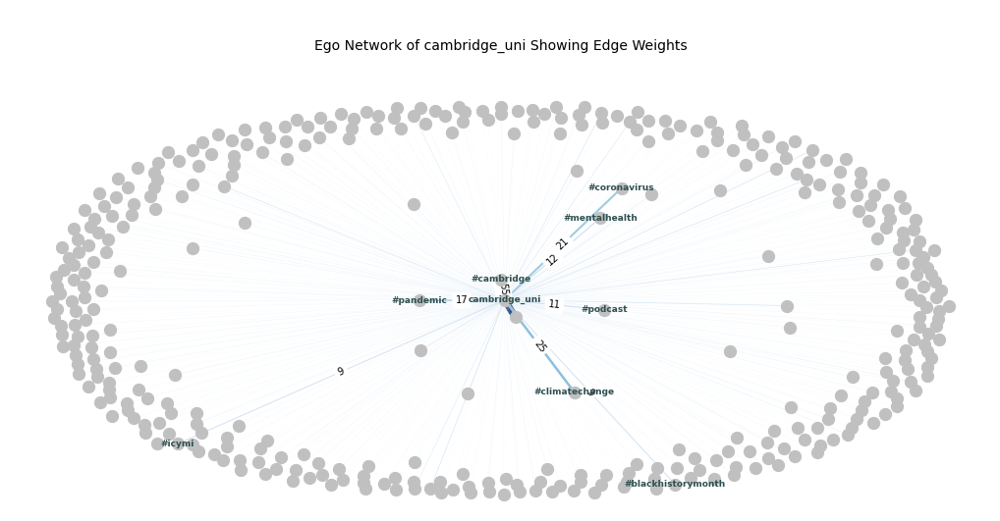

In [154]:
# plot the ego network, where edge colour and width => edge weight
drawEgo(ego_CambridgeUserHashtag, k=1, labels=labels, font=9, width=18, height=8, seed=1000, scale=3,
        labelAll=False, title="\n\nEgo Network of cambridge_uni Showing Edge Weights\n\n", 
        edgeWeight=True, edgeWidth=10, weightFont=10)

Cambridge had the highest weighted and unweighted degree. We can see that it has edges to a very large number of nodes, however most of these edges have a very low weight. It has a weight of 55 for the hashtag #cambridge, followed by a weight of 25 for #climatechange and 21 for #coronavirus, but the majority of edges have a very low weight. 

Next we can look at the __degree distribution for the hashtag set__:

Unweighted Degree Summary Statistics:
	Min:  1
	Max:  31
	Mean:  1.336
	Median:  1.0
Hashtag Degree Centrality Summary Statistics:
	Min:  0.03
	Max:  0.939
	Mean:  0.04
	Median:  0.03


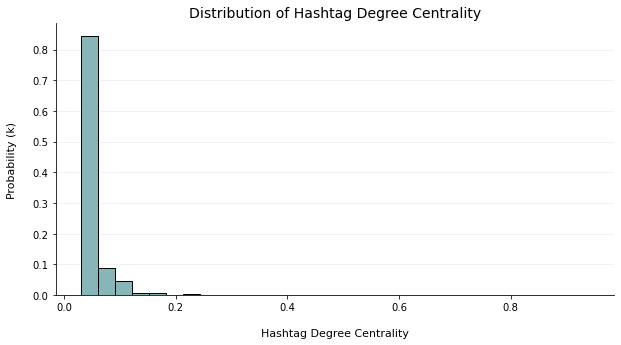

In [155]:
# series of degrees for the hashtag set
hashtagDegreeC=valuesForSet(hashtagSet, bipartite.degree_centrality(gUserHashtag, hashtagSet))

measureStats(dict(gUserHashtag.degree(hashtagSet)), "Unweighted Degree", r=3)

measureStats(hashtagDegreeC, "Hashtag Degree Centrality", r=3)
densityPlot(hashtagDegreeC, "Hashtag Degree Centrality", bins=30, height=5, width=10, adjust=False, kde=False)

The distribution for the unweighted degree centrality for the hashtage set is strongly skewed to the right with a very high peak at the minimum value. The range of degree centrality score is from 3% to 94%. The mean is 4%, so on average each hashtage has been tweeted by 4% of the users, or about 1.3 users. The majority of hashtag nodes have a very low degree, with a very small number having very high degrees. Around 85% have a degree below 3.3%. About 14% have a value between 3% and 20%, with the remaining 1% having a value between 20% and 91%.

We can print the 10 hashtags used by the largest number of users:

In [156]:
d=pd.Series(dict(gUserHashtag.degree(hashtagSet)), name="Degree")

dc=pd.Series(hashtagDegreeC, name="Degree Centrality").round(decimals=2)

print(pd.concat([d, dc], axis=1).sort_values(by="Degree", ascending=False).head(10))

                       Degree  Degree Centrality
#covid19                   31               0.94
#covid                     17               0.52
#coronavirus               12               0.36
#research                  12               0.36
#blackhistorymonth         12               0.36
#worldmentalhealthday      11               0.33
#engineering               10               0.30
#classof2020               10               0.30
#mentalhealth              10               0.30
#staysafe                  10               0.30


covid19 has the highest degree of 94%, it has been tweeted by 31 of the 33 users, followed by covid with 52%. blackhistorymonth, coronavirus and research have degree centralities of 36%, or have been tweeted by 12 user nodes.

We can also caluclate the __weighted degree for the hashtag nodes__:



Unweighted vs Weighted Degree for Hashtag Nodes


Unweighted Degree Summary Statistics:
	Min:  1
	Max:  31
	Mean:  1.336
	Median:  1.0
Weighted Degree Summary Statistics:
	Min:  1
	Max:  472
	Mean:  3.413
	Median:  1.0


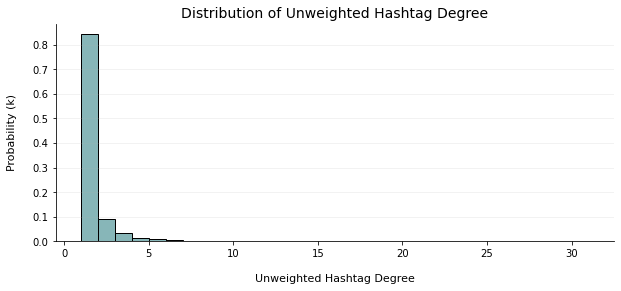

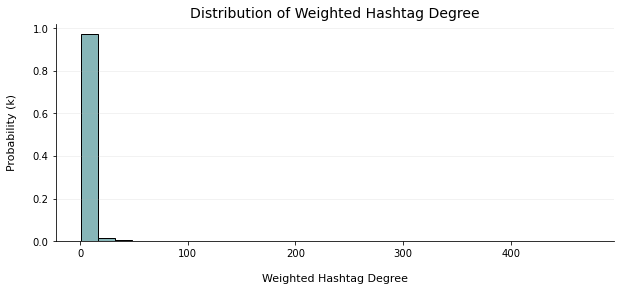

In [157]:
print("\n\nUnweighted vs Weighted Degree for Hashtag Nodes\n\n")
measureStats(dict(gUserHashtag.degree(hashtagSet)), "Unweighted Degree", r=3)
measureStats(dict(gUserHashtag.degree(hashtagSet, weight="weight")), "Weighted Degree", r=3)

densityPlot(dict(gUserHashtag.degree(hashtagSet)), 
            "Unweighted Hashtag Degree", bins=30, height=4, width=10, adjust=False, kde=False)
densityPlot(dict(gUserHashtag.degree(hashtagSet, weight="weight")), 
            "Weighted Hashtag Degree", bins=30, height=4, width=10, adjust=False, kde=False)
plt.show()

Although the values are much higher for the weighted degree we can see a very similar distribution for weighted and unweighted hashtag degrees. The values range from 1 to 472, with an average of 3.413, in comparison to the unweighted which had an average of 1.336. So on average each hashtag has been used a total of 3.4 times. About 99% of the hashtags have been used less than 50 times, with just 1% being used between 50 and 472 times.

We can check which hashtag nodes have the highest weighted degrees:

In [158]:
wd=pd.Series(dict(gUserHashtag.degree(hashtagSet, weight="weight")), name="Weighted Degree")
d=pd.Series(dict(gUserHashtag.degree(hashtagSet)), name="Unweighted Degree")

print(pd.concat([wd, d], axis=1).sort_values(by="Weighted Degree", ascending=False).head(5))

             Weighted Degree  Unweighted Degree
#covid19                 472                 31
#lovequb                 265                  1
#studyatwit              167                  1
#weareuon                143                  1
#cao2020                 111                  5


covid19 has the highest weighted and unweighted degree, with a weighted degree of 472, followed by lovequb with 265. We can see that this hashtag is used by only one user (likely Queen's University Belfast) but has been used by them 265 times. Similarly the hashtag weareuon has been used 167 times, but all by the one user, presumably the University of Nottingham.

We can construct an __ego network for the hashtag covid19__, which has the highest weighted and unweighted degree, where nodes are covid19 and the user nodes which have tweeted covid19. The edge width and colour indicates the edge weight.

In [159]:
# construct ego network for #covid19
ego_covid19 = nx.ego_graph(gUserHashtag, "#covid19")

In [160]:
labels=[] # list of users which have used the hashtag
notUsedHashtag=[] # list of users which have not used the hashtag
weightLabels={} # dictionary of edge weights for labels

for node in nodeLabels:
    if gUserHashtag.has_edge("#covid19", node):
        labels.append(node)
        weightLabels[("#covid19", node)]=gUserHashtag.edges[("#covid19", node)]["weight"]
    else: notUsedHashtag.append(node)
        
labels.append("#covid19")


#covid19 used by all users except:  ['aberdeenuni', 'waterfordit']


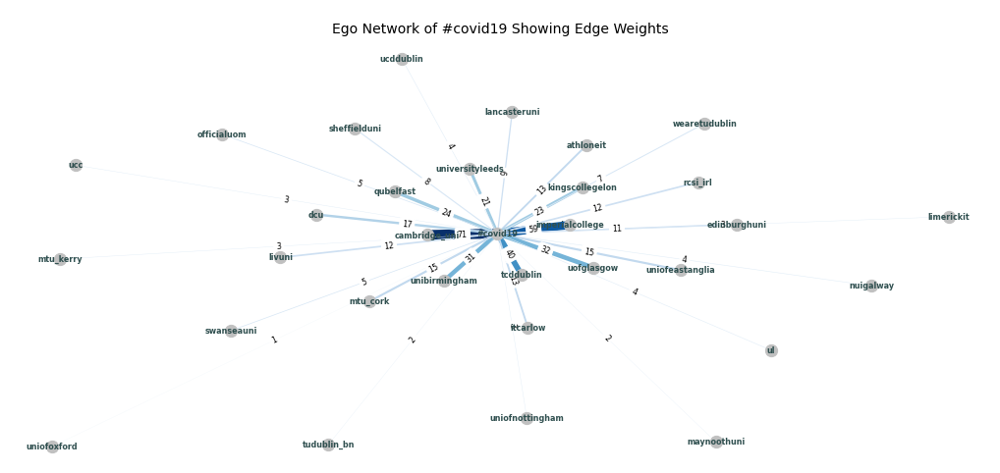

In [161]:
print("\n#covid19 used by all users except: ", notUsedHashtag)

drawEgo(ego_covid19, k=3, labels=labels, font=8, width=18, height=8,scale=2,
        title="\nEgo Network of #covid19 Showing Edge Weights", 
        edgeWeight=True, edgeWidth=7, weightFont=8)

covid19 has been used by Cambridge 71 times, TCD 40 times, Imperial College 59 times. It has been used by 31 of the 33, all users except Aberdeen and Waterford IT.

__Betweenness Centrality__

The previous centrality measures do not capture the idea of brokerage. Betweenness centrality identifies strategic linkages, “brokers” or “bridging nodes” in a network. It finds the bottleneck nodes in a network.

Nodes that occur on many shortest paths between other nodes in the network have a high betweenness centrality score.

Betweenness centrality assumes that the nodes which connect most of the other nodes in the shortest possible way are most important.

Many of the other centrality metrics, such as degree centrality, are local and depend only on the neighbourhood of a node, but we cannot say much about the opportunities for global outreach from these metrics. Betweenness centrality is a global metric. If the betweenness centrality of a node is high, the node is potentially a crucial go-between and has a brokerage capability. The removal of such a node would disrupt communications, lower closeness centralities, and possibly split the network into disconnected components. Thus, it is a very important centrality metric.

We can begin by looking at the __distribution of betweenness centrality for the user nodes__:

User Betweenness Centrality Summary Statistics:
	Min:  0.009
	Max:  0.226
	Mean:  0.058
	Median:  0.051


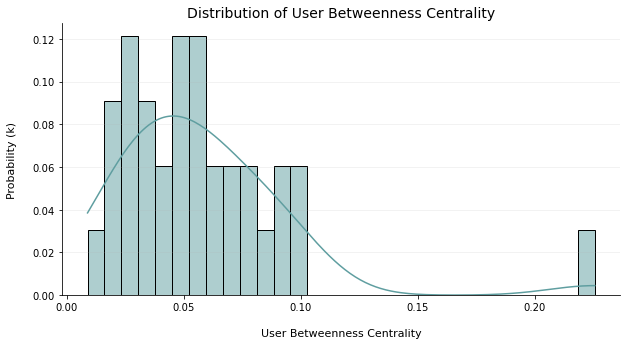

In [162]:
# get betweenness centrality scores for user nodes
UserBetweenness=valuesForSet(userSet, bipartite.betweenness_centrality(gUserHashtag, userSet))

measureStats(UserBetweenness, "User Betweenness Centrality", r=3)
densityPlot(UserBetweenness, "User Betweenness Centrality", bins=30, height=5, width=10, adjust=False, kde=True)

The range of betweenness centrality values is between 0.009 and 0.226. The distribution is approximately bell shaped between 0-0.1 with a skew to the right and a small peak at 0.025.

About 51% of nodes have a betweenness centrality scoree below 0.05, and about 45% have a value between 0.05 and 0.1. 3% have a score above 0.2.

We can plot a bar chart of the betweenness centrality scores for the user nodes:

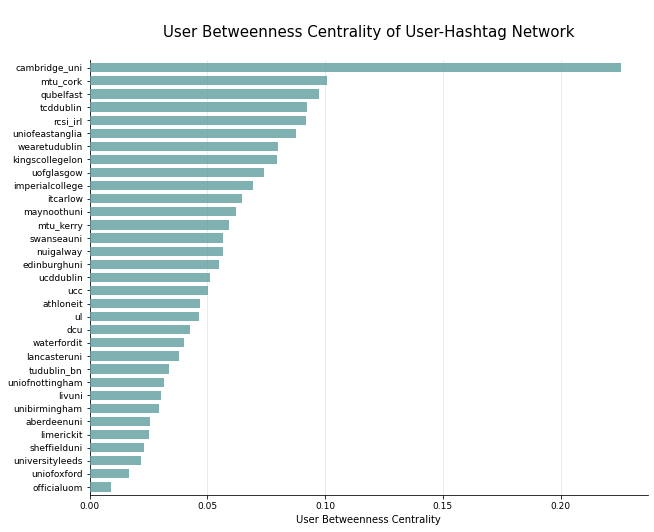

In [163]:
horizontalBarChart(gUserHashtag, UserBetweenness, "User Betweenness Centrality", color=False, network="User-Hashtag")

Cambridge has the highest betweenness centrality score, so it occurs on a large number of shortest paths. This is followed by MTU Cork and Queen's University Belfast. The ordering is very similar to that of degree centrality. We can plot a __scatter plot of degree and betweenness centrality__ for the users and I expect a strong positive correlation:

                 Degree Centrality  Betweenness Centrality
cambridge_uni                 0.15                    0.23
qubelfast                     0.07                    0.10
mtu_cork                      0.06                    0.10
rcsi_irl                      0.06                    0.09
uniofeastanglia               0.06                    0.09


Correlation Coefficient:  0.991 



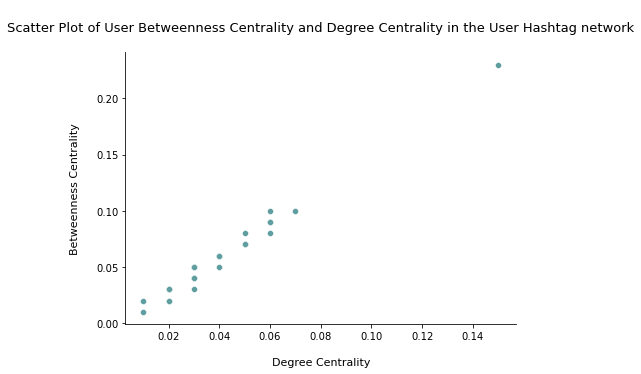

In [164]:
# function to plot a scatter plot of 2 centrality measures
def scatter(measure1, measure2, setName="", reg=False, label1="Degree Centrality",
            label2="Betweenness Centrality", networkName="User Hashtag", title="", printSeries=True):

    # construct dataframe of the two centrality measures
    DF=pd.concat([
        pd.Series(measure1).round(decimals=2), 
        pd.Series(measure2).round(decimals=2)], axis=1).rename(columns={0:label1, 1:label2})

    if printSeries: print(DF.sort_values(by=label2, ascending=False).head(5))

    plt.figure(figsize=(7, 5))
    
    # plot scatter plot
    
    if reg:
           sns.regplot(data=DF, x=label1, y=label2, color="cadetblue")
    else:
        sns.scatterplot(data=DF, x=label1, y=label2, color="cadetblue")
        
    # add title
    
    if title != "":
         plt.title(label=title, fontsize=13)
    else: 
        plt.title(label=("\nScatter Plot of %s %s and %s in the %s network\n" %(setName,label2,label1,networkName)), fontsize=13)
    
    plt.ylabel(label2+"\n", fontsize=11)
    plt.xlabel("\n"+label1, fontsize=11)
    mpl.rcParams['axes.spines.right'] = False
    mpl.rcParams['axes.spines.top'] = False

    print("\n\nCorrelation Coefficient: ", round(DF[label1].corr(DF[label2]), 3), "\n")

    plt.show()

scatter(userDegreeC, UserBetweenness, "User")

The nodes with the largest number of connections tend to occur on many shortest paths, wherease the nodes with less edges occur on less shortest paths. Thus there is a strong positive linear relationship between betweenness and degree centrality for the users in the user-hashtag  network. The correlation coefficient is 0.991 which is very close to 1 indicating a very strong positive relationship.

Next we can look at the distribution of the __betweenness centrality values for the hashtag set__:

Hashtag Betweenness Centrality Summary Statistics:
	Min:  0.0
	Max:  0.206
	Mean:  0.0
	Median:  0.0


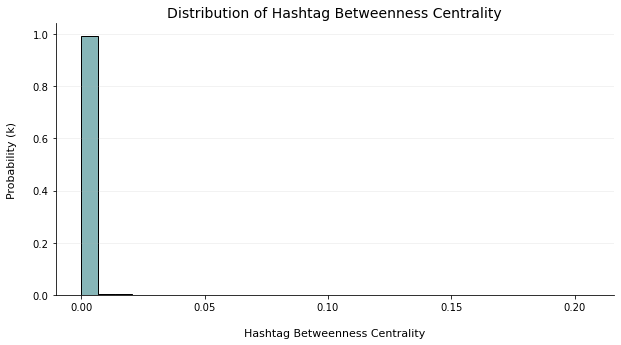

In [165]:
# betweenness scores for hashtag nodes
hashtagBetweenness=valuesForSet(hashtagSet, bipartite.betweenness_centrality(gUserHashtag, hashtagSet))

measureStats(hashtagBetweenness, "Hashtag Betweenness Centrality", r=3)
densityPlot(hashtagBetweenness, "Hashtag Betweenness Centrality", bins=30, height=5, width=10, adjust=False, kde=False)

The distribution of betweenness centrality scores for the hashtag nodes is strongly skewed to the right. The values range from 0 to 0.206, with a mean and median of 0. About 99% of the values are between about 0 and 0.0125. We can check which hashtags have the higher values:

In [166]:
print("10 highest hashtag betweenness values:\n")
print(pd.Series(hashtagBetweenness).round(decimals=2).sort_values(ascending=False).head(10))

count=pd.Series(hashtagBetweenness).value_counts().iloc[0]
print("\nNumber of hashtags with betweenness 0: %d, %d%%" %(count, count*100/len(hashtagSet)))

10 highest hashtag betweenness values:

#covid19              0.21
#covid                0.05
#research             0.03
#coronavirus          0.03
#engineering          0.02
#mentalhealth         0.02
#womeninstem          0.02
#staysafe             0.02
#innovation           0.02
#blackhistorymonth    0.02
dtype: float64

Number of hashtags with betweenness 0: 2160, 84%


covid19 has the highest betweenness centrality value of 0.21, which indicates that it occurs on many shortest paths in the network, acting as a broker. This is followed by covid with a significantly lower score of 0.05, and research and coronavirus with scores of 0.03. 84% of nodes, or 2160 nodes have a score of 0. 


The ordering is again quite similar to that of the hashtag degree centrality, as it seems that the nodes which had the largest number of edges had the highest betweenness centralities. We can check this with a scatter plot:

               Degree Centrality  Betweenness Centrality
#covid19                    0.94                    0.21
#covid                      0.52                    0.05
#coronavirus                0.36                    0.03
#research                   0.36                    0.03
#mentalhealth               0.30                    0.02


Correlation Coefficient:  0.703 



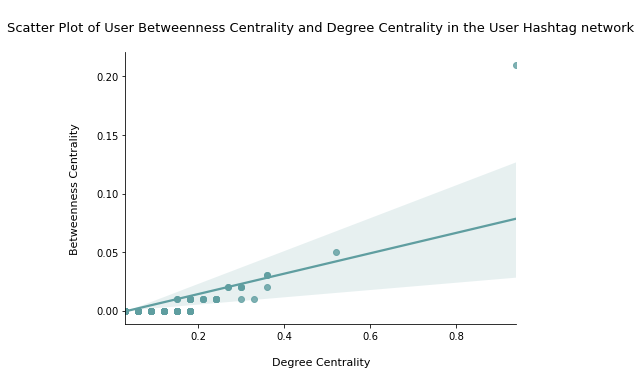

In [167]:
scatter(hashtagDegreeC, hashtagBetweenness, "User", reg=True)

There is a strong positive correlation betweenn hashtag betweenness and degree, however it is not as strong as the user hashtag betweenness and degree correlation. In general, the hashtag nodes with high degree have a higher betweenness centrality in the user-hashtag network, i.e. appear on more shortest paths.

__Closeness Centrality__

The closeness centrality of a node is defined as the reciprocal mean distance from the node to all other reachable nodes in the network. It shows how close the node is to the rest of the graph. This is again a global metric as it does not depend only on the nodes neighbourhood.

It is calculated as 1 / the average of the shortest path length from the node to every other node in the network.

Closeness centrality indicates nodes as more central if they are closer to most of the nodes in the graph. This strongly corresponds to visual centrality — a node that would appear toward the center of a graph when we draw it usually has a high closeness centrality. Closeness can be regarded as a measure of how fast it will take to spread information to all other nodes. If a node has high closeness centrality, it is in a position to spread information quickly. These nodes can be important influencers of the network. It highlights nodes that may reach any other nodes within a few hops and nodes that may be very distant in the graph.

We can first calcualte the __closeness centrality scores for the user nodes__, which calculates the mean distance to all hashtag nodes:

User Closeness Centrality Summary Statistics:
	Min:  0.308
	Max:  0.375
	Mean:  0.345
	Median:  0.346


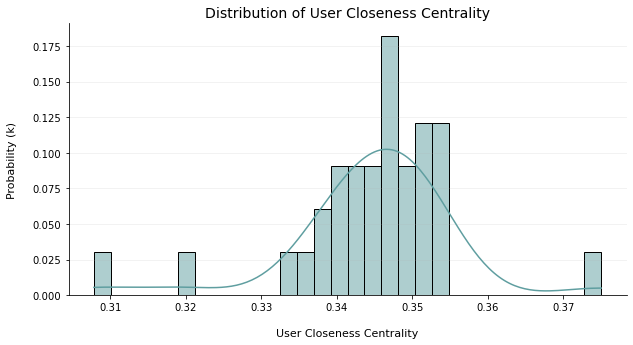

In [168]:
UserCloseness=valuesForSet(userSet, bipartite.closeness_centrality(gUserHashtag, userSet))

measureStats(UserCloseness, "User Closeness Centrality", r=3)
densityPlot(UserCloseness, "User Closeness Centrality", bins=30, height=5, width=10, adjust=False, kde=True)

The distribution of the closeness centrality scores for the user nodes is approximately normal with long left and right tails, and small peaks at very low and high values. The closeness centrality scores range from 0.308 to 0.375 with a mean of 0.345. So on average each node is 1/0.345 = 2.9 hops from every other node.

0.026% of nodes have a value below 0.31, and another 0.026% have a value between about 0.319-0.321. About 37% of nodes have a score between 0.33 and 0.347. There is a peak at about 3.47-3.48 with 18% of nodes. 32% have a score between 0.347 and 0.355. 0.0206 have a high score of above 0.37.

We can plot a bar chart of the closeness centrality scores for the user nodes:

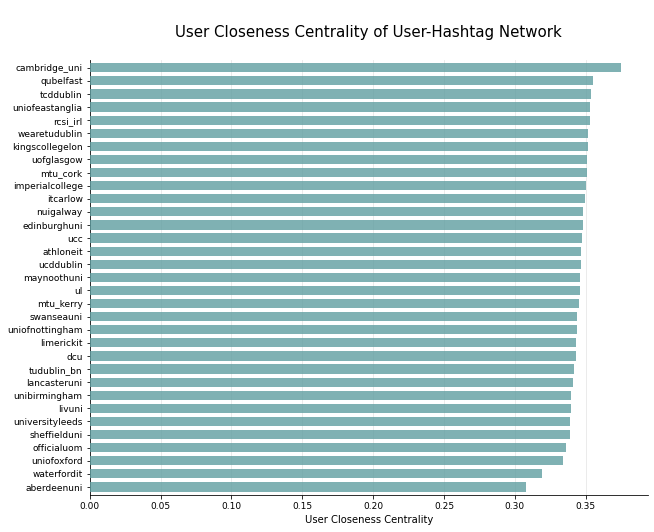

In [169]:
horizontalBarChart(gUserHashtag, UserCloseness, "User Closeness Centrality", color=False, network="User-Hashtag")

In comparison to the other centrality measures, the range of values is very small, so all nodes have a similar value, i.e. nodes are a similar average distance to all other nodes in the network. Once again, Cambridge has the highest score, i.e. the shortest average distance, followed by Queen's University and TCD. Aberdeen has the lowest score, followed by Waterford.

Next we can calculate the __closeness centrality scores for the hashtag nodes__, i.e. the mean distances to all user nodes.

Hashtag Closeness Centrality Summary Statistics:
	Min:  0.463
	Max:  0.97
	Mean:  0.516
	Median:  0.512


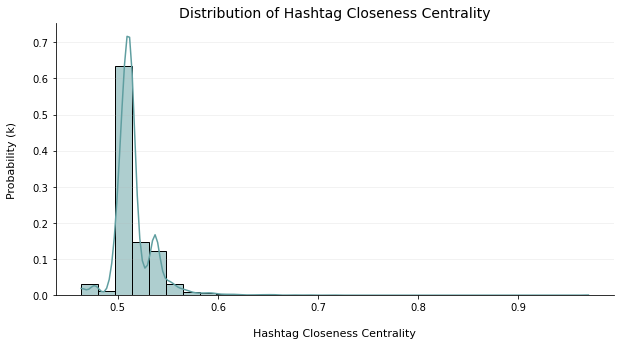

In [170]:
HashtagCloseness=valuesForSet(hashtagSet, bipartite.closeness_centrality(gUserHashtag, hashtagSet))

measureStats(HashtagCloseness, "Hashtag Closeness Centrality", r=3)
densityPlot(HashtagCloseness, "Hashtag Closeness Centrality", bins=30, height=5, width=10, adjust=False, kde=True)

The distribution for the hashtag closeness centrality is different to that of the user set, with a much larger range of values. For most of the values the distribution looks normally distributed, however there is a very strong right skew. A very small percentage of hashtag nodes are a much smaller average distance. The range of closeness centrality scores is from 0.463 to 0.97, i.e. an average of 2.16-1.03 hops, and the average is 0.516 or 1.9 hops. 

Around 5% of nodes have a score below 0.5. About 63% have a score between 0.5-0.52. Almost 33% have a score between 0.52-0.6, leaving less than 1% with a score above this.

We can check which hashtags are the closest to all other nodes on average:

In [171]:
print("5 highest hashtag closeness centrality scores:\n")
print(pd.Series(HashtagCloseness).round(decimals=2).sort_values(ascending=False).head(5))

5 highest hashtag closeness centrality scores:

#covid19              0.97
#covid                0.71
#research             0.69
#coronavirus          0.68
#blackhistorymonth    0.66
dtype: float64


We can see that covid has the shortest mean distance to the all of the user nodes. We saw previously that covid19 is directly connected (distance of 1) to 31 of the 33 user nodes so this is unsurprising. This is followed by covid with an average hop of 1.4, and research with an average of 1.45 hops.

We have characteristed the structure and connectivity of the user-hashtag bipartite network, as well as identifying important nodes using various centrality measures. Next we can look in further detail at the hashtag nodes by constructing a hashtag co-occurrence network. This will allow us to investigate the relationships between the hashtag nodes, for example which nodes appear together most frequently, as opposed to comparing the hashtags and users as in this user-hashtag network.

## <font color='darkcyan'>Task 5: Hashtag Co-Occurrence Network</font>

The hashtag co-occurrence network is a weighted, undirected network in which each node will represent a hashtag, and the weight on each edge will indicate the number of tweets that the two hashtags appeared together in.

To construct the hashtag co-occurrence network we can perform a weighted projection of the bipartite user-hashtag from Task 4.

In [172]:
# weighted projection of hashtag set from user-hashtag bipartite network
gHashtagCoOccurrence = bipartite.weighted_projected_graph(gUserHashtag, hashtagSet)

__Number of nodes and edges__

In [173]:
print("Number of nodes == Number of Hashtags: ", len(hashtagSet)==gHashtagCoOccurrence.number_of_nodes())
print("\nNumber of Nodes:\t", gHashtagCoOccurrence.number_of_nodes())
print("Number of edges:\t", gHashtagCoOccurrence.number_of_edges())

Number of nodes == Number of Hashtags:  True

Number of Nodes:	 2562
Number of edges:	 235908


__Connected__

We can check if the network is connected. It is connected if there is a path between every pair of nodes in the network.

In [174]:
print("Number of connected components: ", nx.number_connected_components(gHashtagCoOccurrence))
print("Connected:", nx.is_connected(gHashtagCoOccurrence))

Number of connected components:  1
Connected: True


The network is connected, so every node is reachable from every other node.

__Network Density__

To characterise the network structure we can look at the network density. Network density refers to the portion of potential edges between nodes in a network that exist as actual edges.

Density is calculated numerically as the ratio of existing edges over the total number of potential edges between all pairs of nodes.

In [175]:
print("Density of Hashtag Co-Occurrence Network: %.2f" %nx.density(gHashtagCoOccurrence))

Density of Hashtag Co-Occurrence Network: 0.07


7% of potential edges are actual edges. This is significantly lower than the follower network which had a density of 43%, but higher than the user-hashtag, reply and mention networks which had 4.05%, 0.061% and 0.015% respectively.

__Network Diameter__

A network’s diameter is the maximum distance between all pairs of its nodes - i.e. the longest shortest path in the entire network. The diameter tells us how quickly information can be transmitted across the entire network. The higher the diameter, the less linked a network tends to be.

The diameter of the network will be infinite if the network is not fully connected. We know from above that our network is connected.

In [176]:
print("Hashtag Co-Occurrence Network Diameter: ", nx.diameter(gHashtagCoOccurrence))

Hashtag Co-Occurrence Network Diameter:  3


The diameter is 3, so each node is a maximum of 3 hops from every other node in the network. 

In comparison, the diameter was 4 for the follower network, 6 for the user-hashtag network, and infinite for the mention and reply networks as they were not strongly connected. We can print one such path:

In [177]:
path=longestShortestPath(gHashtagCoOccurrence)

Longest Shortest Path =  ['#genetic', '#oxfordvaccine', '#burnsnight', '#fromaberdeento']

Path Length == Diameter: True


__Clustering Coefficient__

Clustering coefficient indicates the level of concentration of edges in the neighbourhood of a node.
It is the fraction of pairs of its neighbours that have edges between one another - i.e. how many closed triads around this node.

In [178]:
print("Average Clustering Coefficient: %.4f " % nx.average_clustering(gHashtagCoOccurrence))

Average Clustering Coefficient: 0.9222 


The clustering coefficient is very high at 0.922. On average, 92% of a nodes neighbours will also be connected. In comparison, the clustering coefficient was 73% for the follower network.

__Degree Centrality__

The degree of a node is the number of edges ending at that node – i.e. the number of direct connections it has in the network.

We can calculate the degree centrality for each node by normalising the degree of each node (by dividing by the maximum possible degree in the network, n-1, where n is the number of nodes in the network).

Degree and degree centrality can help to identify influential nodes as nodes with a high degree are directly connected to a large number of other nodes, i.e. hashtags that occur in tweets with a large number of other hashtags. 

First we will look at the distribution of the node degree centrality scores by plotting a histogram.

Degree Centrality Summary Statistics:
	Min:  0.007
	Max:  0.97
	Mean:  0.072
	Median:  0.053


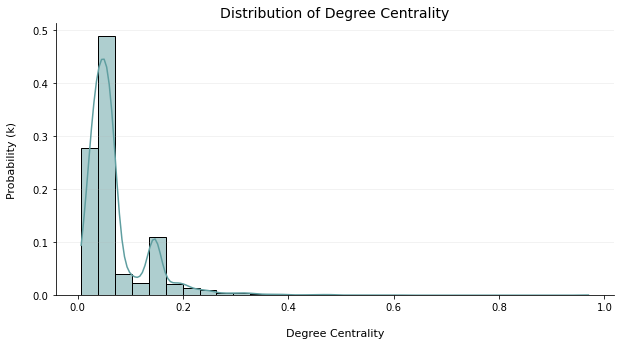

In [179]:
measureStats(nx.degree_centrality(gHashtagCoOccurrence), "Degree Centrality", r=3)
densityPlot(nx.degree_centrality(gHashtagCoOccurrence), "Degree Centrality", bins=30, height=5, width=10, adjust=False, kde=True)

The degree centrality scores range from 0.7% to 97%, with an average of 7.2%. So on average each node has an edge to 7.2% of all other node, i.e. each hashtag has occurred with 7.2% of all other hashtags. The distribution is strongly skewed to the right. 

28% of nodes have a degree centrality score of between 0 and 0.033, i.e. connections to 0-3.3% of nodes. The highest peak is between 0.033-0.066, with 48% of nodes within this range. Less than 20% have a score between 0.066 and 0.2, with about 6%having a score between 0.3-0.3. Less than 1% have a score above this.

We can check which #s have the highest degrees:

In [180]:
print("5 highest degree centrality values:\n")
highestDegree=pd.Series(nx.degree_centrality(gHashtagCoOccurrence)).round(decimals=2).sort_values(ascending=False)
print(highestDegree.head(5))

5 highest degree centrality values:

#covid19         0.97
#covid           0.60
#research        0.56
#coronavirus     0.52
#mentalhealth    0.48
dtype: float64


The nodes with the highest degree in this co-occurrence network (appear with the largest amount og other hashtags) are also the hashtag nodes which had the highest degree in the user-hashtag network (tweeted by the largest amount of users).  We can plot a scatter plot of degree of the hashtags in the user hashtag and hashtag co presence networks:



Correlation Coefficient:  0.767 



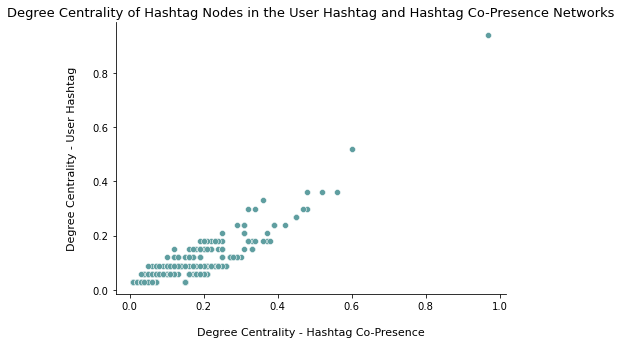

In [181]:
scatter(nx.degree_centrality(gHashtagCoOccurrence), hashtagDegreeC, reg=False, 
        label1="Degree Centrality - Hashtag Co-Presence", 
        label2="Degree Centrality - User Hashtag", 
        title="Degree Centrality of Hashtag Nodes in the User Hashtag and Hashtag Co-Presence Networks", 
        printSeries=False)

There is a strong positive relationship between the degree of hashtag nodes in the hashtag co-presence and the user-hashtag networks. The correlation coefficient is 0.767. Thus, nodes which have been tweeted with a large number of other hashtags, also tend to have been tweeted by a larger number of users, and hashtag nodes which have not appeared with many other hashtags tend to have been tweeted by less users.

covid19 has the highest degree. For the nodes which covid19 has an edge to we can compare the edge weight and the degree of the node. There are too many nodes to plot a meaningful visualisation, so instead I will construct a pandas dataframe and compare the values:

In [182]:
s1=weightSeriesFunc(gHashtagCoOccurrence)["#covid19"]
s2=pd.Series(nx.degree_centrality(gHashtagCoOccurrence))
s=pd.concat([s1, s2], axis=1).rename(
    columns={0:"Edge Weight", 1:"Degree"}).sort_values(by="Edge Weight", ascending=False)

print(s.head(12))

                       Edge Weight    Degree
#covid                        16.0  0.600937
#coronavirus                  12.0  0.524405
#blackhistorymonth            12.0  0.482624
#worldmentalhealthday         11.0  0.355720
#staysafe                      9.0  0.340102
#womeninstem                   9.0  0.446310
#engineering                   9.0  0.469348
#classof2020                   9.0  0.318235
#stem                          8.0  0.311597
#climatechange                 8.0  0.421710
#innovation                    8.0  0.450605
#students                      8.0  0.310816


We can see that the hashtags that covid19 appears with the most (highest weight) all have high degrees, i.e. are also connected to a large number of nodes. 

Next we can construct a subgraph containing the nodes which have the highest degrees:

In [183]:
# using the highestDegree series constructed above, construct a subgraph containing the 30 nodes
# with the highest degrees

subGHighestDegree=gHashtagCoOccurrence.subgraph(list(highestDegree.head(30).index))

print("Nodes: ", subGHighestDegree.number_of_nodes(), ", Edges: ", subGHighestDegree.number_of_edges())
print("Connected: ", nx.is_connected(subGHighestDegree))
print("Density: %.2f" %nx.density(subGHighestDegree))

Nodes:  30 , Edges:  424
Connected:  True
Density: 0.97


The subgraph is fully connected. We can see that it has a very high density. Of all of the potential edges between the 30 nodes with the highest degrees, 97% of these are actual edges. Thus there is a very high level of connectivity between all of the nodes which have a lot of edges. The nodes with the largest number of edges tend to be connected to the other nodes with a very large number of edges

We can plot the graph, letting the node size and colour indicate the node degree, and the edge colour indicate the edge weight:

In [184]:
def drawSubgraph(G, measure, title, edge_labels,labelAll=True, size=100, 
                 seed=675, k=1.6, scale=1, width=15, height=7, weightFont=7, adjustCmap=False):

    plt.figure(3, figsize=(width,height))
    
    pos = nx.spring_layout(G, seed=seed, k=k, scale=scale)
    
    if adjustCmap:
        cmap = mpl.cm.Blues(np.linspace(0,5,30))
        cmap = mpl.colors.ListedColormap(cmap[4:,:-1])
        
    else: cmap=mpl.cm.Blues
        
    # nodes
    
        # draw nodes - size and colour determined by value of centrality measure
    nx.draw_networkx_nodes(G, pos, node_size=[v * size for v in measure.values()], # node size
                                   cmap=cmap, 
                                   node_color=list(measure.values()), # node colour
                                   nodelist=measure.keys())
    
    # node labels
    
    labels=dict(zip(G.nodes(), G.nodes()))
    
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=9)
  
    # edges
    
    cmap = mpl.cm.Blues(np.linspace(0,1,20))
    cmap = mpl.colors.ListedColormap(cmap[2:,:-1])
    
                    # get weights so that colour of edge can indicate weight
    edges,weights = zip(*nx.get_edge_attributes(G,'weight').items())



        #     width=([w/edgeWidth for w in weights])

    nx.draw_networkx_edges(G,pos, edgelist=edges, edge_color=weights, 
                             width=0.5, edge_cmap=cmap)
    
    nx.draw_networkx_edge_labels(G, pos,edge_labels=edge_labels, font_size=weightFont)
    
    plt.axis('off')

    # add title
    
    plt.title(label = title, fontsize = 14)

    plt.show()


In [185]:
# get a series of the edges and weights in the sub graph, sort ascending, and get the first 15
w=weightSeriesFunc(subGHighestDegree).sort_values(ascending=False).head(15)

# get the values for the edge labels
weightLabels={} # dictionaty with (kingscollegelon, node) : edgeWeight
for node in w.index:
    weightLabels[node]=w[node]

/Users/DervlaScully/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 12540 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/DervlaScully/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 12540 missing from current font.
  font.set_text(s, 0, flags=flags)


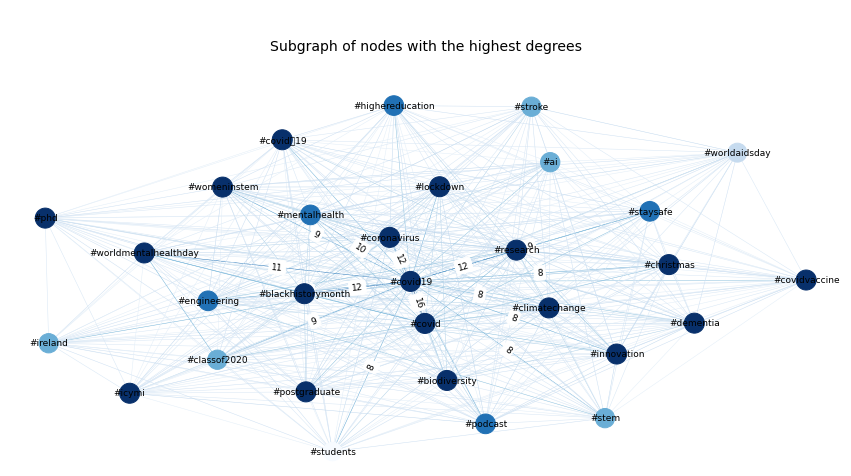

In [186]:
# plot the subgraph
drawSubgraph(subGHighestDegree, nx.degree_centrality(subGHighestDegree), 
             title="\n\nSubgraph of nodes with the highest degrees\n\n", labelAll=True, 
             size=400, seed=675, k=1.6, scale=1, edge_labels=weightLabels, weightFont=9)

We can see above that there is a very large number of edges, as expected as the density is 97%. There are also high weights on a lot of the edges, particularly between the nodes with the highest degrees. The 15 highest edge weights are labelled, and these are all between nodes with very high degree.

Thus the hashtags which appear with the most other hashtags (high degree) tend to appear together, and they appear together frequently (high edge weight)


Next we can look at weighted degree. The weighted degree of a node is the sum of the weights on the edges connected to that node:

In [187]:
# add weighted degree attribute to each node
def weightedDegree(g):
    
    # nodes in the network -> Pandas DataFrame
    df = pd.DataFrame(g.nodes(), columns = ["node"])

    # for each node, sum up the edge weights
    for node in g.nodes():

        # weighted degree initialised to 0
        weightedDegree = 0
        
        # for each edge connected to the node
        for edge in g.edges([node], data=True):
            
            # sum weight of each edge
            weightedDegree += edge[2]["weight"]
            
            # set weightedDegree node attribute for the node
        g.nodes[node]["weightedDegree"] = weightedDegree 

weightedDegree(gHashtagCoOccurrence)

Weighted Degree Summary Statistics:
	Min:  17
	Max:  3266
	Mean:  189.012
	Median:  137.0


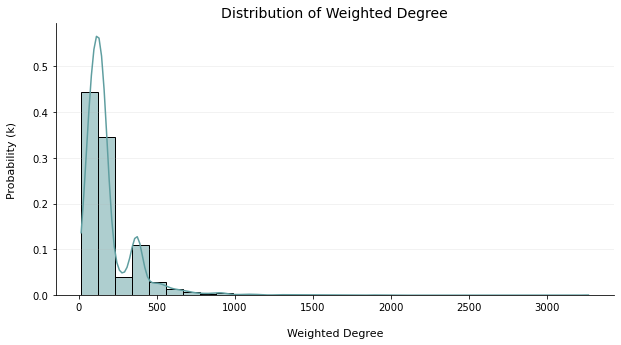

In [188]:
measureStats(nx.get_node_attributes(gHashtagCoOccurrence, "weightedDegree"), "Weighted Degree", r=3)
densityPlot(nx.get_node_attributes(gHashtagCoOccurrence, "weightedDegree"), "Weighted Degree", bins=30, height=5, width=10, adjust=False, kde=True)

The shape of the distribution of weighted degree is very similar to that of unweighted degree. Again the distribution is strongly skewed to the right. The range of weighted degrees is from 17 to 3266. The average weighted degree is 189. 

44% of nodes have a degree below 110, followed by 35% between 110-220, 4% from 220-330, 11% from 330-440 and 3% from 440-550. Almost 3% have a value between 550-100, with less than 1% having a value between 100-3266. 

We can check which nodes have the highest weighted degree:

In [189]:
print("5 highest weighted degree centrality values:\n")
print(pd.Series(nx.get_node_attributes(gHashtagCoOccurrence, 
                                       "weightedDegree")).round(decimals=2).sort_values(ascending=False).head(5))

print("\n5 highest degree centrality values:\n")
print(pd.Series(nx.degree_centrality(gHashtagCoOccurrence)).round(decimals=2).sort_values(ascending=False).head(5))

5 highest weighted degree centrality values:

#covid19              3266
#covid                1892
#research             1718
#coronavirus          1595
#blackhistorymonth    1498
dtype: int64

5 highest degree centrality values:

#covid19         0.97
#covid           0.60
#research        0.56
#coronavirus     0.52
#mentalhealth    0.48
dtype: float64


The nodes with the 5 highest weighted degrees are also the nodes with the highest unweighted degrees, in the same order. These are hashtags which occur with a larger number of other hashtags, and also tend to occur repeatedly with these. We can see below that the distribution for weighted and unweighted degree is very similar in shape:


Distribution of weighted vs unweighted degree:


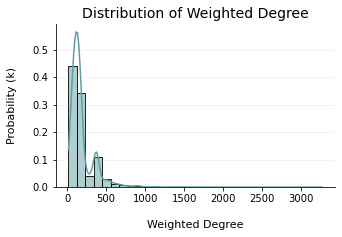

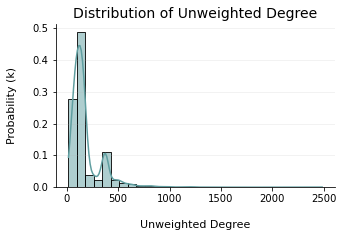

In [190]:
print("\nDistribution of weighted vs unweighted degree:")
densityPlot(nx.get_node_attributes(gHashtagCoOccurrence, "weightedDegree"), "Weighted Degree", bins=30, height=3, width=5, adjust=False, kde=True)
densityPlot(dict(gHashtagCoOccurrence.degree()), "Unweighted Degree", bins=30, height=3, width=5, adjust=False, kde=True)

__Eigenvector Centrality__

Eigenvector centrality attempts to capture the qualitative aspect of the connections of a vertex. It is a basic extension of degree centrality, which defines centrality of a node as proportional to its neighbors’ importance. When we sum up all connections of a node, not all neighbors are equally important and eigenvector centrality takes this into account. 

For eigenvector centrality, relative scores are assigned to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes. Mathematically, the eigenvector centrality of a node is the sum of the neighbors’ eigenvector centralities divided by λ — the largest eigenvalue of the adjacency matrix of the network. 

High eigenvector centrality identifies nodes that are surrounded by other nodes with high eigenvector centrality. This can be used to locate clusters/groups of interconnected nodes with high prestige.

Eigenvector Centrality Summary Statistics:
	Min:  0.001
	Max:  0.072
	Mean:  0.011
	Median:  0.004


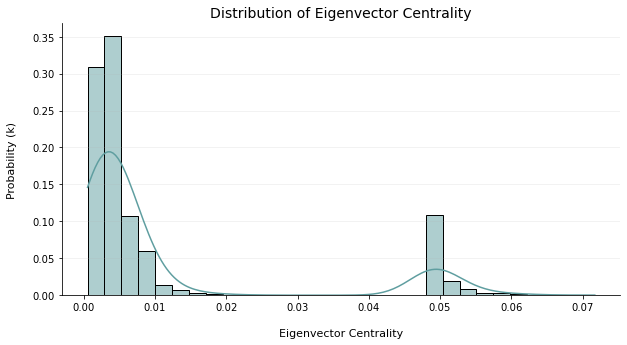

In [191]:
measureStats(nx.eigenvector_centrality(gHashtagCoOccurrence), "Eigenvector Centrality", r=3)
densityPlot(nx.eigenvector_centrality(gHashtagCoOccurrence), 
          "Eigenvector Centrality",bins=30, height=5, width=10, adjust=False, kde=True)

The distribution for eigenvector centrality is bimodal. The values range from 0.001 to 0.072, with a mean of 0.011. 

82% of hashtags have an eigenvector centrality score between 0.001 and 0.01. About 3% have a score between 0.01 and 0.02. 10.5% have a score between 0.048-0.05, and the remaining 4.5% have a score above this. 

We can check which nodes have the highest eigenvector centrality values:

In [192]:
print("10 highest eigenvector  centrality values:\n")
print(pd.Series(nx.eigenvector_centrality(gHashtagCoOccurrence)).round(decimals=3).sort_values(ascending=False).head(10))

10 highest eigenvector  centrality values:

#covid19              0.072
#research             0.063
#covid                0.063
#mentalhealth         0.062
#climatechange        0.061
#coronavirus          0.061
#blackhistorymonth    0.061
#dementia             0.060
#biodiversity         0.060
#engineering          0.059
dtype: float64


covid19 has the highest eigenvector centrality, as well as having the highest unweighted and weighted degree. This is followed by covid, research and mentalhealth.

A lot of these nodes with high eigenvector centrality scores - important nodes connected to other important nodes - also had a large number of edges (high degree centrality). We can investigate the realtionship between these metrics:

__Scatter Plot of Degree & Eigenvector Centrality in the Hashtag Co-Occurrence Network__



Correlation Coefficient:  0.806 



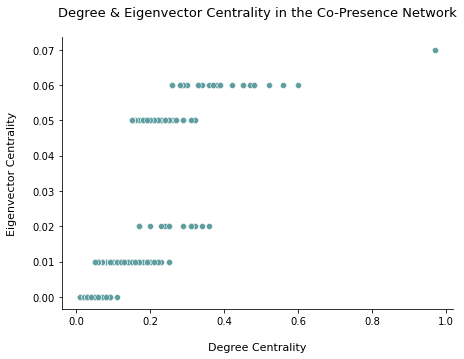

In [193]:
scatter(nx.degree_centrality(gHashtagCoOccurrence), nx.eigenvector_centrality(gHashtagCoOccurrence), 
        reg=False, 
        label1="Degree Centrality", 
        label2="Eigenvector Centrality", 
        title="Degree & Eigenvector Centrality in the Co-Presence Network\n", 
        printSeries=False)

There is a strong positive relationship between degree and eigenvector centrality, with a correlation coefficient of 0.8. So hashtags which occur with the largest number of other hashtags tend to be important hashtags connected to other important hashtgs, i.e. having a high eigenvector centrality score. Hashtags which do not occur with very many other hashtags tend to occur with less important hashtags.

covid19 has the highest eigenvector centrality. We can check the eigenvector centrality scores of the nodes which covid19 appears with most frequently:

In [194]:
s1=weightSeriesFunc(gHashtagCoOccurrence)["#covid19"]
s2=pd.Series(nx.eigenvector_centrality(gHashtagCoOccurrence))
s=pd.concat([s1, s2], axis=1).rename(
    columns={0:"Edge Weight", 1:"Eigenvector Centrality"}).sort_values(by="Edge Weight", ascending=False)

print(s.head(7))

                       Edge Weight  Eigenvector Centrality
#covid                        16.0                0.063183
#coronavirus                  12.0                0.061174
#blackhistorymonth            12.0                0.061264
#worldmentalhealthday         11.0                0.022460
#staysafe                      9.0                0.019170
#womeninstem                   9.0                0.058845
#engineering                   9.0                0.058834


The hashtags that covid19 appears with the most also have very high eigenvector centraltiy scores. These are all important nodes which are connected to other important nodes.

We can again plot a subgraph of the 50 nodes which have the highest eigenvector centrality scores:

In [195]:
# get a series of the nodes and eigenvector centrality scores, sort descending
eig=pd.Series(nx.eigenvector_centrality(gHashtagCoOccurrence)).sort_values(ascending=False)

# construct a subgraph of the first 50 nodes in the series
subGHighestEigenvector=gHashtagCoOccurrence.subgraph(list(eig.head(50).index))

print("Nodes: ", subGHighestEigenvector.number_of_nodes(), ", Edges: ", subGHighestEigenvector.number_of_edges())
print("Connected: ", nx.is_connected(subGHighestEigenvector))
print("Density: %.2f" %nx.density(subGHighestEigenvector))

Nodes:  50 , Edges:  1225
Connected:  True
Density: 1.00


In [196]:
# add labels for the 20 highest edge weights:

# get a series of the edge weights in the subgraph, sort ascending, take the top 20
w=weightSeriesFunc(subGHighestEigenvector).sort_values(ascending=False).head(20)
# get the values for the edge labels
weightLabels={} 
for node in w.index:
    weightLabels[node]=w[node]

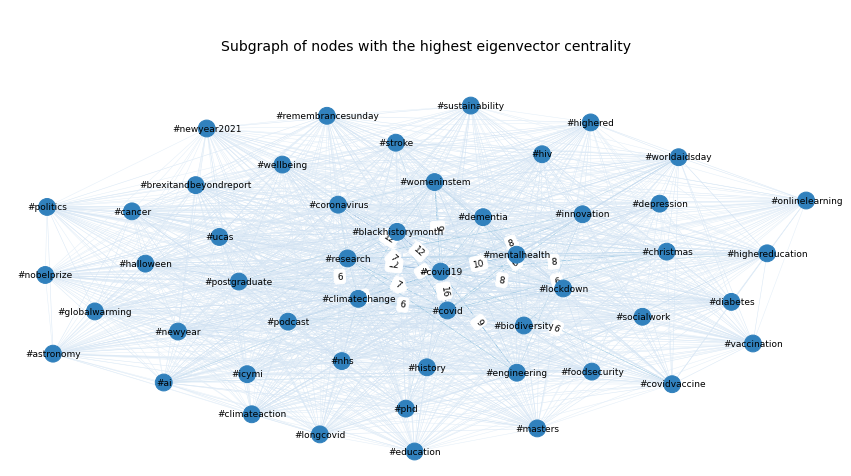

In [197]:
drawSubgraph(subGHighestEigenvector, nx.eigenvector_centrality(subGHighestEigenvector), 
             title="\n\nSubgraph of nodes with the highest eigenvector centrality\n\n", labelAll=True, 
             size=2000, seed=675, k=1.6, scale=1, edge_labels=weightLabels, weightFont=9, adjustCmap=True)

We can see from above that the 50 nodes with the highest eigenvector centralities each have an edge to each other, i.e. a density of 1. Many of these edges also have high edge weights as shown above.  So these important nodes with high eigenvector centrality scores are connected to other important nodes with high eigenvector centrality scores.

We can see below that for the 375 hashtags with the highest eigenvector centrality scores, every single node has an edge to every other node, i.e. density=1. So in the network there is a very high level of connectivity between the nodes with the highest eigenvector centrality scores. 

In [198]:
subGHighestEigenvector2=gHashtagCoOccurrence.subgraph(list(eig.head(375).index))
print("Subgraph of 375 #s with highest eigenvector centrality scores:")
print("Density: %.2f" %nx.density(subGHighestEigenvector2))

subGHighestEigenvector3=gHashtagCoOccurrence.subgraph(list(eig.head(376).index))
print("\nSubgraph of 376 #s with highest eigenvector centrality scores:")
print("Density: %.2f" %nx.density(subGHighestEigenvector3))

Subgraph of 375 #s with highest eigenvector centrality scores:
Density: 1.00

Subgraph of 376 #s with highest eigenvector centrality scores:
Density: 0.99


__Betweenness Centrality__

This metric captures a different view of the importance of a node. The previous centrality measures do not capture the idea of brokerage. Betweenness centrality identifies strategic linkages, “brokers” or “bridging nodes” in a network. It finds the bottleneck nodes in a network.

Nodes that occur on many shortest paths between other nodes in the network have a high betweenness centrality score.

Betweenness centrality assumes that the nodes which connect most of the other nodes in the shortest possible way are most important.

As mentioned previously, many of the other centrality metrics, such as degree centrality, are local and depend only on the neighbourhood of a node, but we cannot say much about the opportunities for global outreach from these metrics. Betweenness centrality is a global metric. If the betweenness centrality of a node is high, the node is potentially a crucial go-between and has a brokerage capability. The removal of such a node would disrupt communications, lower closeness centralities, and possibly split the network into disconnected components. Thus, it is a very important centrality metric.

As with the previous network, this takes too long to run and my laptop over heats trying to do so. This occurs even trying to calculate the betweenness centrality for a small number of nodes here, so I have had to leave thios out entirely. I had hoped once again here to look at the distribution with a histogram, investigate which nodes had the highest betweenness scores, and construct a meaningful ego network or subgraph from this. Because of this I have commented out the code below.

In [199]:
# measureStats(nx.betweenness_centrality(gHashtagCoOccurrence), "Betweenness Centrality", r=3)
# densityPlot(nx.betweenness_centrality(gHashtagCoOccurrence), 
#           "Betweenness Centrality",bins=30, height=5, width=10, adjust=False, kde=True)

__Closeness Centrality__

The closeness centrality of a node is defined as the reciprocal mean distance from the node to all other reachable nodes in the network. It shows how close the node is to the rest of the graph. This is again a global metric as it does not depend only on the nodes neighbourhood.

It is calculated as 1 / the average of the shortest path length from the node to every other node in the network.

Closeness centrality indicates nodes as more central if they are closer to most of the nodes in the graph. This strongly corresponds to visual centrality — a node that would appear toward the center of a graph when we draw it usually has a high closeness centrality. Closeness can be regarded as a measure of how fast it will take to spread information to all other nodes. If a node has high closeness centrality, it is in a position to spread information quickly. These nodes can be important influencers of the network. It highlights nodes that may reach any other nodes within a few hops and nodes that may be very distant in the graph.

Closeness Centrality Summary Statistics:
	Min:  0.465
	Max:  0.97
	Mean:  0.517
	Median:  0.514


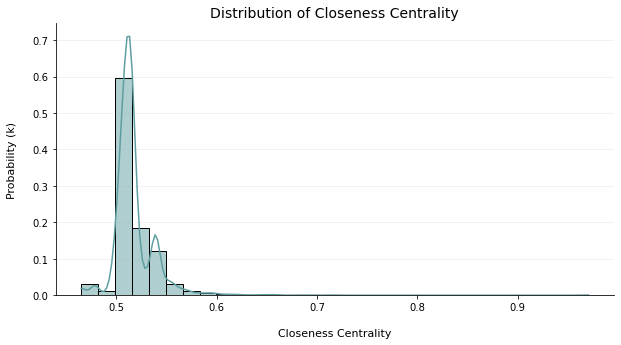

In [200]:
measureStats(nx.closeness_centrality(gHashtagCoOccurrence), "Closeness Centrality", r=3)
densityPlot(nx.closeness_centrality(gHashtagCoOccurrence), 
          "Closeness Centrality",bins=30, height=5, width=10, adjust=False, kde=True)

The distribution of closeness centrality is strongly skewed the to right, with an approcimately normal distribution for over 99% of the values, followed by a long right skew. The closeness centralities range from 0.465 to 0.97, average distances of 2.15-1.03. The average value is 0.517, i.e. on average each node is an average distance of 1.93 from all other nodes in the network.

4% have a value below 0.5. 60% are between 0.517-0.53, and 31% between 0.53-0.56. Just below 5% are between 0.56-0.6, leaving less than 1% above 0.6.

We can check which nodes have the highest closeness centrality scores:

In [201]:
print("5 highest closenesscentrality values:\n")
print(pd.Series(nx.closeness_centrality(gHashtagCoOccurrence)).round(decimals=3).sort_values(ascending=False).head(5))

5 highest closenesscentrality values:

#covid19              0.970
#covid                0.715
#research             0.693
#coronavirus          0.678
#blackhistorymonth    0.659
dtype: float64


Once again, covid19 has the highest value. It is an average distance of 1.03 from all other nodes. This is unsurprising as it is directly connected (distance of 1) to 97% of nodes, as seen in the degree centrality calculation. We can see again that the nodes with the highest closeness centrality scores, i.e. the nodes which are the shortest mean distance to all other nodes, are also the nodes which had the highest degree centralities. 

We can plot a scatter plot of degree centrality and closeness centrality to investigate this relationship:



Correlation Coefficient:  0.95 



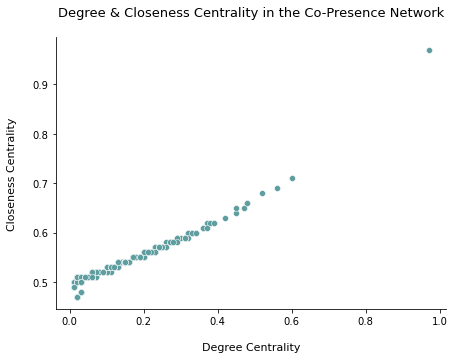

In [202]:
scatter(nx.degree_centrality(gHashtagCoOccurrence), nx.closeness_centrality(gHashtagCoOccurrence), 
        reg=False, 
        label1="Degree Centrality", 
        label2="Closeness Centrality", 
        title="Degree & Closeness Centrality in the Co-Presence Network\n", 
        printSeries=False)

As expected, there is a very strong positive linear relationship between degree and closeness centrality, with a correlation coefficient of 0.95. The nodes with the highest number of direct connections tend to be closest to all other nodes on average. The nodes with less direct connections are a larger distances on average from all other nodes.

We saw that covid19 had the highest closeness centrality score. We can investigate the closeness centrality scores of the nodes which covid19 has appeared with the most (highest edge weights): 

In [203]:
s1=weightSeriesFunc(gHashtagCoOccurrence)["#covid19"]
s2=pd.Series(nx.closeness_centrality(gHashtagCoOccurrence))
s=pd.concat([s1, s2], axis=1).rename(
    columns={0:"Edge Weight", 1:"Closeness Centrality"}).sort_values(by="Edge Weight", ascending=False)

print(s.head(7))

                       Edge Weight  Closeness Centrality
#covid                        16.0              0.714764
#coronavirus                  12.0              0.677693
#blackhistorymonth            12.0              0.659032
#worldmentalhealthday         11.0              0.608169
#staysafe                      9.0              0.602446
#womeninstem                   9.0              0.643629
#engineering                   9.0              0.653316


The nodes which covid19 appears with most frequently also have very high closeness centrality scores.

We can again plot a subgraph of the nodes with the highest closeness centrality scores, and let the node colour and size indicate closeness centrality, and the edge colour indicate edge weight:

In [204]:
# series of closeness centrality scores, sort descending
cc=pd.Series(nx.closeness_centrality(gHashtagCoOccurrence)).sort_values(ascending=False)

# subgraph of 30 nodes with the highest closeness centrality scores
subGHighestCC=gHashtagCoOccurrence.subgraph(list(cc.head(30).index))

print("Nodes: ", subGHighestCC.number_of_nodes(), ", Edges: ", subGHighestCC.number_of_edges())
print("Connected: ", nx.is_connected(subGHighestCC))
print("Density: %.2f" %nx.density(subGHighestCC))

Nodes:  30 , Edges:  424
Connected:  True
Density: 0.97


In [205]:
# construct series of the edge weights in the subgrabh
w=weightSeriesFunc(subGHighestCC).sort_values(ascending=False).head(20)
# label the 20 highest edge weights
weightLabels={} 
for node in w.index:
    weightLabels[node]=w[node]

/Users/DervlaScully/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 12540 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/DervlaScully/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 12540 missing from current font.
  font.set_text(s, 0, flags=flags)


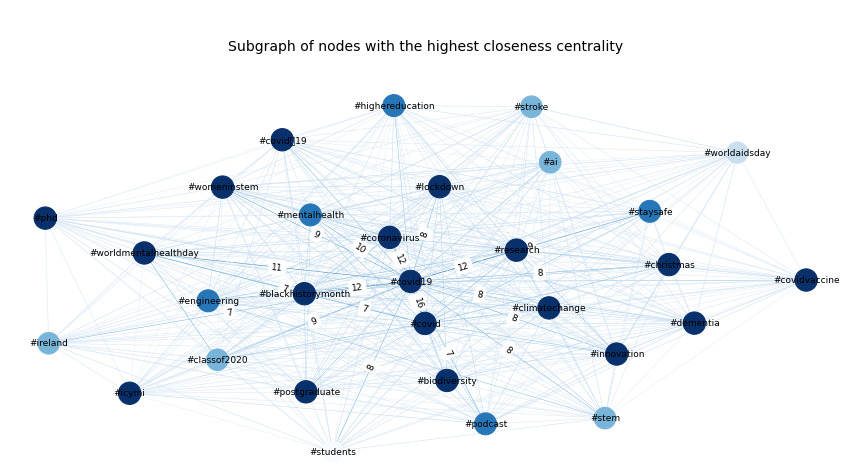

In [206]:
drawSubgraph(subGHighestCC, nx.closeness_centrality(subGHighestCC), 
             title="\n\nSubgraph of nodes with the highest closeness centrality\n\n", labelAll=True, 
             size=500, seed=675, k=1.6, scale=1, edge_labels=weightLabels, weightFont=9, adjustCmap=False)

The 30 nodes with the highest closeness centrality scores have a very large number of edges between them, with a density of 97%. The nodes with the highest closeness centrality scores tend to have the highest edge weights. i.e. nodes which are closest to all other nodes tend to appear together most frequently.

I have characterised the structure and connectivity of the hashtag co-occurrence network, and identified important nodes in the network based on various centrality measures, so this concludes my exploration of the hashtag co-occurrence network.

__Future Analysis__

For future analysis I would like to explore the twitter API to retrieve more information about the users which were mentioned and replied to by the 33 nodes which this project was based around. For example, examining the follower and following count of these users, and if they are verified. I would also like to examine the following count for the 33 original nodes, and see if there is any correlation between the number of users the nodes are following within the network and the numnber of users they are following overall, as I did for the follower count and in-degree. 

__Conclusion__

I thoroughly enjoyed this assignment. I found it very interesting to use all of the various centrality measures discussed in the class to practice on a real world example. It was very interesting to be comparing such different networks, working with directed, undirected, weighted, unweighted and bipartite networks all at once. It was interesting to compare the centrality measures for such vastly different netowrks, which differed greatly in size. I found it interesting trying to come up with meaningful visualisations for the very large networks, such as the reply and mention networks where plotting the entire network had too many nodes and edges for any useful information to be extracted. This was probably the most challenging aspect of the project, but something I really enjoyed. Overall I found this project very enjoyable, and have really enjoyed this module overall.

#### <font color='darkcyan'>Dervla Scully 18329511</font>